# Customer Segmentation

In [1]:
#Accuracy, Precision, Recall, F1 and when you use them?

In [2]:
#Basic
import numpy as np
import pandas as pd
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer

#Models
from sklearn.cluster import KMeans
from kmodes.kmodes import KModes
from sklearn.neighbors import NearestNeighbors

from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
import warnings

#Colors
from matplotlib import colors
from matplotlib.colors import ListedColormap
pal = ["#F4C852", "#FE8F66", "#50E0B4", "#763FFC", "#5479FF"]
cmap = colors.ListedColormap(["#F4C852", "#FE8F66", "#50E0B4", "#763FFC",'#A8BAFD', "#5479FF"])

In [3]:
data = pd.read_csv('Data.csv.xls', sep = '\t')
data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


# ----------CLEANING----------

## Remove Null

In [4]:
data = data.dropna()

## Feature Engineering

## Customer for

In [5]:
#newest customer will be reference as last date since I do not have a dataset publication date 
data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"])
dates = []
for i in data["Dt_Customer"]:
    i = i.date()
    dates.append(i)  
d1 = max(dates) 
d = pd.to_datetime(data["Dt_Customer"])
data["Customer_For_"] = pd.to_datetime(d1) - pd.to_datetime(d)
data['Customer_For'] = pd.DataFrame(data['Customer_For_'].astype('timedelta64[D]'))

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1978598414.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"])
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1978598414.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"])
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1978598414.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

## Age

In [6]:
data["Age"] = 2015 - data["Year_Birth"]

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1774339387.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Age"] = 2015 - data["Year_Birth"]


## Spent

In [7]:
data["Spent"] = data["MntWines"]+ data["MntFruits"]+ data["MntMeatProducts"]+ data["MntFishProducts"]+ data["MntSweetProducts"]+ data["MntGoldProds"]

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3137231044.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Spent"] = data["MntWines"]+ data["MntFruits"]+ data["MntMeatProducts"]+ data["MntFishProducts"]+ data["MntSweetProducts"]+ data["MntGoldProds"]


## Adult

In [8]:
data["Adults"]= data["Marital_Status"].replace({"Married":2, "Together":2, "Absurd":1, "Widow":1, "YOLO":1, "Divorced":1, "Single":1, "Alone":1})

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3744675753.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Adults"]= data["Marital_Status"].replace({"Married":2, "Together":2, "Absurd":1, "Widow":1, "YOLO":1, "Divorced":1, "Single":1, "Alone":1})


## Children

In [9]:
data["Children"]=data["Kidhome"]+data["Teenhome"]

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3542201561.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Children"]=data["Kidhome"]+data["Teenhome"]


## Household Size

In [11]:
data["Household_Size"] = data["Adults"] + data["Children"]

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/509199580.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Household_Size"] = data["Adults"] + data["Children"]


## Education

In [12]:
data["Education"]=data["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1389427484.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Education"]=data["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})


## Other Adjustments

In [13]:
#For clarity
data=data.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

#Dropping some of the redundant features
data = data.drop(["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID", "Customer_For_"], axis = 1)

In [14]:
#Encode categotical variable
datacat = data.select_dtypes(exclude=["number"])
LE=LabelEncoder()
for i in datacat:
    data[i]=data[[i]].apply(LE.fit_transform)

## Outliers

In [15]:
#Gather numerial columns
datanum = data.select_dtypes(include=np.number)
datanum.head()
datanum.shape

def plot_boxplot(df, feature):
    print(feature)
    df.boxplot(column=[feature])
    plt.grid(False)
    plt.show()

Education


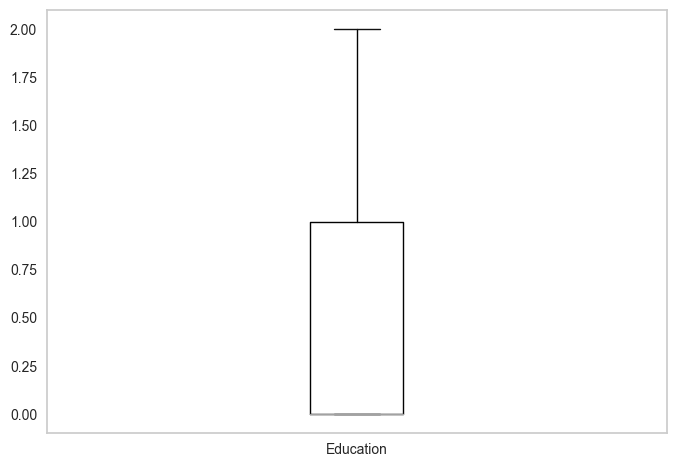

Income


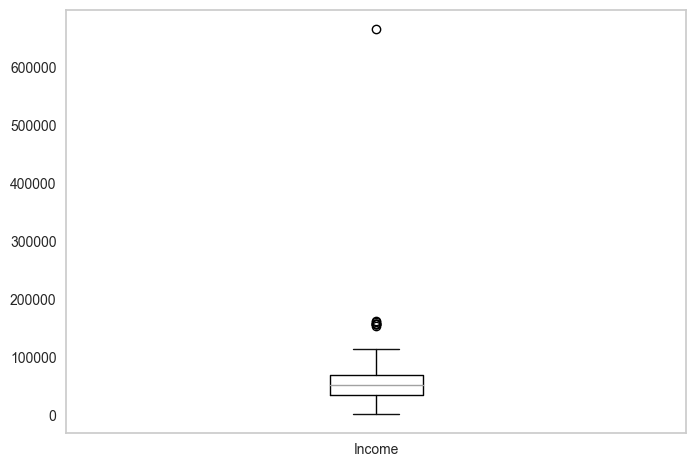

Kidhome


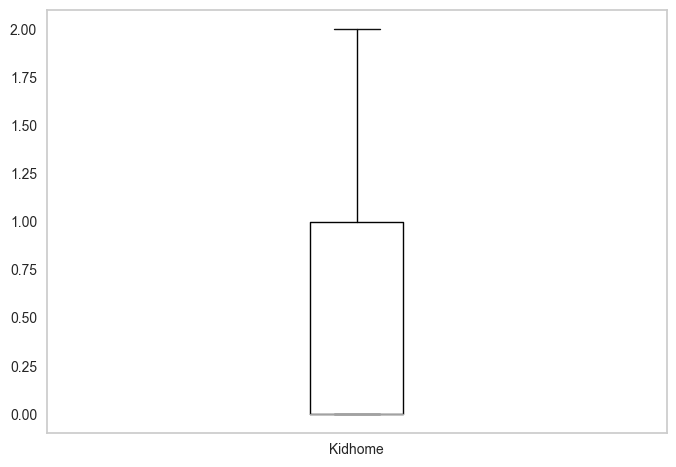

Teenhome


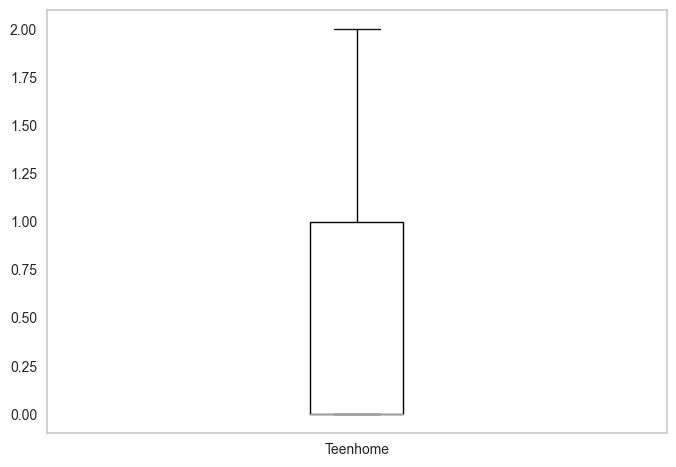

Recency


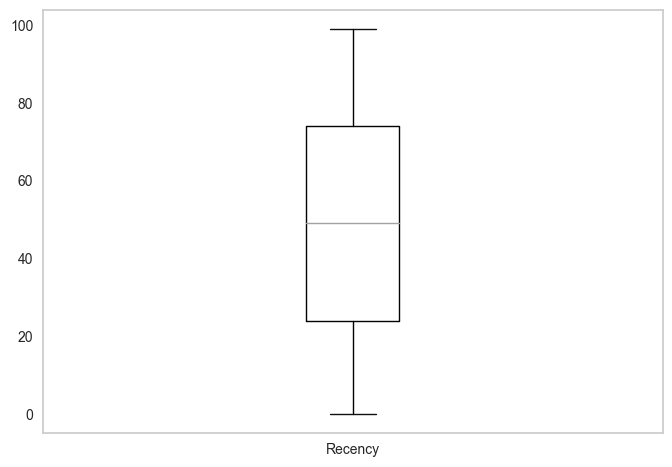

Wines


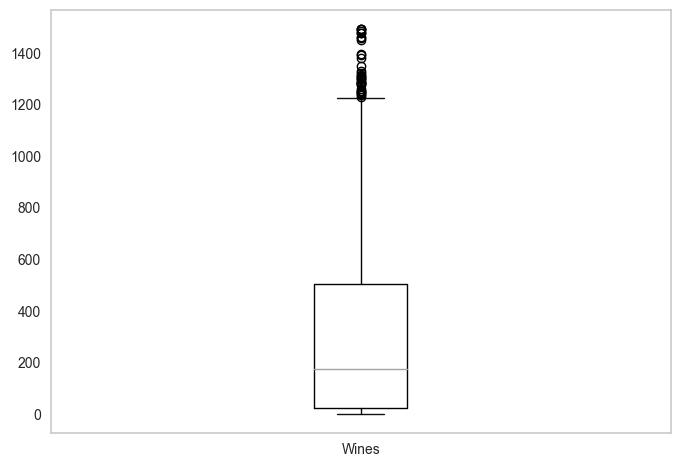

Fruits


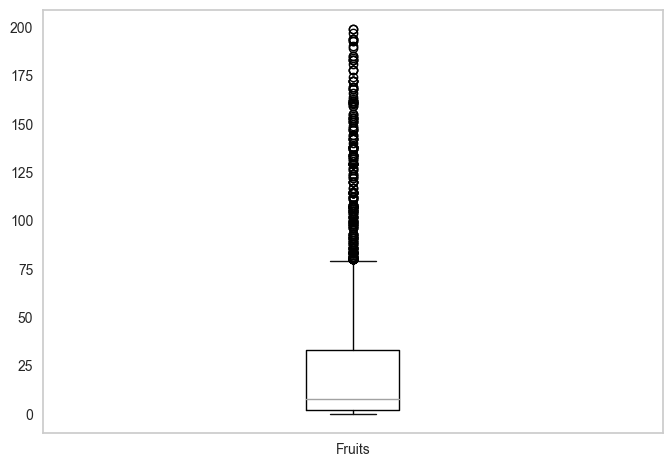

Meat


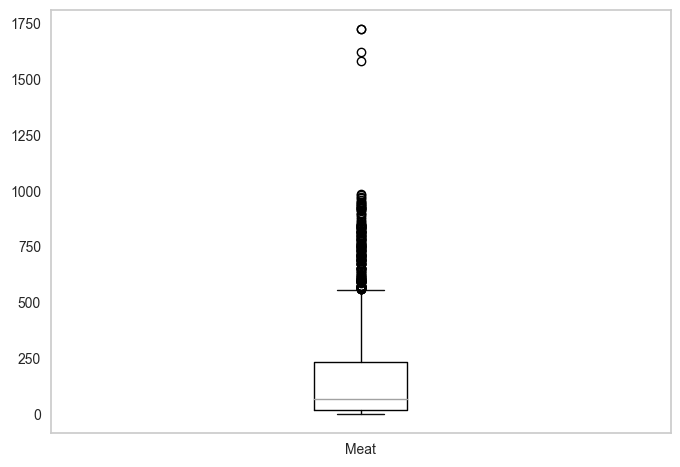

Fish


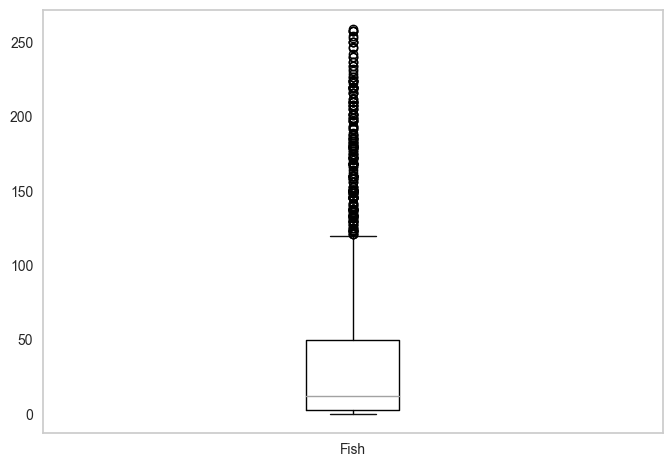

Sweets


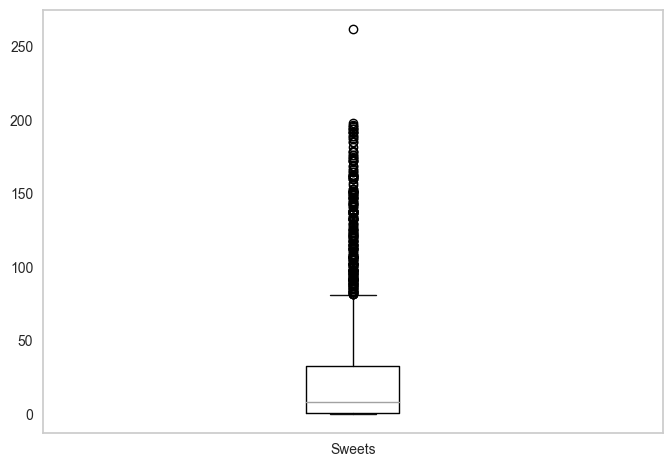

Gold


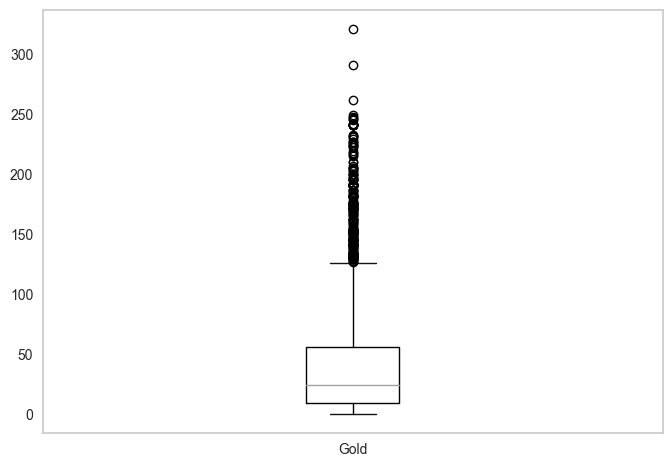

NumDealsPurchases


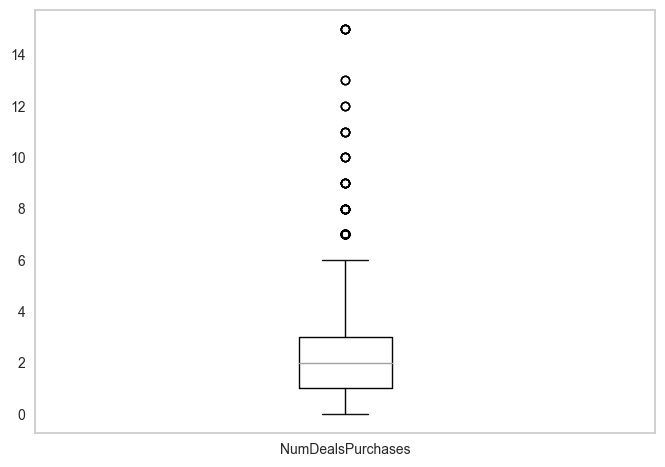

NumWebPurchases


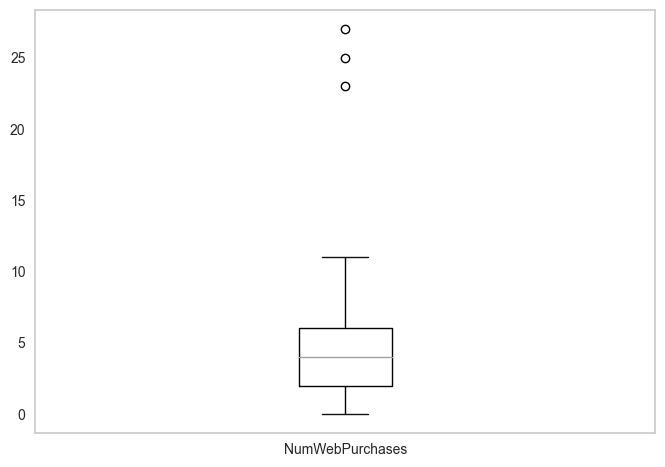

NumCatalogPurchases


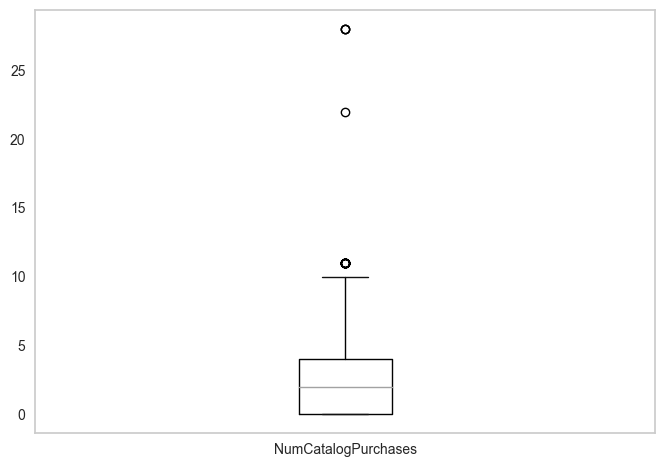

NumStorePurchases


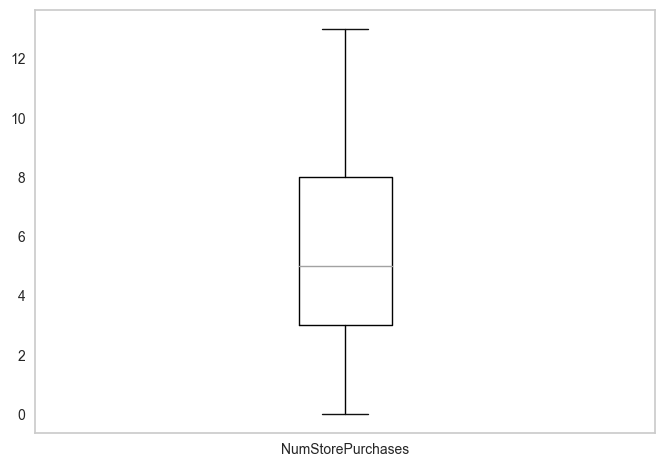

NumWebVisitsMonth


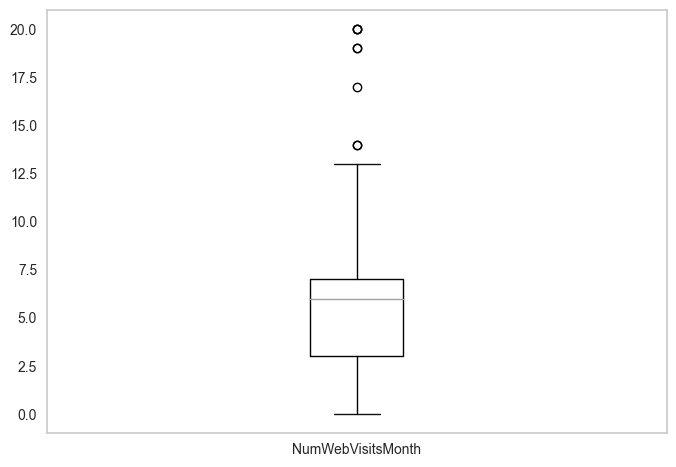

AcceptedCmp3


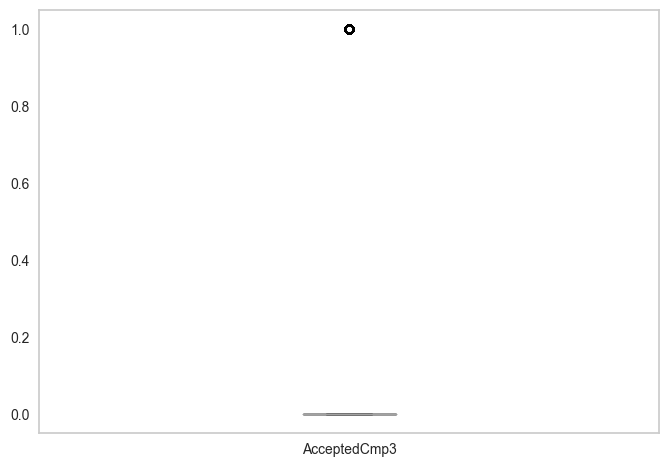

AcceptedCmp4


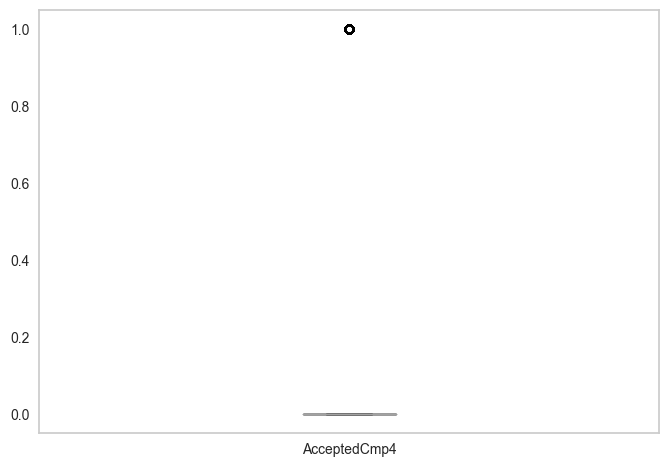

AcceptedCmp5


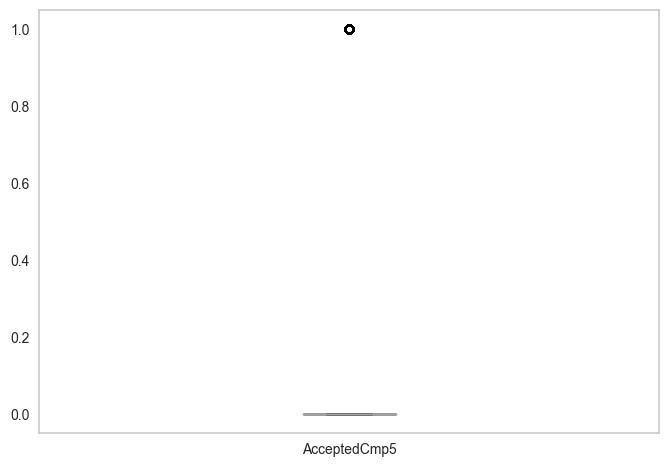

AcceptedCmp1


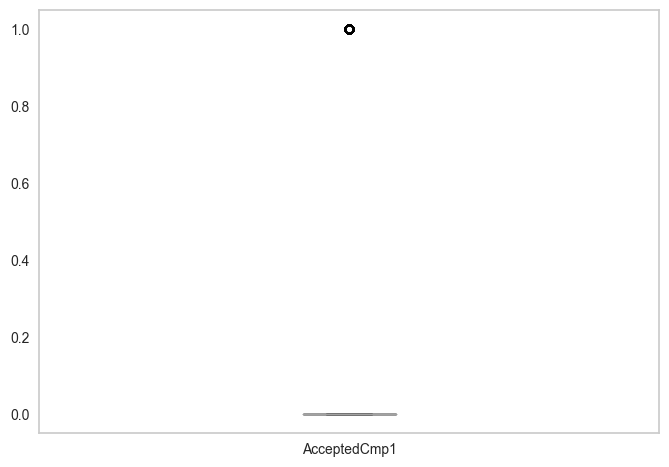

AcceptedCmp2


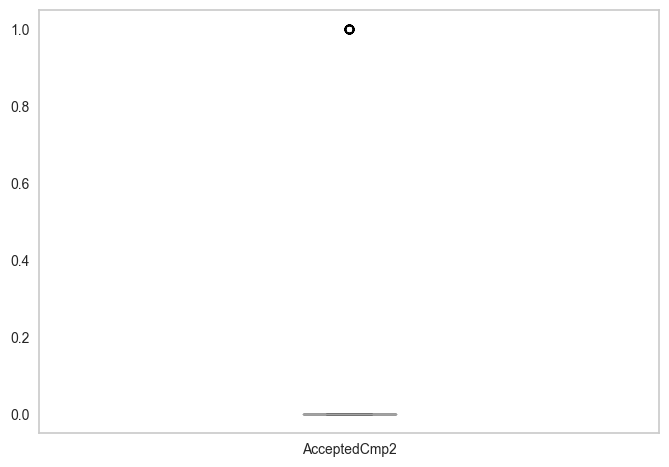

Complain


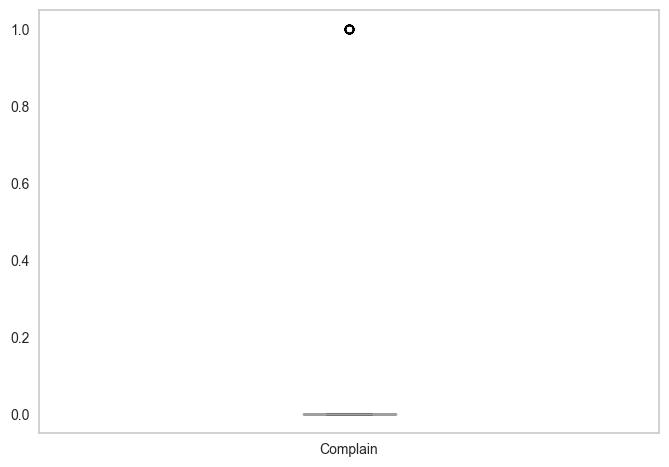

Response


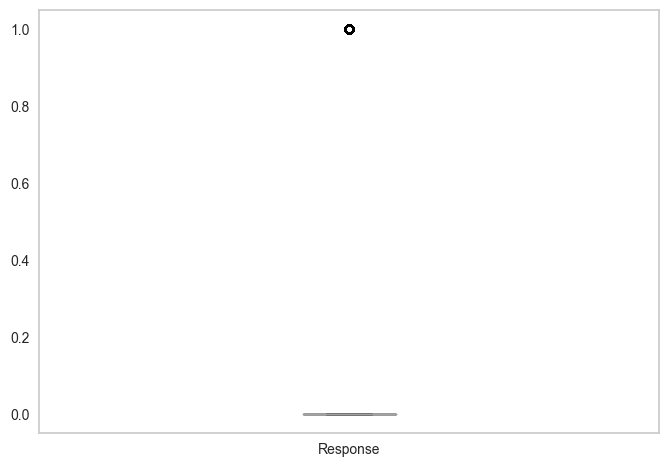

Customer_For


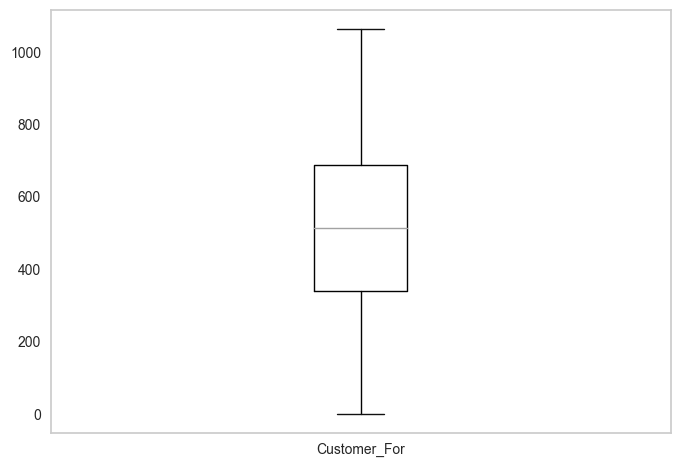

Age


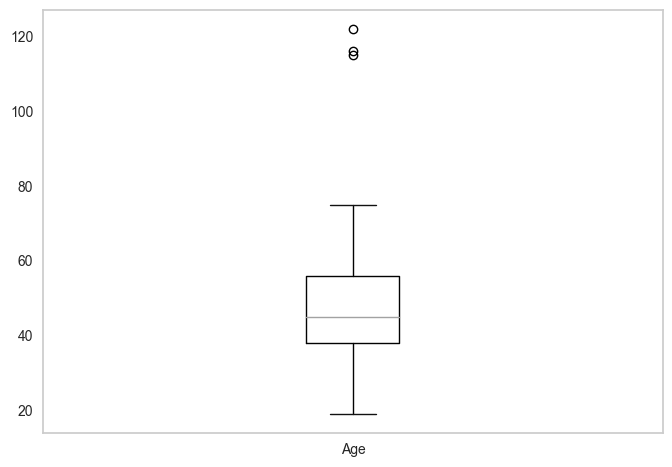

Spent


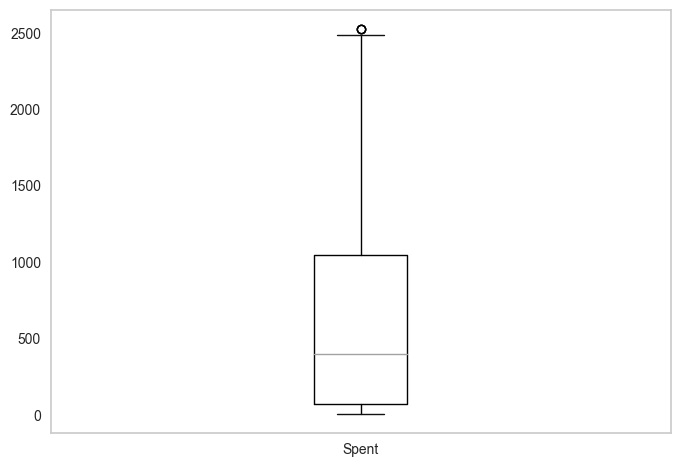

Adults


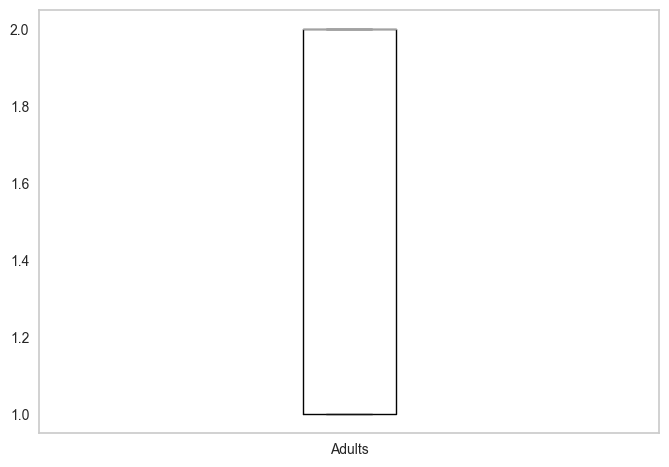

Children


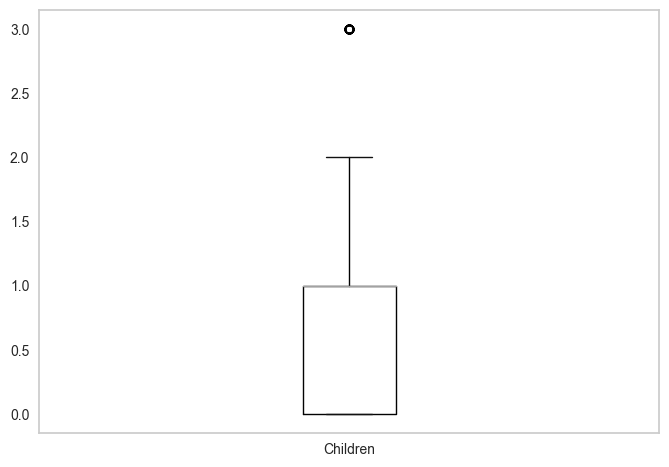

Household_Size


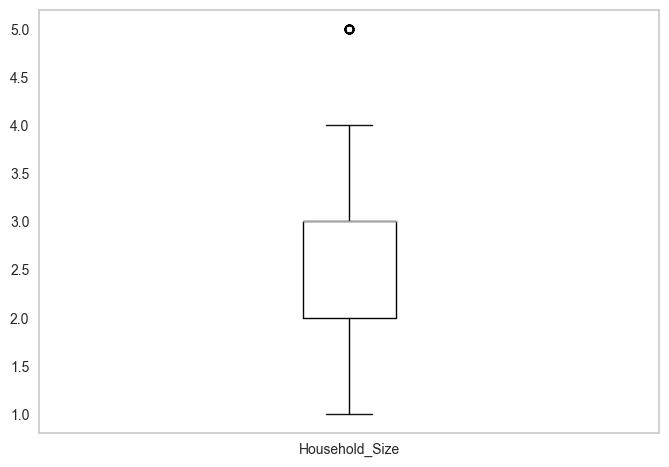

In [16]:
for feature in datanum:
    plot_boxplot(datanum, feature)

In [17]:
def outliers(df, ft):
    Q1 = df[ft].quantile(0.25)
    Q3 = df[ft].quantile(0.75)
    IQR = Q3 - Q1
    upper = Q3 + 1.5 * IQR
    lower = Q1 - 1.5 * IQR
    ls = df.index[ (df[ft] < lower) | (df[ft] > upper)]
    return ls

In [18]:
index_list = []
for feature in ['Income', 'Age']:
    index_list.extend(outliers(data, feature))

In [19]:
def remove(df, ls):
    ls = sorted(set(ls))
    df = df.drop(ls)
    return df

In [20]:
df_cleaned = remove(data, index_list)
df_cleaned

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Adults,Children,Household_Size
0,0,58138.0,0,0,58,635,88,546,172,88,...,0,0,0,1,971.0,58,1617,1,0,1
1,0,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,0,125.0,61,27,1,2,3
2,0,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,0,472.0,50,776,2,0,2
3,0,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,0,65.0,31,53,2,1,3
4,1,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,0,321.0,34,422,2,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,61223.0,0,1,46,709,43,182,42,118,...,0,0,0,0,541.0,48,1341,2,1,3
2236,1,64014.0,2,1,56,406,0,30,0,0,...,1,0,0,0,61.0,69,444,2,3,5
2237,0,56981.0,0,0,91,908,48,217,32,12,...,0,0,0,0,315.0,34,1241,1,0,1
2238,1,69245.0,0,1,8,428,30,214,80,30,...,0,0,0,0,316.0,59,843,2,1,3


In [21]:
max(df_cleaned['Income'])

113734.0

## Correlation

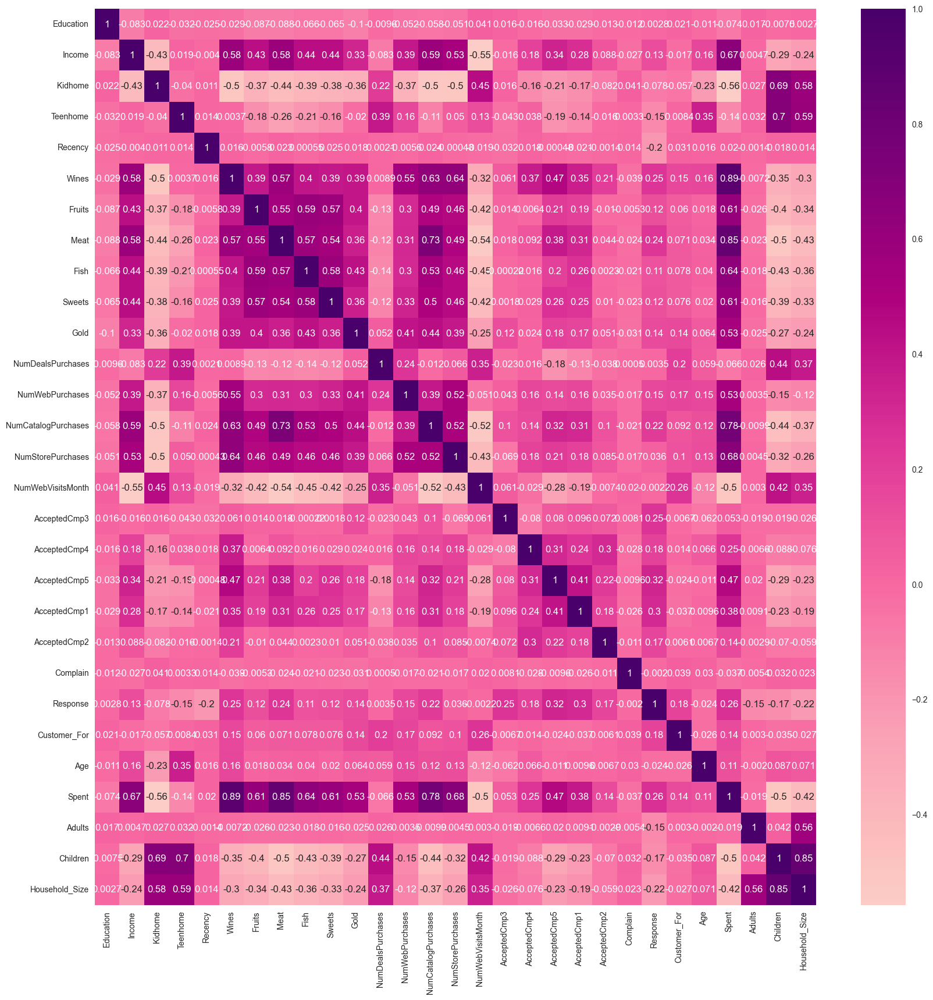

In [22]:
corrmat= data.corr()
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat,annot=True,cmap = 'RdPu', center=0)
plt.show()

## Scaling

In [23]:
df = df_cleaned
df = df.drop(['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response'], axis=1)
scaler = StandardScaler()
scaler.fit(df)
scaled_df = pd.DataFrame(scaler.transform(df),columns= df.columns )

In [24]:
scaled_df.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Adults,Children,Household_Size
0,-0.892338,0.314651,-0.823405,-0.930767,0.310830,0.974566,1.548614,1.748400,2.449154,1.480301,...,1.424772,2.628526,-0.562650,0.689203,1.974128,1.017189,1.679323,-1.347625,-1.266589,-1.759012
1,-0.892338,-0.254877,1.038757,0.906602,-0.380600,-0.874776,-0.638664,-0.731678,-0.652345,-0.635399,...,-1.132957,-0.588043,-1.179732,-0.139645,-1.664957,1.273530,-0.963897,-1.347625,1.403420,0.448513
2,-0.892338,0.965354,-0.823405,-0.930767,-0.795458,0.355155,0.568110,-0.175957,1.336263,-0.149031,...,1.424772,-0.230646,1.288596,-0.554069,-0.172330,0.333612,0.281242,0.742046,-1.266589,-0.655250
3,-0.892338,-1.206087,1.038757,-0.930767,-0.795458,-0.874776,-0.563241,-0.667380,-0.506392,-0.586763,...,-0.767567,-0.945440,-0.562650,0.274779,-1.923048,-1.289883,-0.920675,0.742046,0.068415,0.448513
4,0.571654,0.322136,1.038757,-0.930767,1.555404,-0.394659,0.417263,-0.217292,0.150396,-0.003121,...,0.328602,0.126750,0.054432,-0.139645,-0.821859,-1.033542,-0.307248,0.742046,0.068415,0.448513


In [25]:
scaled_df.shape

(2205, 22)

In [192]:
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
pca.fit(scaled_df)
PCA_df = pd.DataFrame(pca.transform(scaled_df), columns=(["PCA1","PCA2", "PCA3"]))
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
PCA1,2205.0,-2.191243e-16,2.825011,-5.975307,-2.523157,-0.766444,2.450672,7.353225
PCA2,2205.0,1.288966e-17,1.638207,-3.887869,-1.313645,-0.164438,1.162547,6.349450
PCA3,2205.0,4.108580e-17,1.221539,-3.552563,-0.834463,-0.030406,0.805034,6.751675


# ---------------------------EDA--------------------------

# Metadata
    * Income - Amount of income a customet has
    * Kidhome - number of kids home
    * Teenhome - number of teens home
    * Regency - Days since customers last visit
    * Wine - Amount of wine bought in dollars
    * Fruit - Amount of fruit bought in dollars
    * Meat - Amount of Meat bought in dollars
    * Fish - Amount of fish bought in dollars
    * Sweets - Amount of sweete bought in dollars
    * Gold - Amount of Gold bought in dollars
    * NumDealsPurchases - Amount of promotions purhased 
    * NumWebPurchases - Amount of web purchases
    * NumCatalogPurchases - Amount of catalog purchases
    * NumStorePurchases - Amount of store purchases 
    * NumWebVisitsMonth - Amount of visits per month
    * Age - age of customer
    * Adults - adults in household
    * Children - kids in household
    * Household_Size - amount of people in household
    * Spent - total spent monthly
    * Basic - has basic education
    * Gradutation - has bachelors degrees
    * Master - has masters degrees
    * PhD - has PhD degrees
    

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2205 entries, 0 to 2239
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2205 non-null   int64  
 1   Income               2205 non-null   float64
 2   Kidhome              2205 non-null   int64  
 3   Teenhome             2205 non-null   int64  
 4   Recency              2205 non-null   int64  
 5   Wines                2205 non-null   int64  
 6   Fruits               2205 non-null   int64  
 7   Meat                 2205 non-null   int64  
 8   Fish                 2205 non-null   int64  
 9   Sweets               2205 non-null   int64  
 10  Gold                 2205 non-null   int64  
 11  NumDealsPurchases    2205 non-null   int64  
 12  NumWebPurchases      2205 non-null   int64  
 13  NumCatalogPurchases  2205 non-null   int64  
 14  NumStorePurchases    2205 non-null   int64  
 15  NumWebVisitsMonth    2205 non-null   i

In [28]:
df.describe()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Adults,Children,Household_Size
count,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,...,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000
mean,0.609524,51622.094785,0.442177,0.506576,49.009070,306.164626,26.403175,165.312018,37.756463,27.128345,...,4.100680,2.645351,5.823583,5.336961,512.062585,46.095692,606.821769,1.644898,0.948753,2.593651
std,0.683219,20713.063826,0.537132,0.544380,28.932111,337.493839,39.784484,217.784507,54.824635,41.130468,...,2.737424,2.798647,3.241796,2.413535,232.528808,11.705801,601.675284,0.478653,0.749231,0.906197
min,0.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,19.000000,5.000000,1.000000,0.000000,1.000000
25%,0.000000,35196.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,...,2.000000,0.000000,3.000000,3.000000,340.000000,38.000000,69.000000,1.000000,0.000000,2.000000
50%,0.000000,51287.000000,0.000000,0.000000,49.000000,178.000000,8.000000,68.000000,12.000000,8.000000,...,4.000000,2.000000,5.000000,6.000000,513.000000,45.000000,397.000000,2.000000,1.000000,3.000000
75%,1.000000,68281.000000,1.000000,1.000000,74.000000,507.000000,33.000000,232.000000,50.000000,34.000000,...,6.000000,4.000000,8.000000,7.000000,686.000000,56.000000,1047.000000,2.000000,1.000000,3.000000
max,2.000000,113734.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,...,27.000000,28.000000,13.000000,20.000000,1063.000000,75.000000,2525.000000,2.000000,3.000000,5.000000


In [29]:
def densityplt(df, ft):
    sns.distplot(a=df[ft], kde=False)
    plt.show()

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/100704928.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(a=df[ft], kde=False)


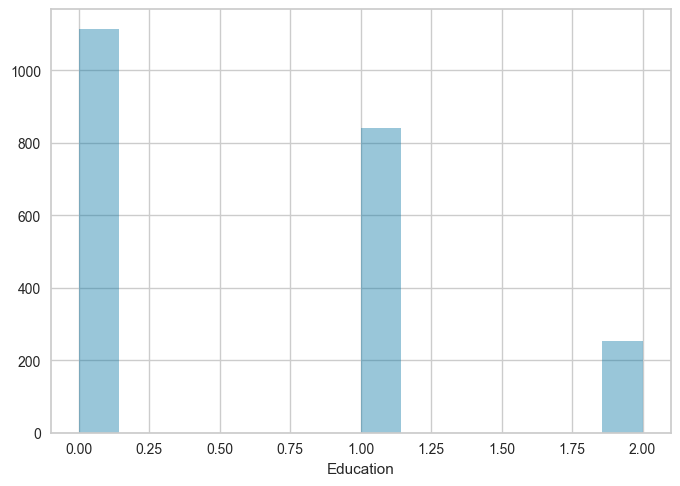

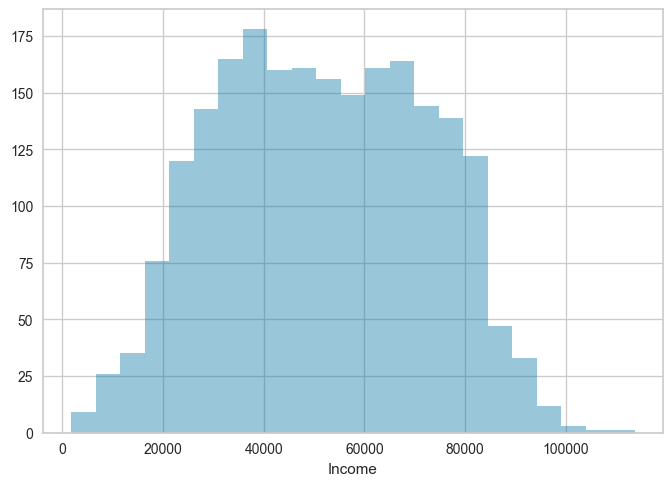

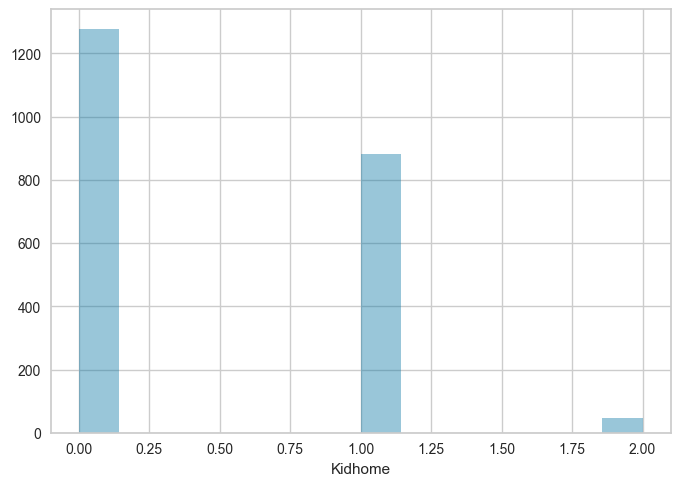

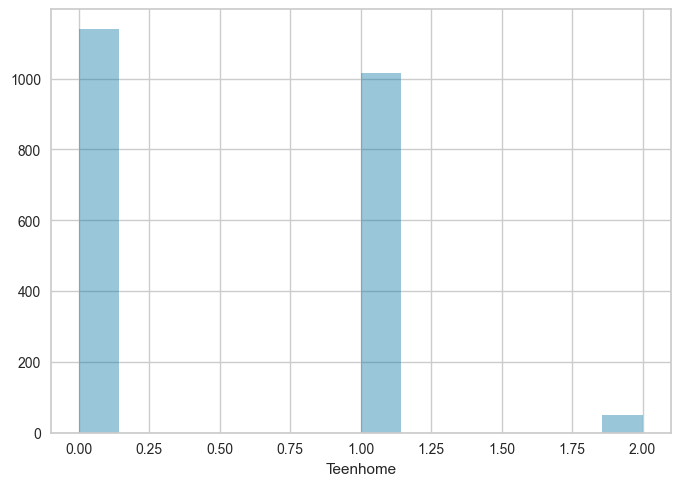

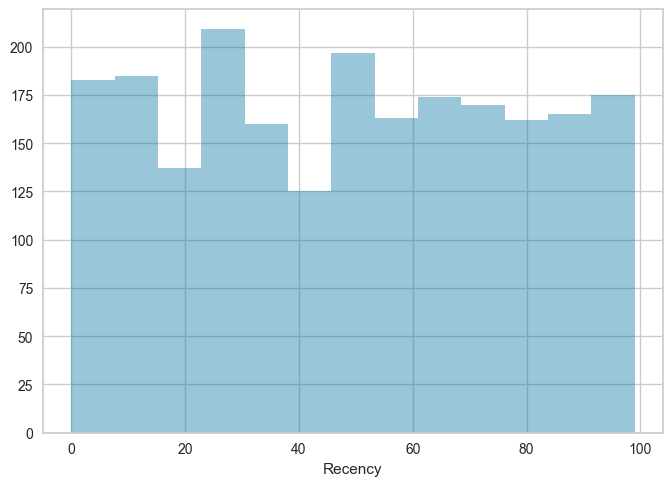

...

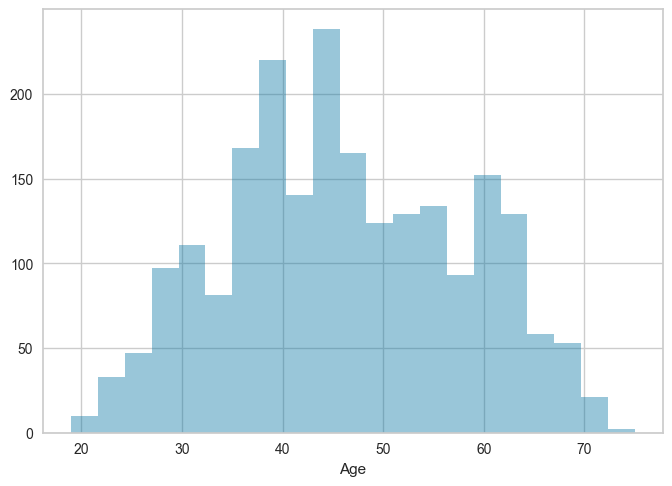

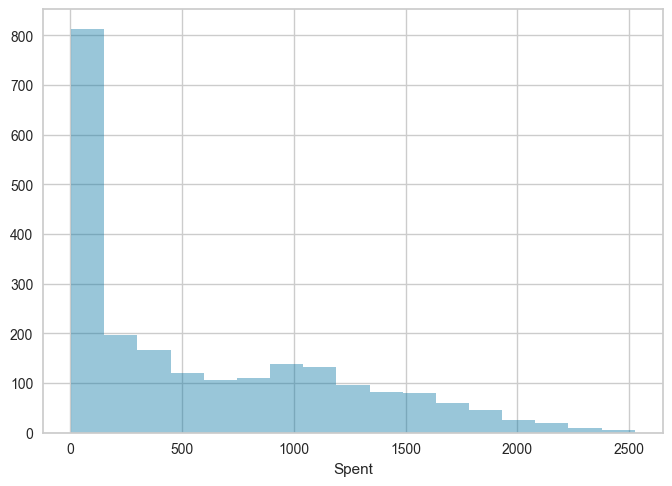

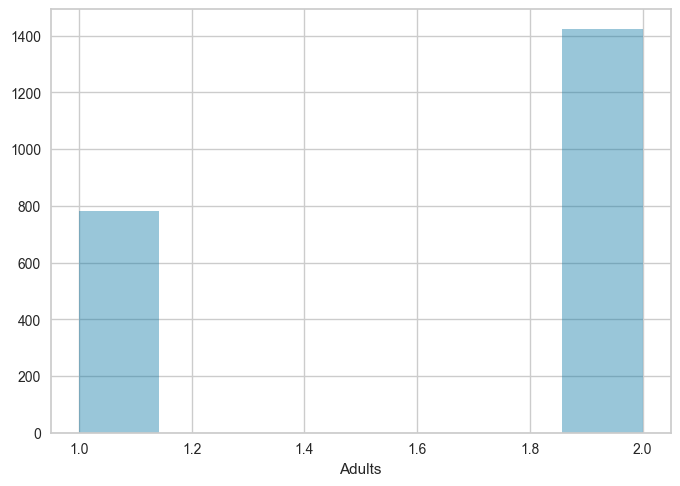

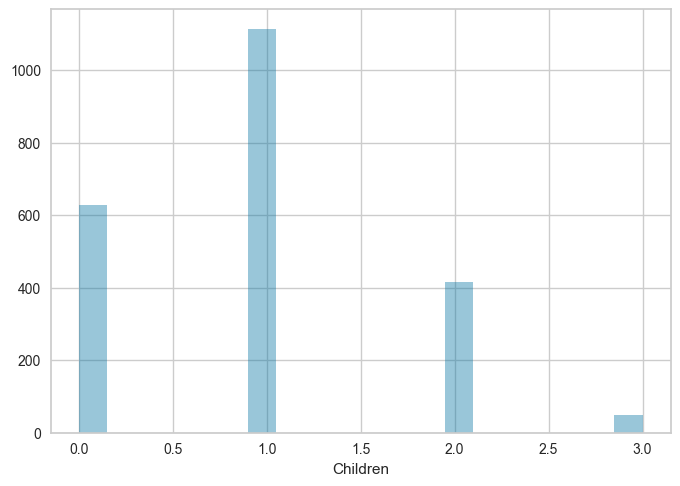

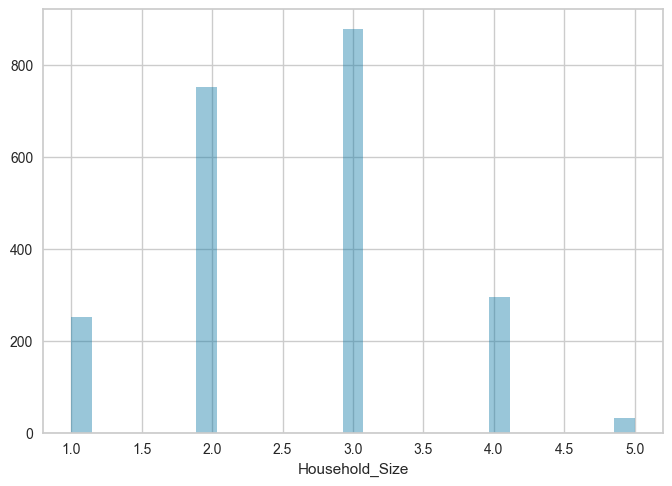

In [30]:
for feature in df:
    densityplt(df, feature)

# -----------------------MODELS-----------------------

# ------------K-Means

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

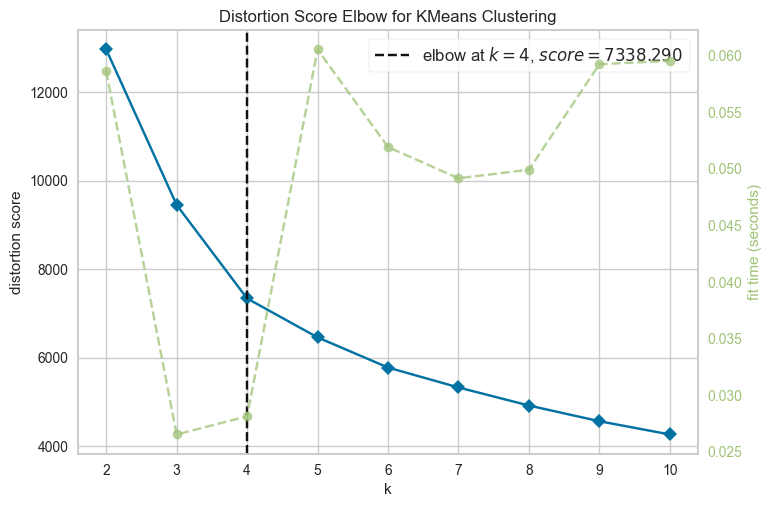

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [31]:
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_df)
Elbow_M.show()

In [32]:
kmeans = KMeans(n_clusters=4)
y_kmeans = kmeans.fit_predict(PCA_df)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [33]:
PCA_df["Clusters"] = y_kmeans
df["Clusters"]= y_kmeans

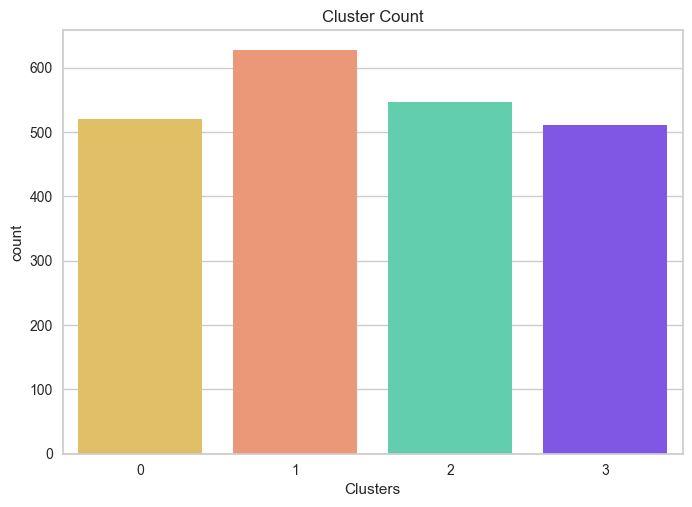

In [34]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"], palette= pal)
pl.set_title("Cluster Count")
plt.show()

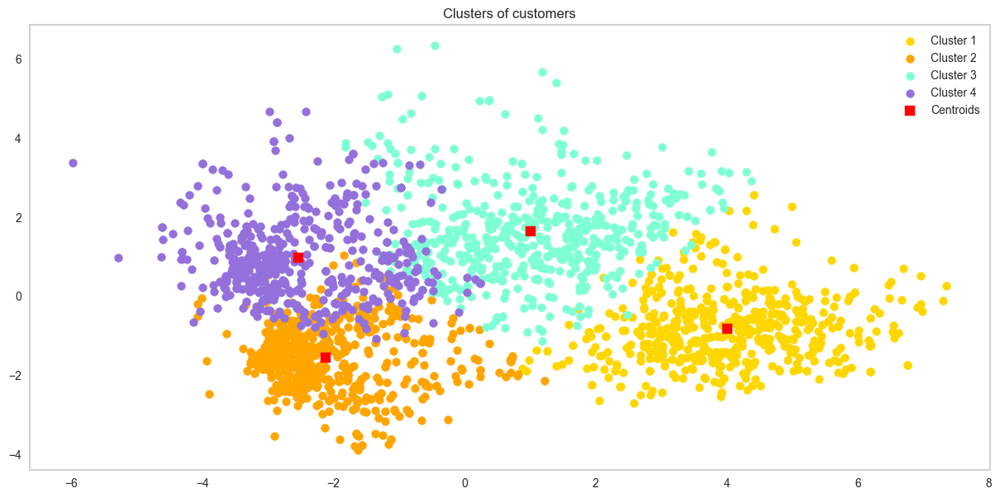

In [35]:
X = np.array(PCA_df)

# Visualising the clusters
plt.figure(figsize=(15,7))
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], color = 'gold', label = 'Cluster 1',s=50)
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], color = 'orange', label = 'Cluster 2',s=50)
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], color = 'aquamarine', label = 'Cluster 3',s=50)
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], color = 'mediumpurple', label = 'Cluster 4',s=50)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color = 'red',  label = 'Centroids',s=75,marker=',')
plt.grid(False)
plt.title('Clusters of customers')
plt.legend()
plt.show()

In [52]:
def plot(df, ft):
    pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)
    pl.set_title("Cluster's Profile Based On Income And Spending")
    plt.legend()
    plt.show()

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


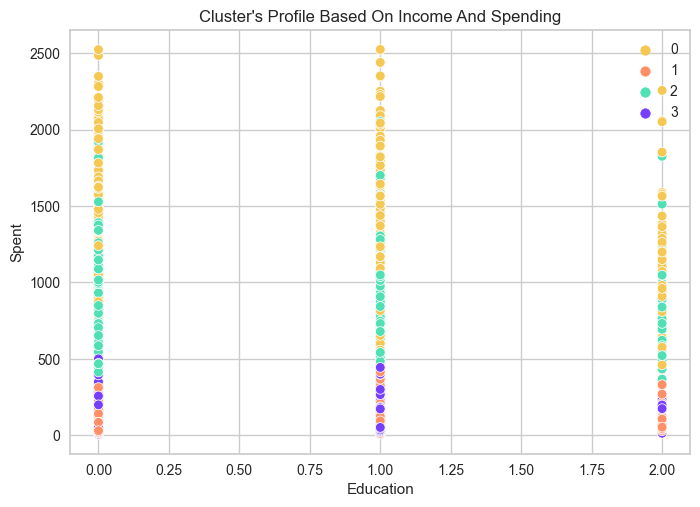

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


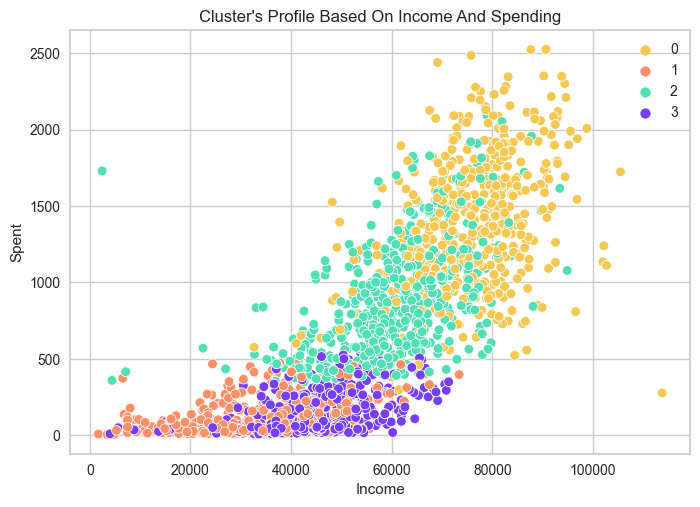

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


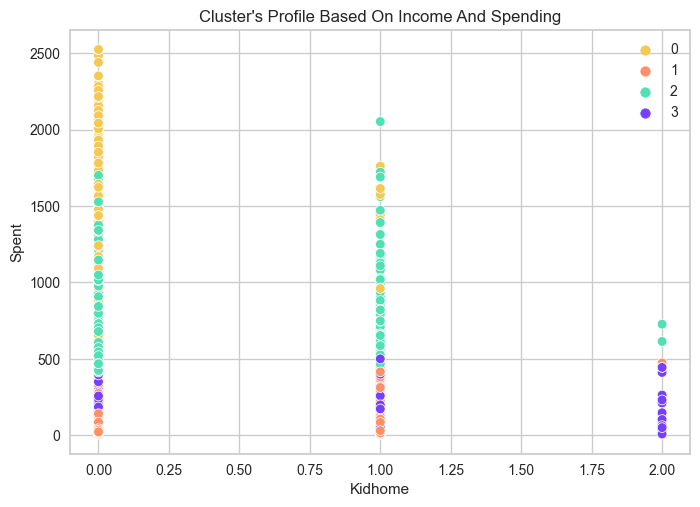

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


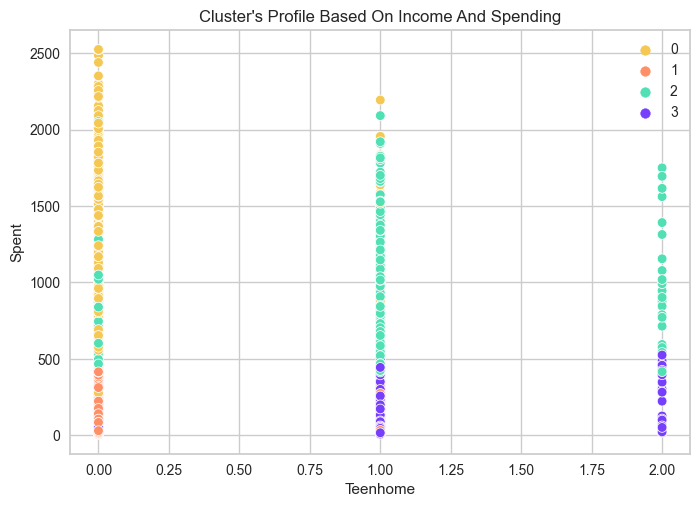

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


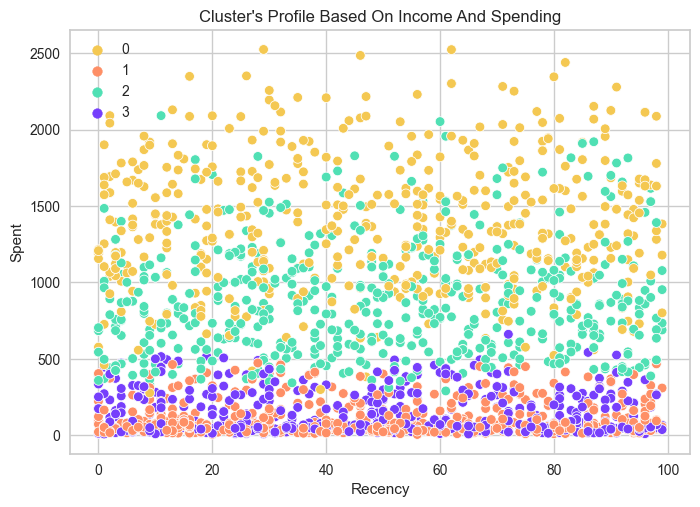

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


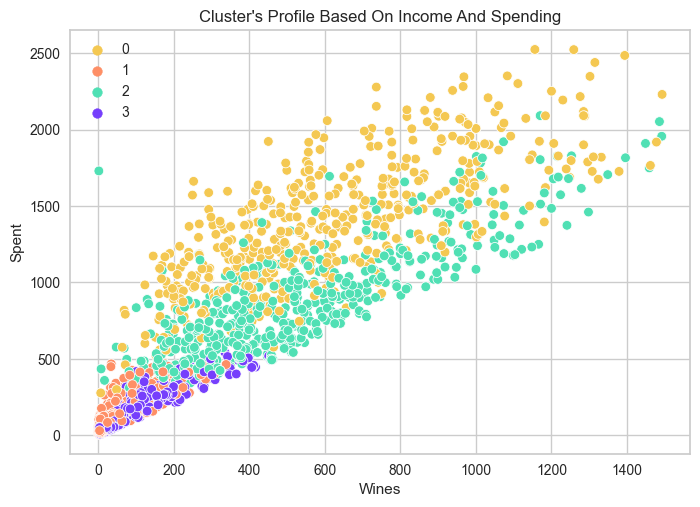

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


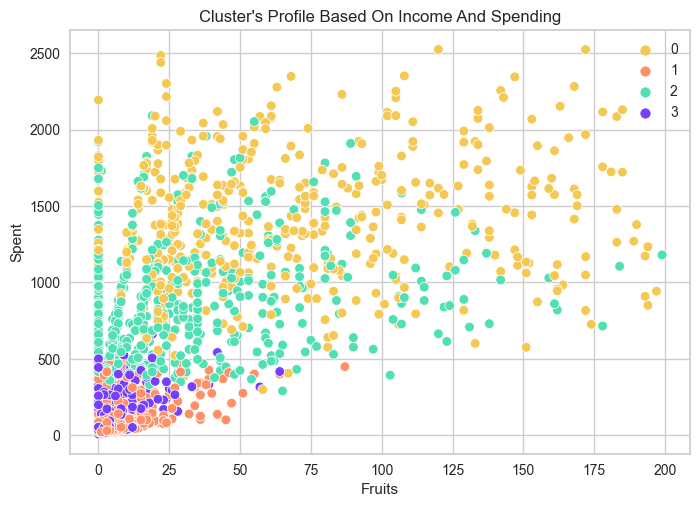

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


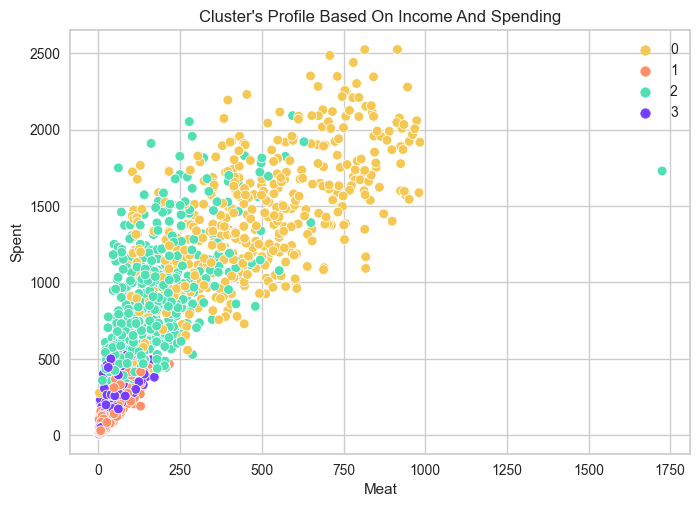

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


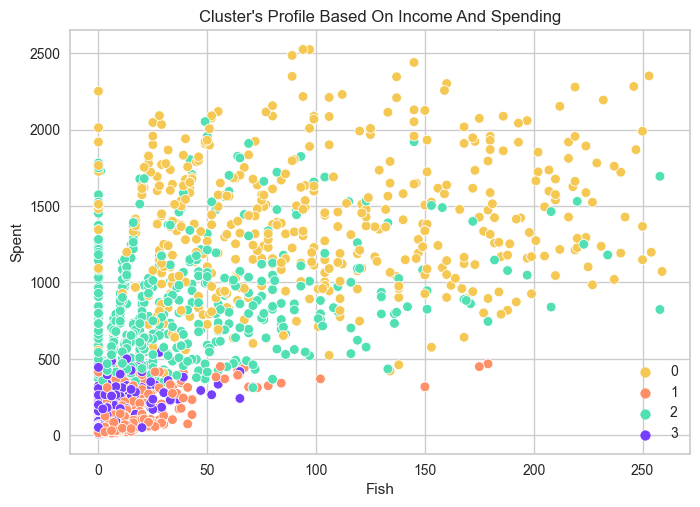

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


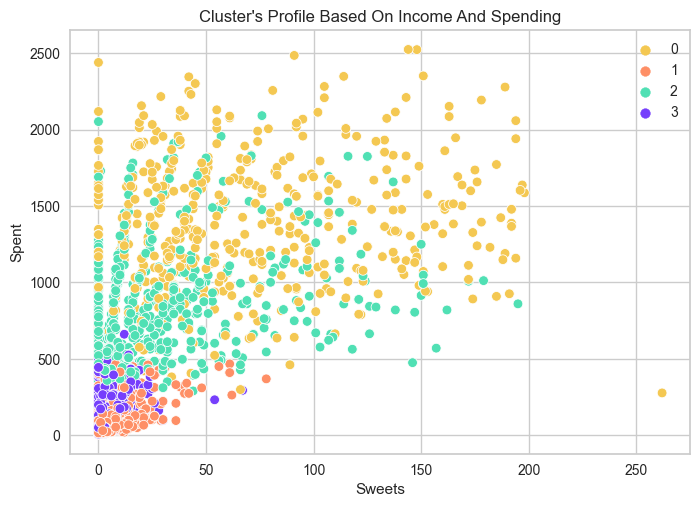

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


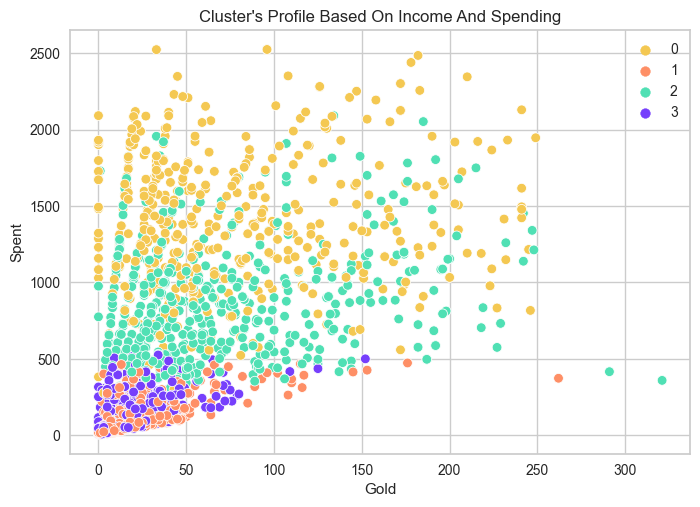

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


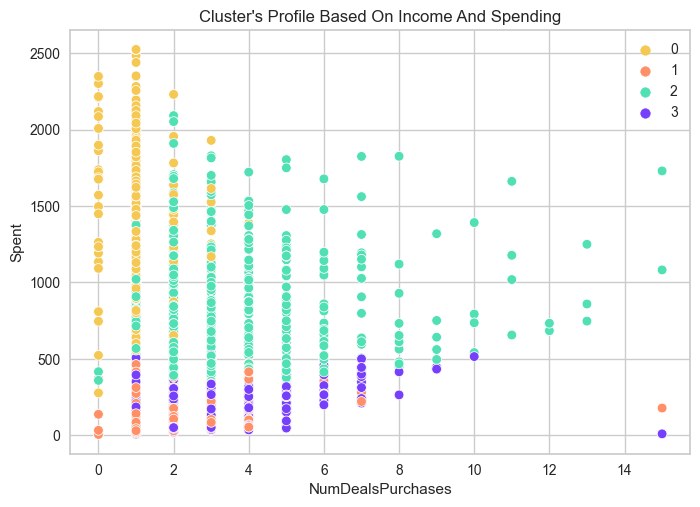

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


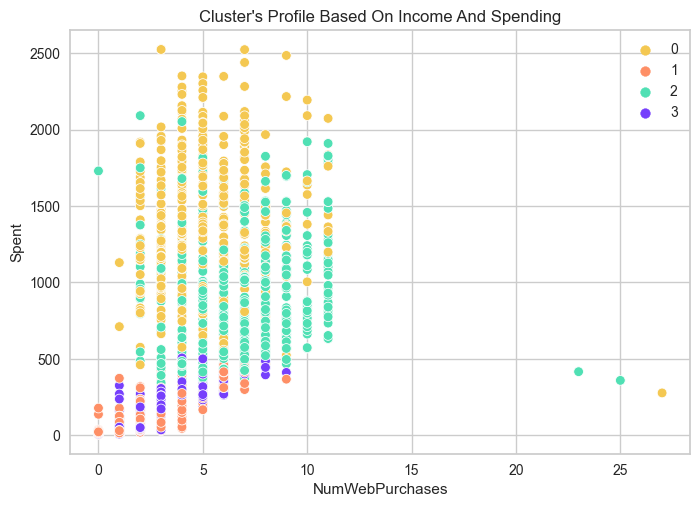

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


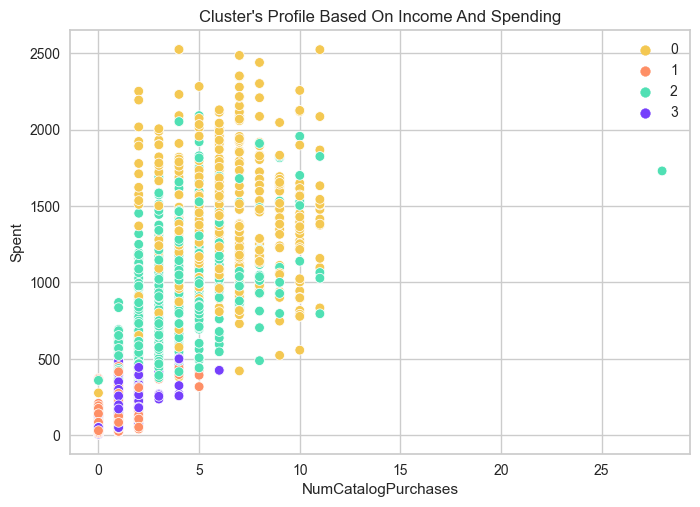

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


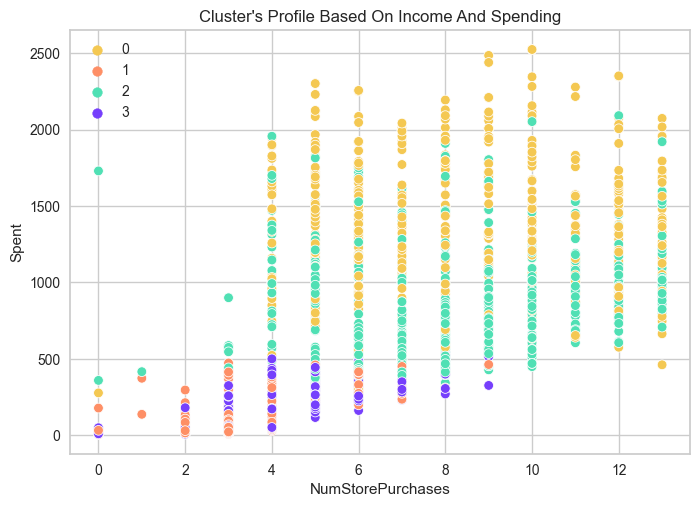

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


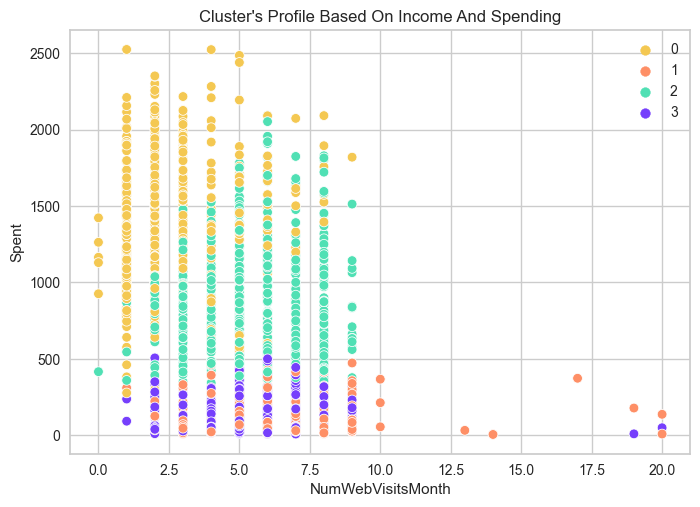

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


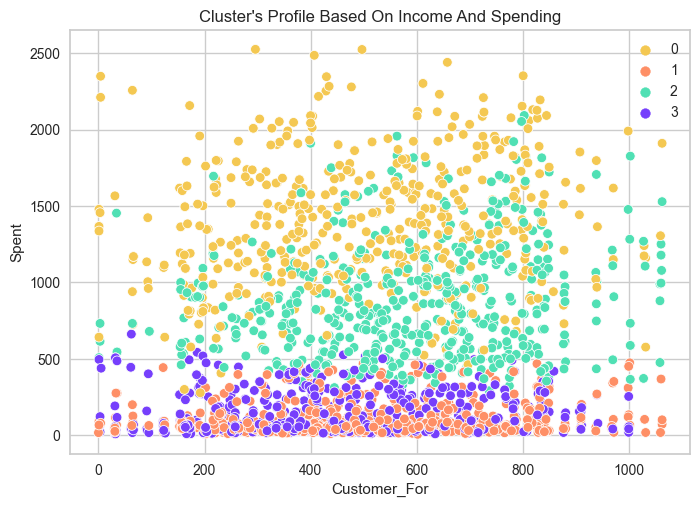

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


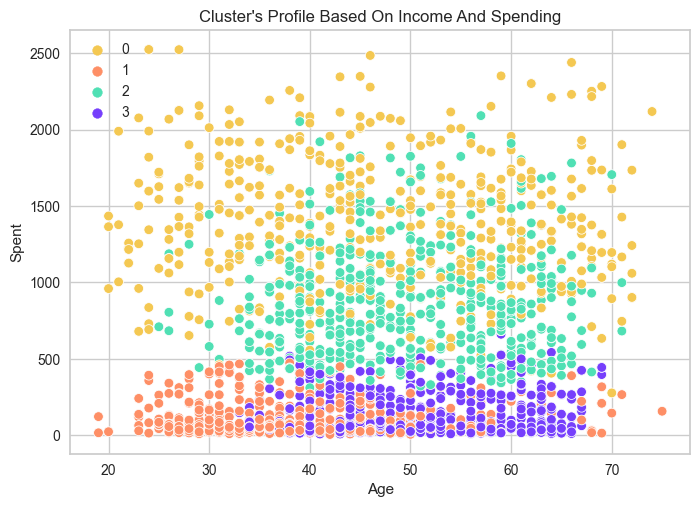

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


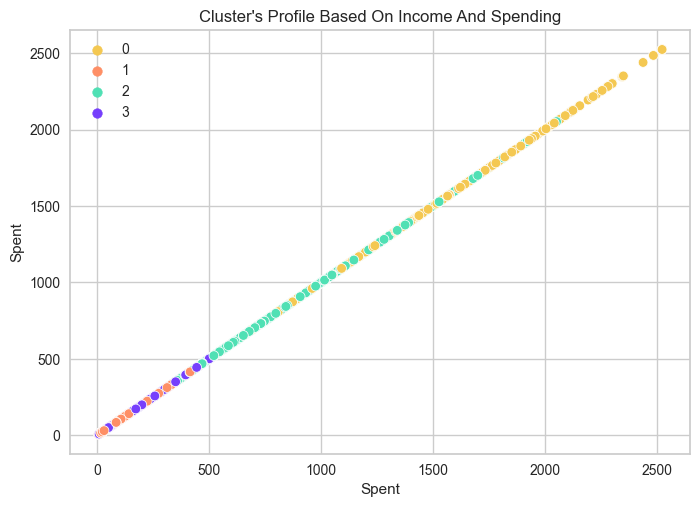

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


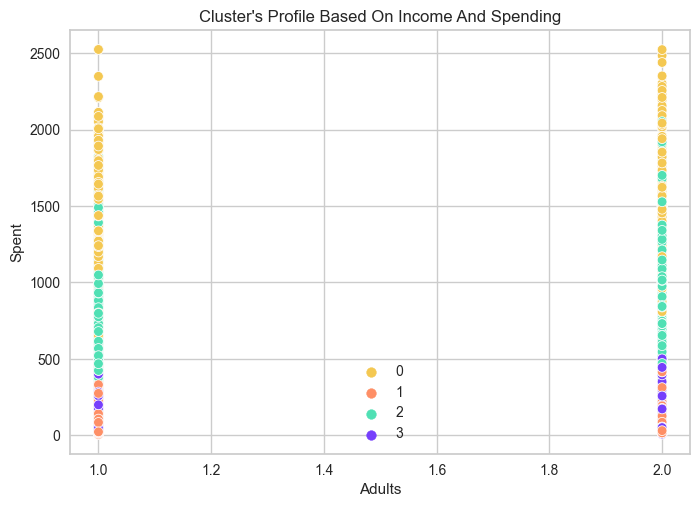

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


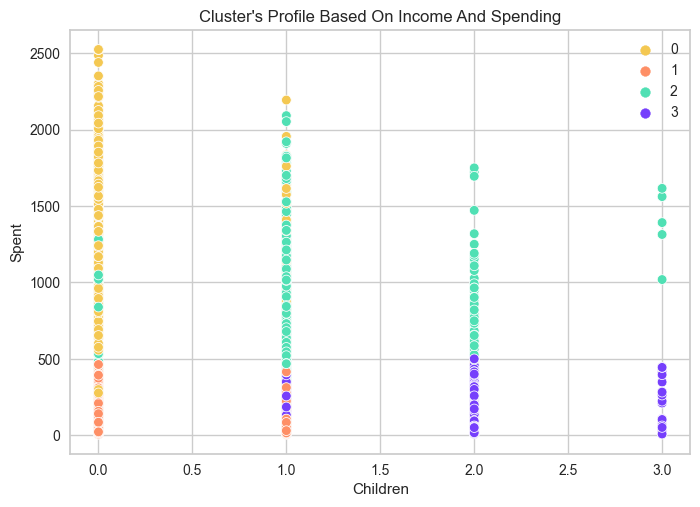

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


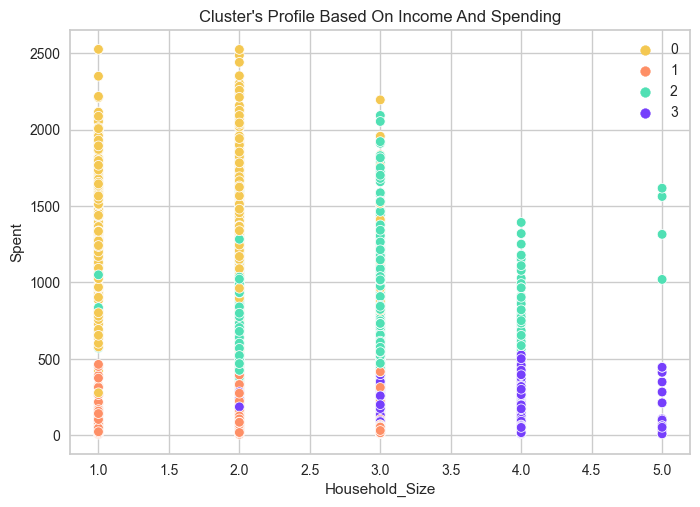

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/3050270066.py:2: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  pl = sns.scatterplot(data = data,x=df[ft], y=df["Spent"],hue=df["Clusters"], palette= pal)


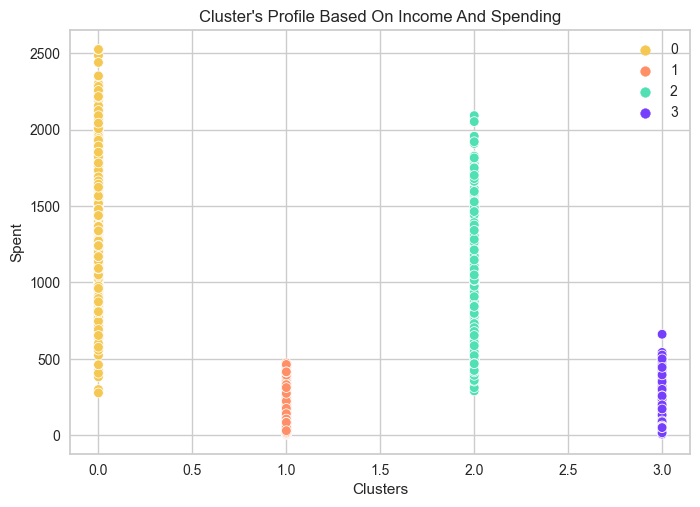

In [53]:
for feature in df:
    plot(df, feature)

In [163]:
g = df.groupby(['Clusters'])
c1 = g.get_group(0)
c2 = g.get_group(1)
c3= g.get_group(2)
c4= g.get_group(3)

In [164]:
print('group 1')
print('average wine purchase:', c1['Wines'].mean())
print('average fruit purchase:', c1['Fruits'].mean())
print('average meat purchase:', c1['Meat'].mean())
print('average fish purchase:', c1['Fish'].mean())
print('average sweets purchase:', c1['Sweets'].mean())
print('average gold purchase:', c1['Gold'].mean())

group 1
average wine purchase: 612.1192307692307
average fruit purchase: 66.9326923076923
average meat purchase: 460.275
average fish purchase: 98.87307692307692
average sweets purchase: 70.08076923076923
average gold purchase: 76.1576923076923


In [165]:
print('group 2')
print('average wine purchase:', c2['Wines'].mean())
print('average fruit purchase:', c2['Fruits'].mean())
print('average meat purchase:', c2['Meat'].mean())
print('average fish purchase:', c2['Fish'].mean())
print('average sweets purchase:', c2['Sweets'].mean())
print('average gold purchase:', c2['Gold'].mean())

group 2
average wine purchase: 36.98086124401914
average fruit purchase: 6.644338118022328
average meat purchase: 26.00159489633174
average fish purchase: 10.25518341307815
average sweets purchase: 6.776714513556619
average gold purchase: 18.025518341307816


In [166]:
print('group 3')
print('average wine purchase:', c3['Wines'].mean())
print('average fruit purchase:', c3['Fruits'].mean())
print('average meat purchase:', c3['Meat'].mean())
print('average fish purchase:', c3['Fish'].mean())
print('average sweets purchase:', c3['Sweets'].mean())
print('average gold purchase:', c3['Gold'].mean())

group 3
average wine purchase: 524.9049360146253
average fruit purchase: 31.318098720292504
average meat purchase: 170.78793418647166
average fish purchase: 41.0109689213894
average sweets purchase: 31.276051188299817
average gold purchase: 70.03290676416819


In [167]:
print('group 4')
print('average wine purchase:', c4['Wines'].mean())
print('average fruit purchase:', c4['Fruits'].mean())
print('average meat purchase:', c4['Meat'].mean())
print('average fish purchase:', c4['Fish'].mean())
print('average sweets purchase:', c4['Sweets'].mean())
print('average gold purchase:', c4['Gold'].mean())

group 4
average wine purchase: 90.96086105675147
average fruit purchase: 4.142857142857143
average meat purchase: 30.227005870841488
average fish purchase: 5.823874755381604
average sweets purchase: 3.9510763209393347
average gold purchase: 15.526418786692759


In [103]:
def compare(df, ft):
    sns.distplot(c1[ft], color = "#F4C852", hist=False)
    sns.distplot(c2[ft], color = "#FE8F66", hist=False)
    sns.distplot(c3[ft], color = "#50E0B4", hist=False)
    sns.distplot(c4[ft], color = "#763FFC", hist=False)
    sns.distplot(c4[ft], color = "#5479FF", hist=False)
    plt.show()

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

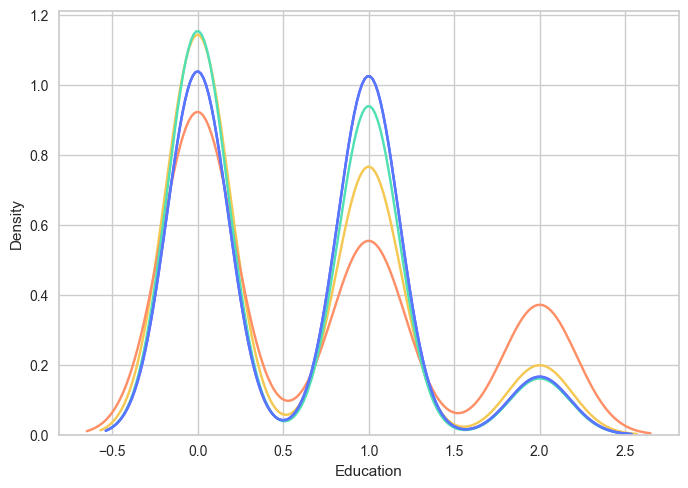

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

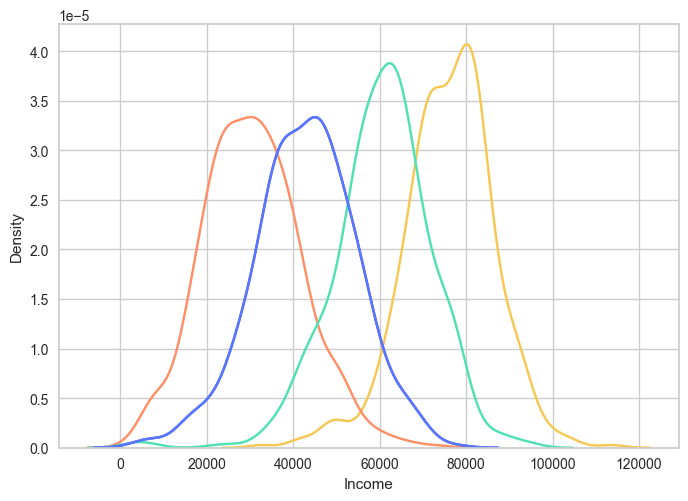

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

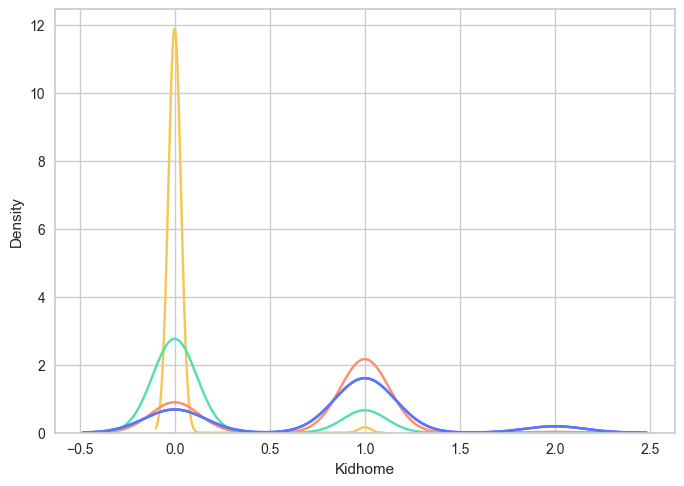

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

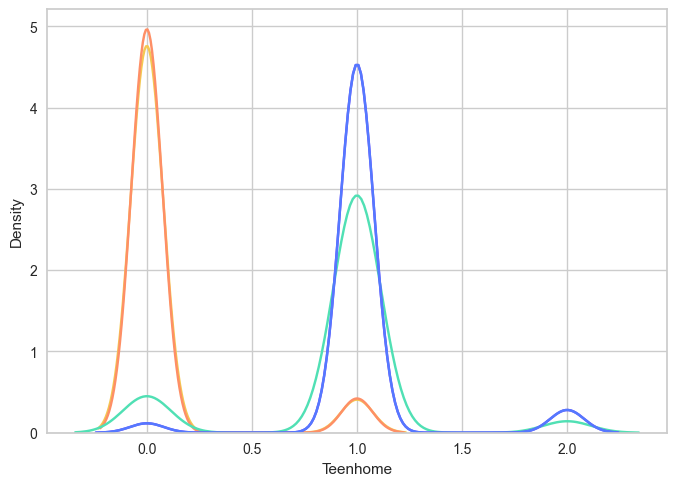

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

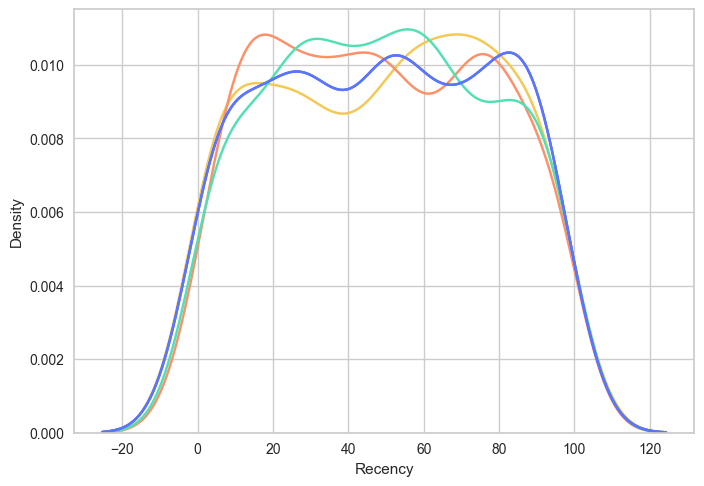

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

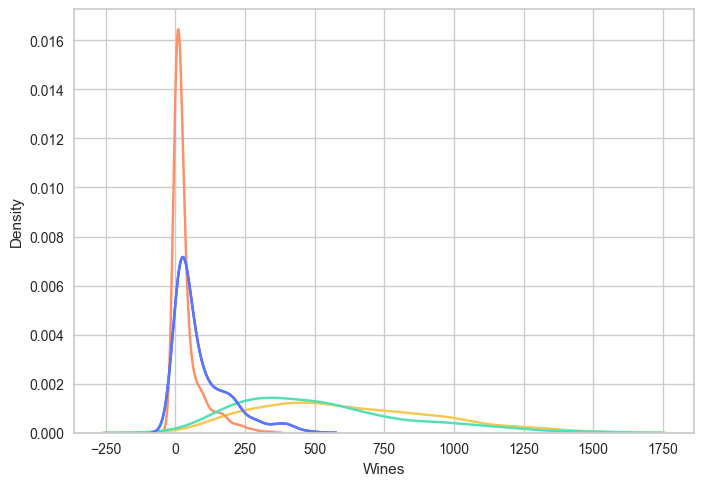

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

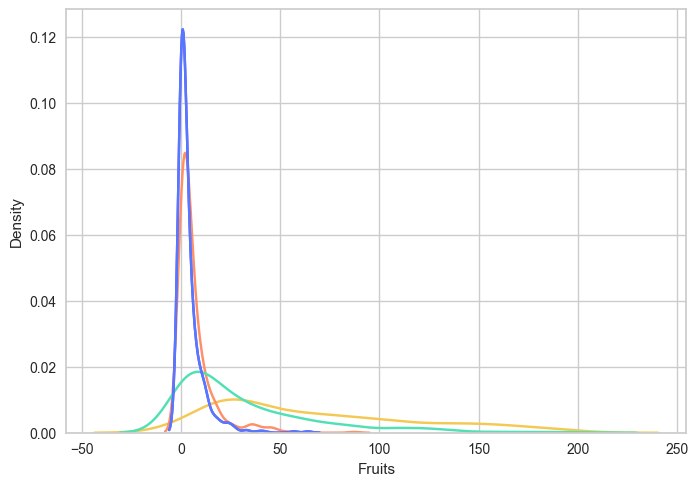

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

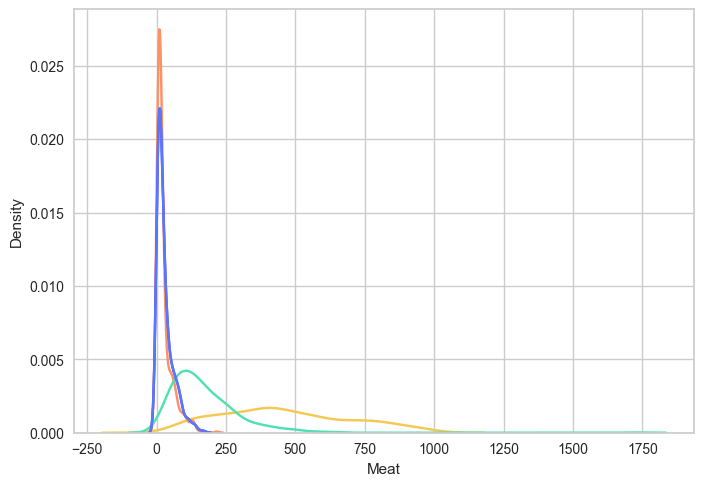

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

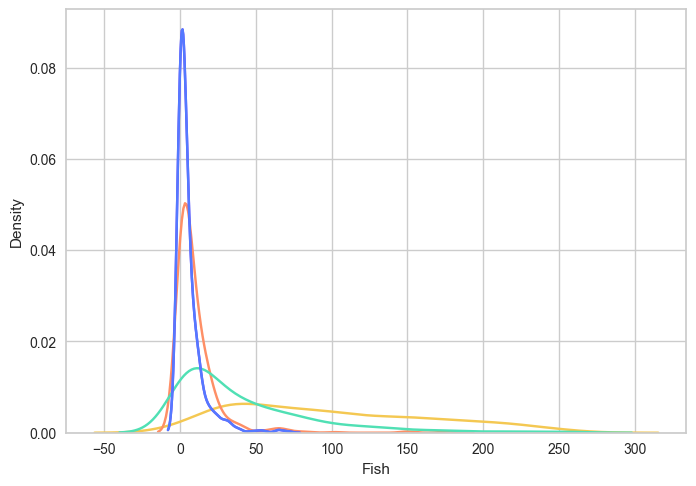

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

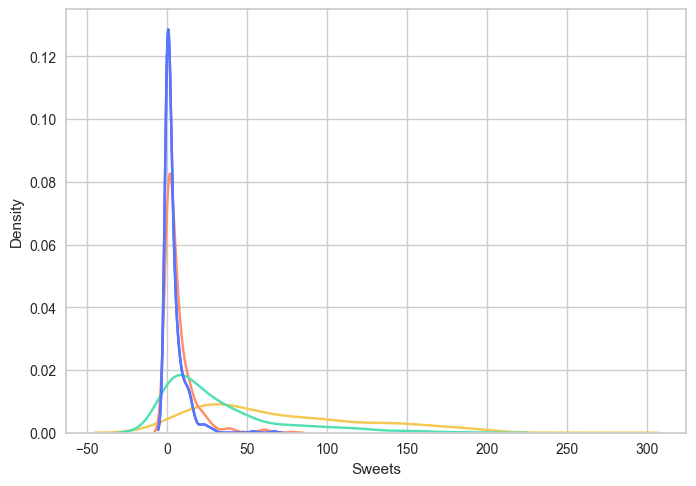

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

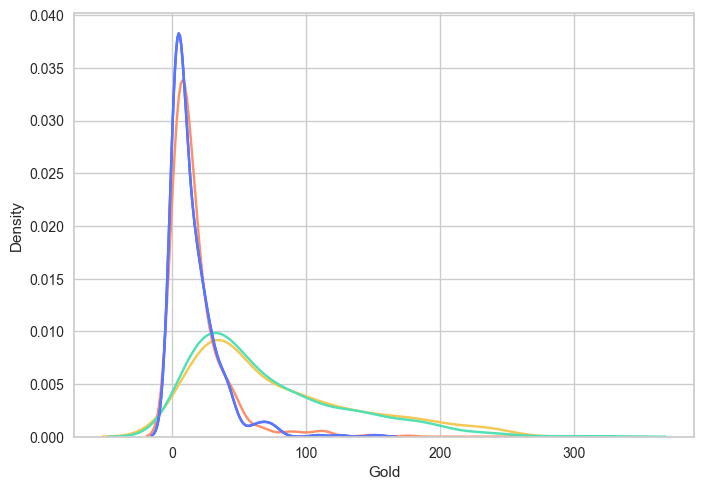

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

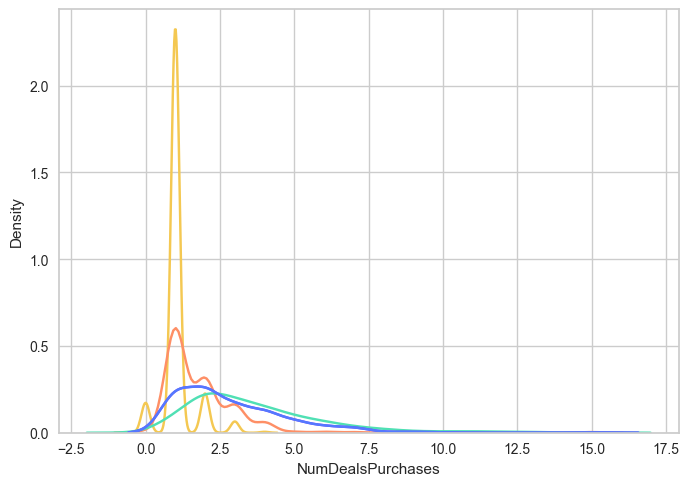

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

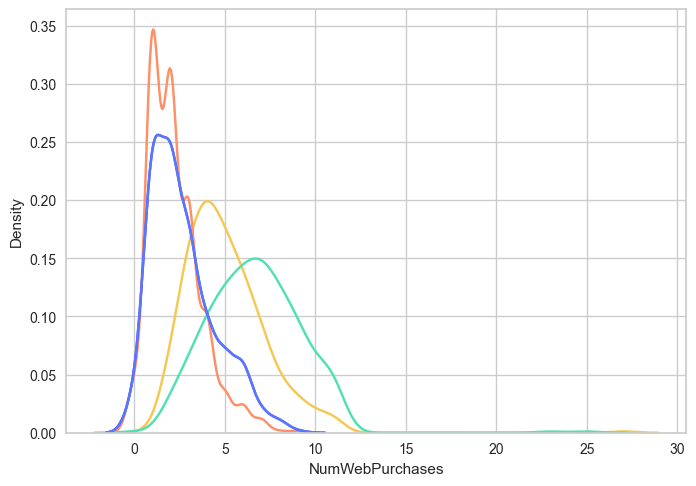

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

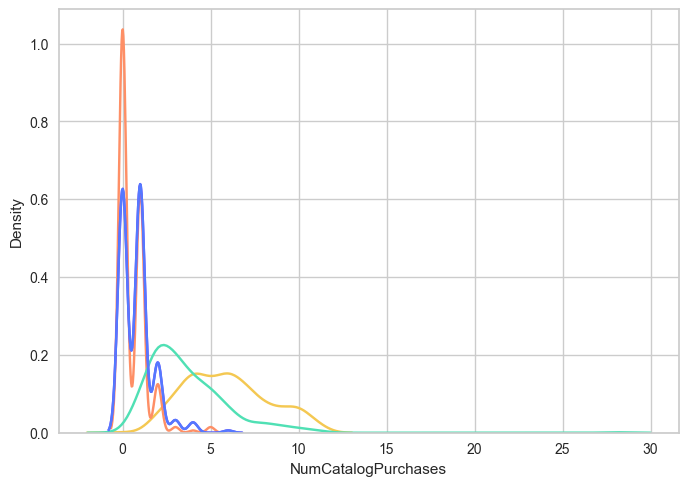

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

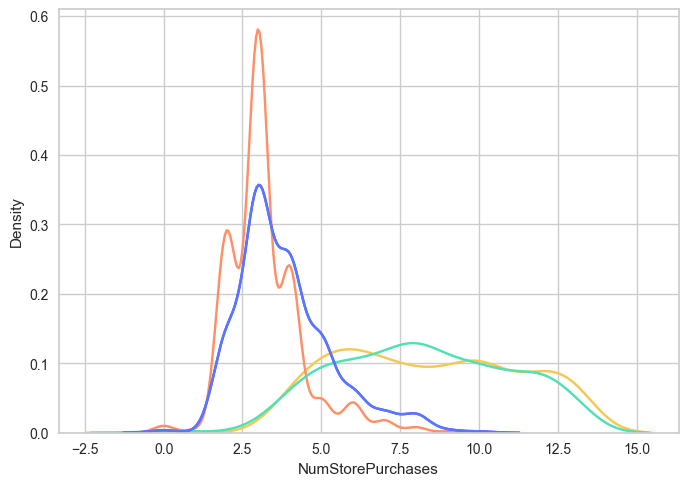

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

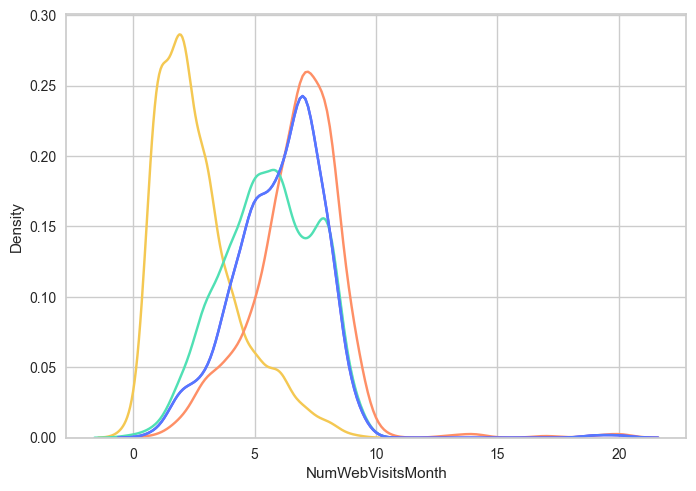

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

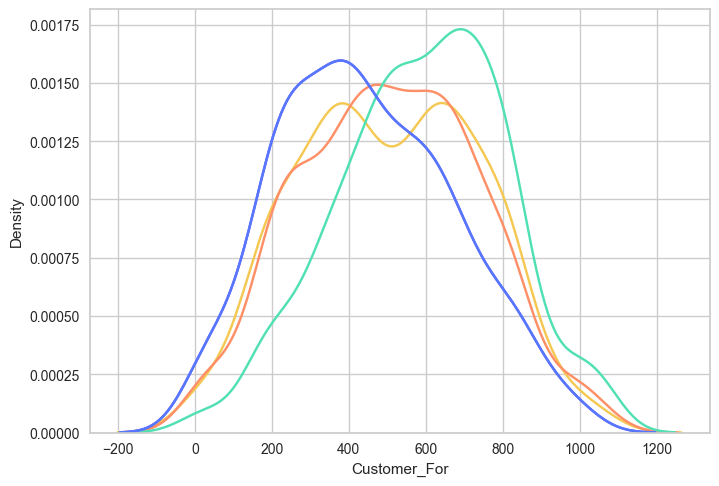

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

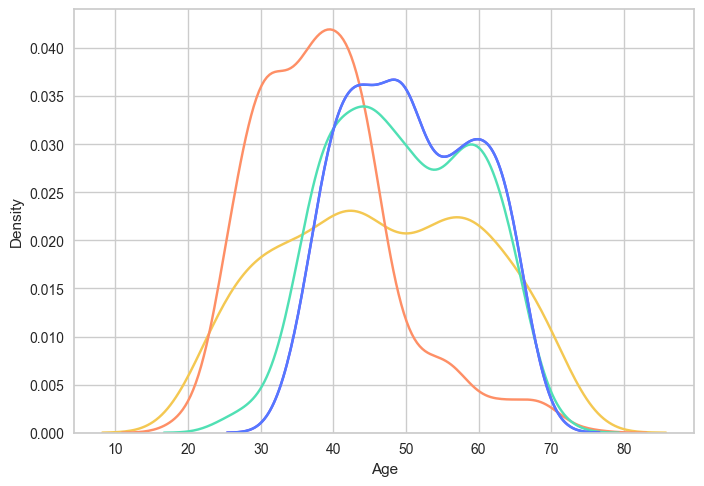

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

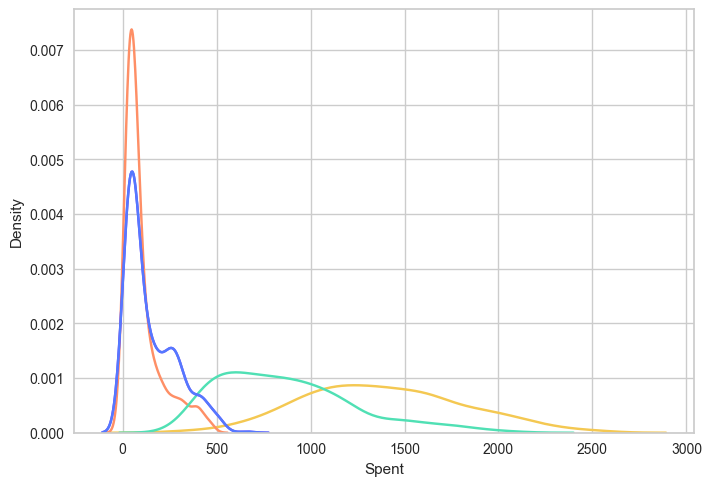

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

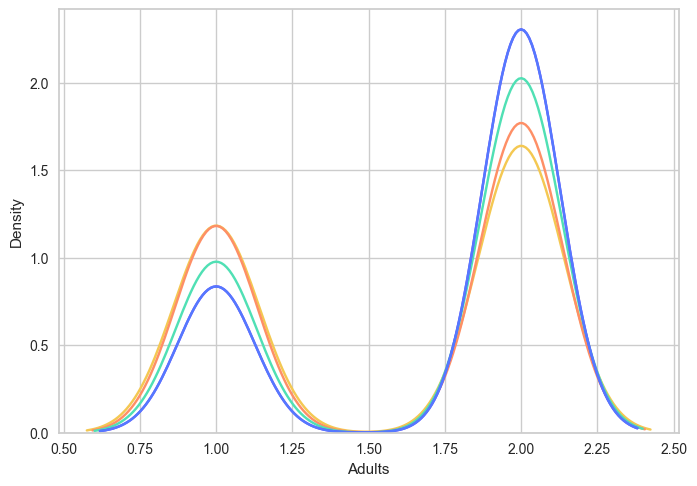

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

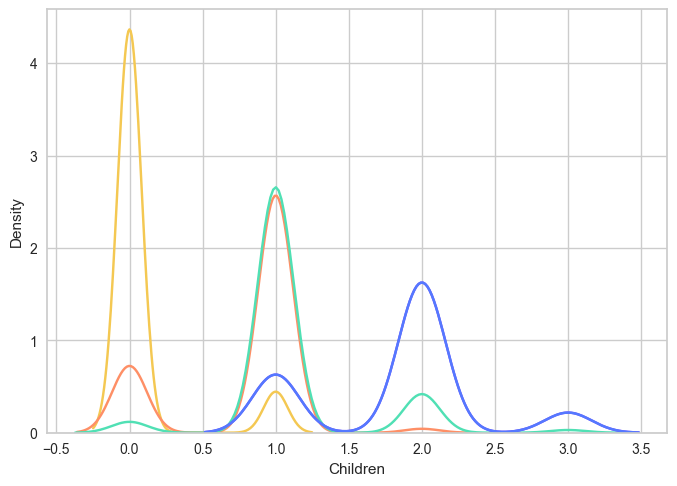

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

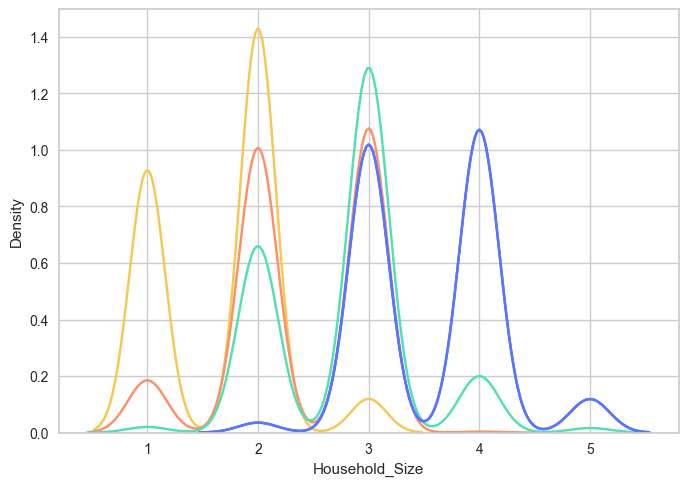

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/1961634025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt 

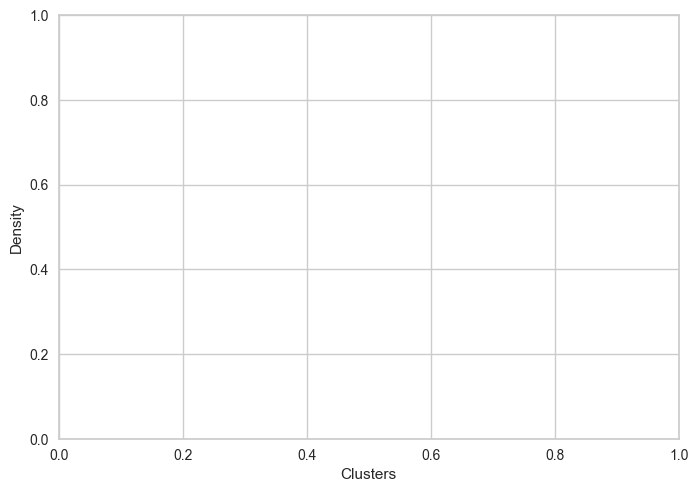

In [104]:
for feature in df:
    compare(df, feature)

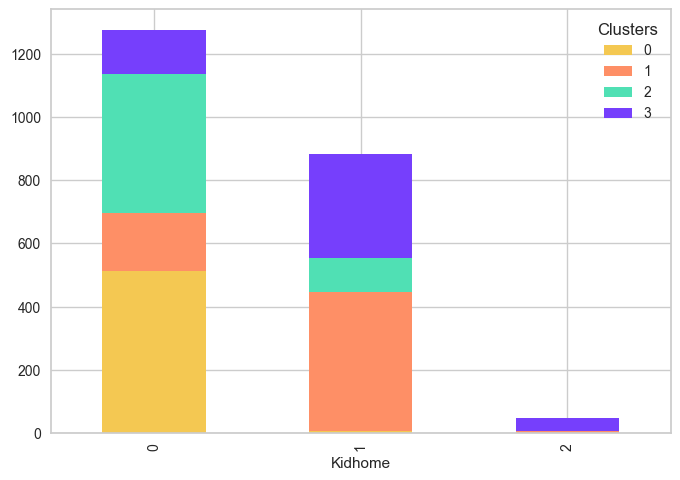

In [191]:
df.groupby(['Kidhome', 'Clusters']).size().unstack().plot(kind='bar',color = pal, stacked=True)
plt.show()

# ------------Agglomerative Clustering

In [125]:
df2 = df_cleaned
PC = PCA_df.drop(['Clusters'], axis = 1)

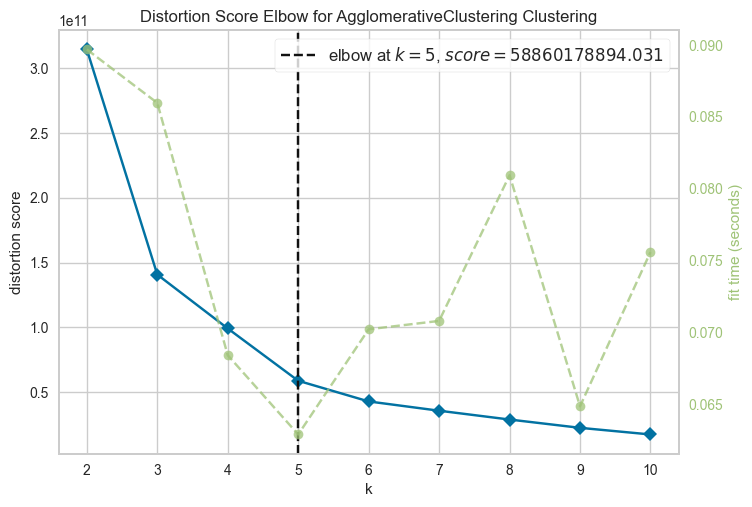

<Axes: title={'center': 'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [63]:
Elbow_M = KElbowVisualizer(AgglomerativeClustering())
Elbow_M.fit(df2)
Elbow_M.show()

In [64]:
AC = AgglomerativeClustering(n_clusters=5)
y_AC = AC.fit_predict(PC)

In [65]:
PC["Clusters"] = y_AC
df2["Clusters"]= y_AC

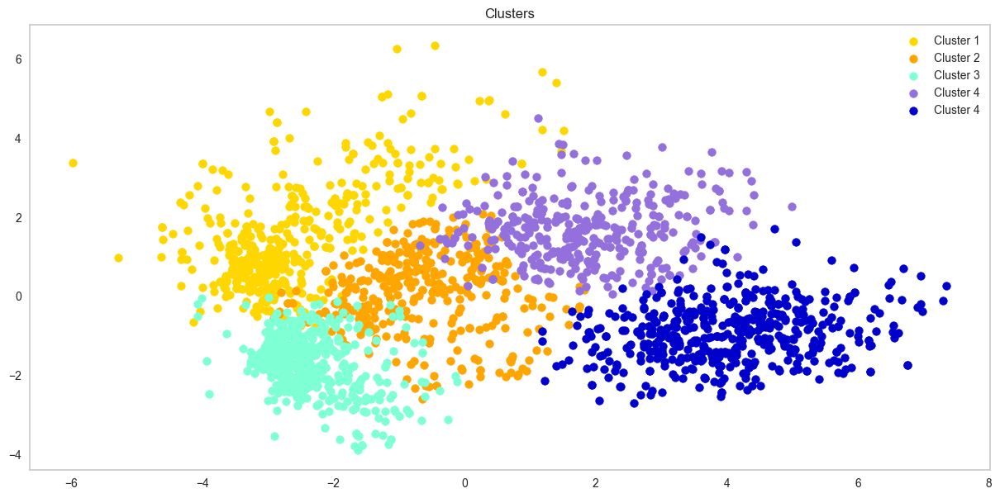

In [66]:
X = np.array(PC)
plt.figure(figsize=(15,7))
plt.scatter(X[y_AC == 0, 0], X[y_AC == 0, 1], color = 'gold', label = 'Cluster 1',s=50)
plt.scatter(X[y_AC == 1, 0], X[y_AC == 1, 1], color = 'orange', label = 'Cluster 2',s=50)
plt.scatter(X[y_AC == 2, 0], X[y_AC == 2, 1], color = 'aquamarine', label = 'Cluster 3',s=50)
plt.scatter(X[y_AC == 3, 0], X[y_AC == 3, 1], color = 'mediumpurple', label = 'Cluster 4',s=50)
plt.scatter(X[y_AC == 4, 0], X[y_AC == 4, 1], color = 'mediumblue', label = 'Cluster 4',s=50)

plt.grid(False)
plt.title('Clusters')
plt.legend()
plt.show()

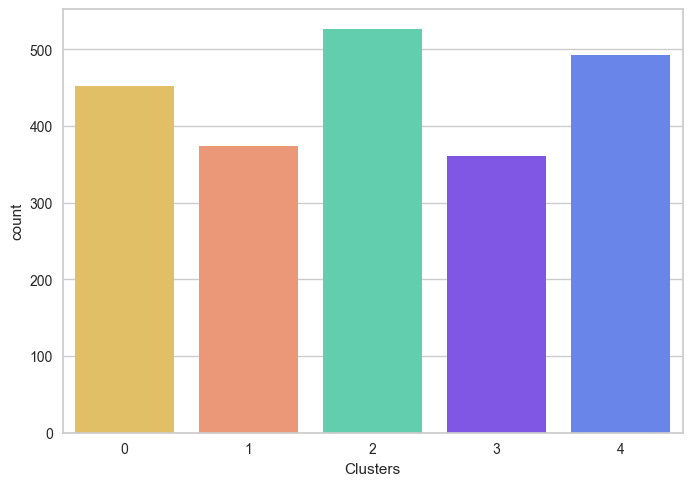

In [67]:
pl = sns.countplot(x=PC["Clusters"], palette= pal)
plt.show()

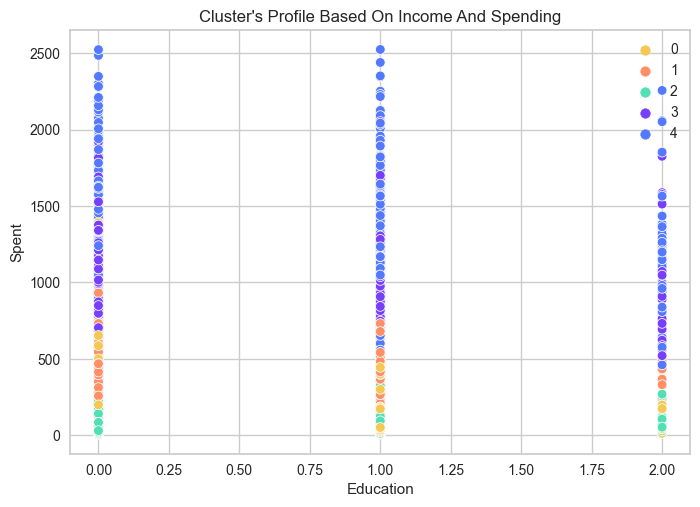

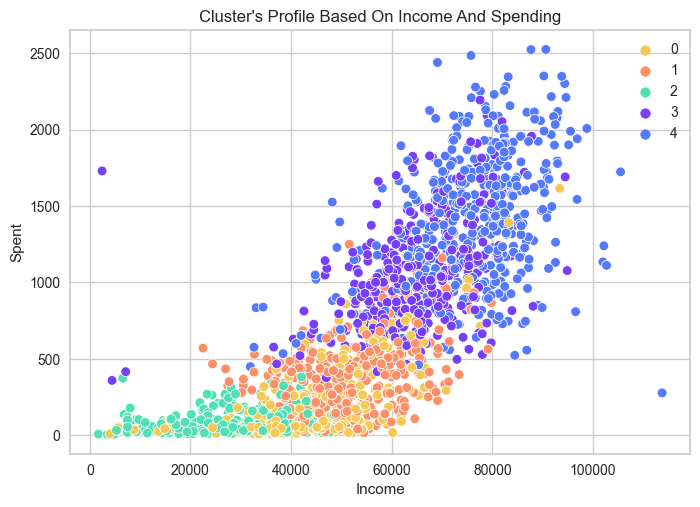

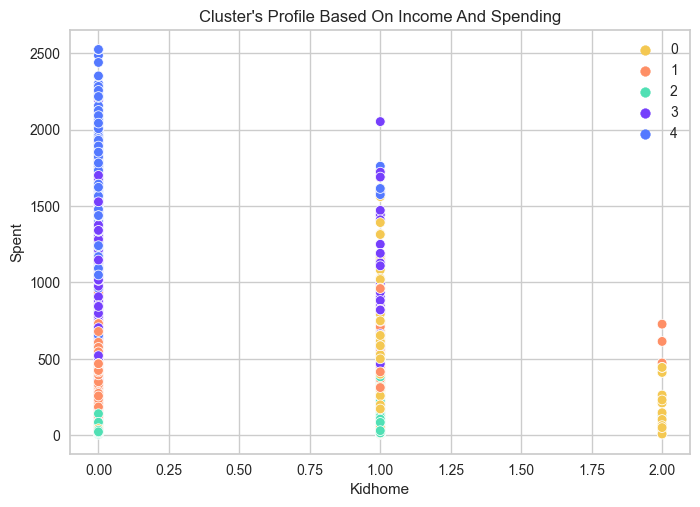

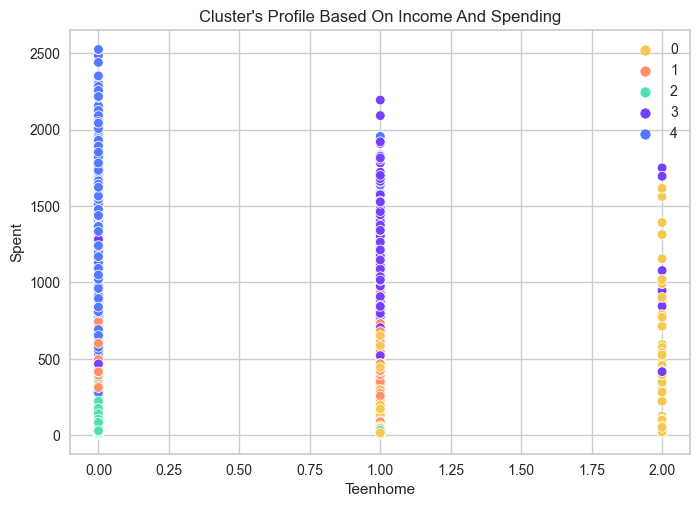

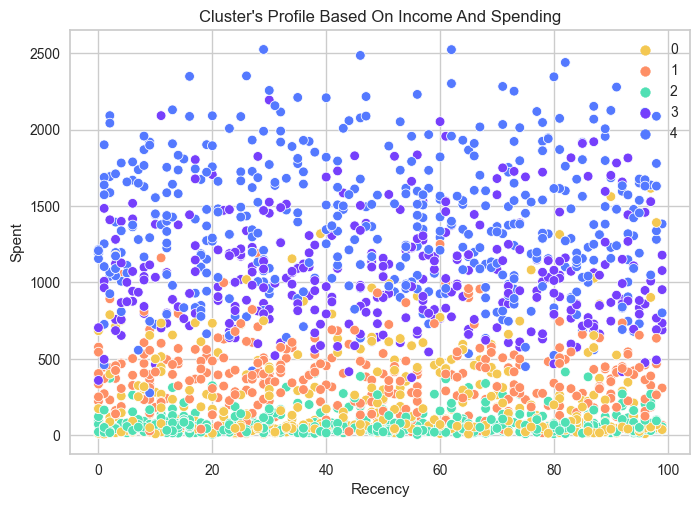

...

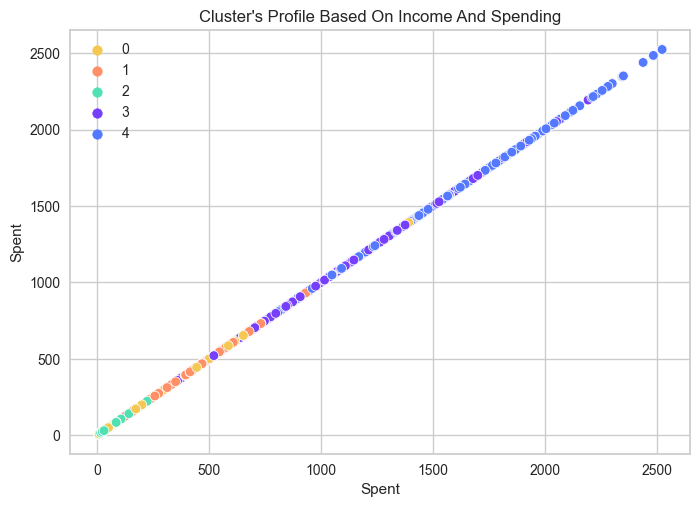

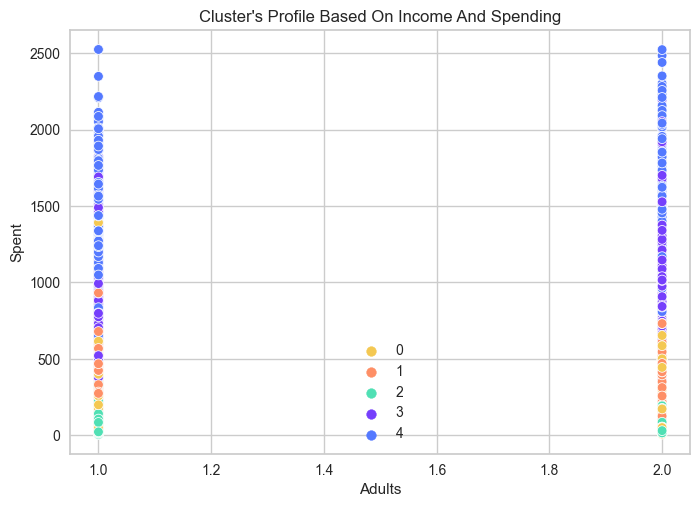

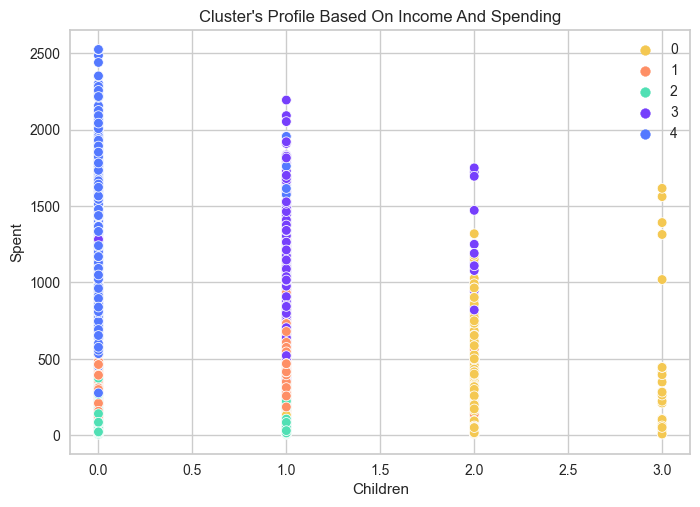

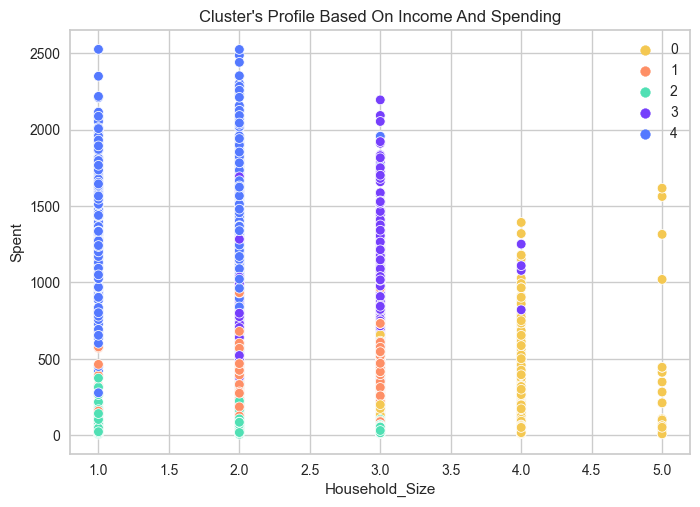

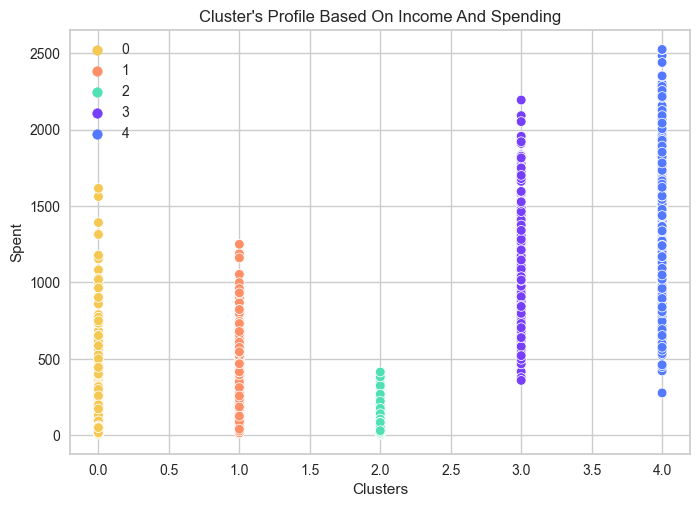

In [68]:
for feature in df2:
    plot(df2, feature)

In [157]:
g = df2.groupby(['Clusters'])
c1 = g.get_group(0)
c2 = g.get_group(1)
c3= g.get_group(2)
c4= g.get_group(3)
c5 = g.get_group(4)

In [158]:
print('group 1')
print('average wine purchase:', c1['Wines'].mean())
print('average fruit purchase:', c1['Fruits'].mean())
print('average meat purchase:', c1['Meat'].mean())
print('average fish purchase:', c1['Fish'].mean())
print('average sweets purchase:', c1['Sweets'].mean())
print('average gold purchase:', c1['Gold'].mean())

group 1
average wine purchase: 129.15929203539824
average fruit purchase: 5.710176991150442
average meat purchase: 43.39823008849557
average fish purchase: 7.601769911504425
average sweets purchase: 6.057522123893805
average gold purchase: 21.81858407079646


In [159]:
print('group 2')
print('average wine purchase:', c2['Wines'].mean())
print('average fruit purchase:', c2['Fruits'].mean())
print('average meat purchase:', c2['Meat'].mean())
print('average fish purchase:', c2['Fish'].mean())
print('average sweets purchase:', c2['Sweets'].mean())
print('average gold purchase:', c2['Gold'].mean())

group 2
average wine purchase: 218.79144385026737
average fruit purchase: 12.473262032085561
average meat purchase: 70.75935828877006
average fish purchase: 20.676470588235293
average sweets purchase: 12.946524064171124
average gold purchase: 35.8716577540107


In [160]:
print('group 3')
print('average wine purchase:', c3['Wines'].mean())
print('average fruit purchase:', c3['Fruits'].mean())
print('average meat purchase:', c3['Meat'].mean())
print('average fish purchase:', c3['Fish'].mean())
print('average sweets purchase:', c3['Sweets'].mean())
print('average gold purchase:', c3['Gold'].mean())

group 3
average wine purchase: 22.273764258555133
average fruit purchase: 5.4562737642585555
average meat purchase: 20.0
average fish purchase: 7.56083650190114
average sweets purchase: 5.4505703422053235
average gold purchase: 15.123574144486692


In [161]:
print('group 4')
print('average wine purchase:', c4['Wines'].mean())
print('average fruit purchase:', c4['Fruits'].mean())
print('average meat purchase:', c4['Meat'].mean())
print('average fish purchase:', c4['Fish'].mean())
print('average sweets purchase:', c4['Sweets'].mean())
print('average gold purchase:', c4['Gold'].mean())

group 4
average wine purchase: 615.983379501385
average fruit purchase: 42.7202216066482
average meat purchase: 213.24653739612188
average fish purchase: 54.59556786703601
average sweets purchase: 44.18559556786703
average gold purchase: 78.22991689750693


In [162]:
print('group 5')
print('average wine purchase:', c5['Wines'].mean())
print('average fruit purchase:', c5['Fruits'].mean())
print('average meat purchase:', c5['Meat'].mean())
print('average fish purchase:', c5['Fish'].mean())
print('average sweets purchase:', c5['Sweets'].mean())
print('average gold purchase:', c5['Gold'].mean())

group 5
average wine purchase: 611.380081300813
average fruit purchase: 66.42479674796748
average meat purchase: 469.3719512195122
average fish purchase: 98.369918699187
average sweets purchase: 67.92682926829268
average gold purchase: 76.5691056910569


In [118]:
def compare2(df, ft):
    sns.distplot(c1[ft], color = "#F4C852", hist=False)
    sns.distplot(c2[ft], color = "#FE8F66", hist=False)
    sns.distplot(c3[ft], color = "#50E0B4", hist=False)
    sns.distplot(c4[ft], color = "#763FFC", hist=False)
    sns.distplot(c5[ft], color = "#5479FF", hist=False)
    plt.show()

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

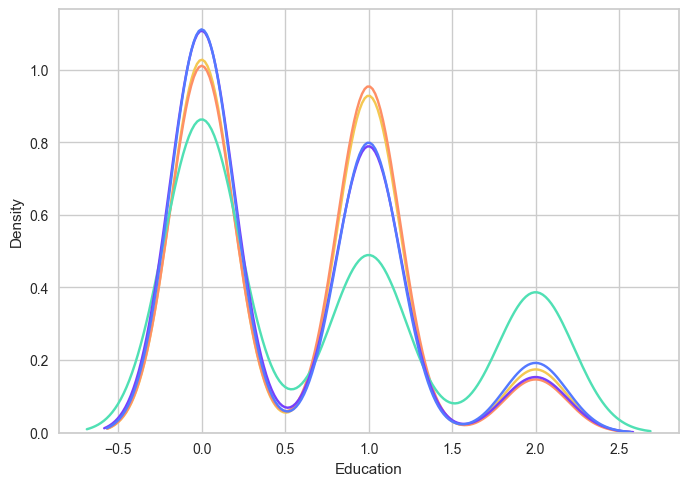

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

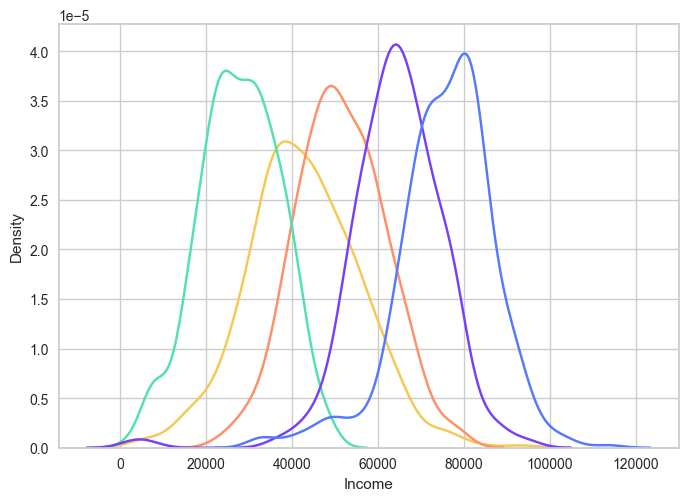

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

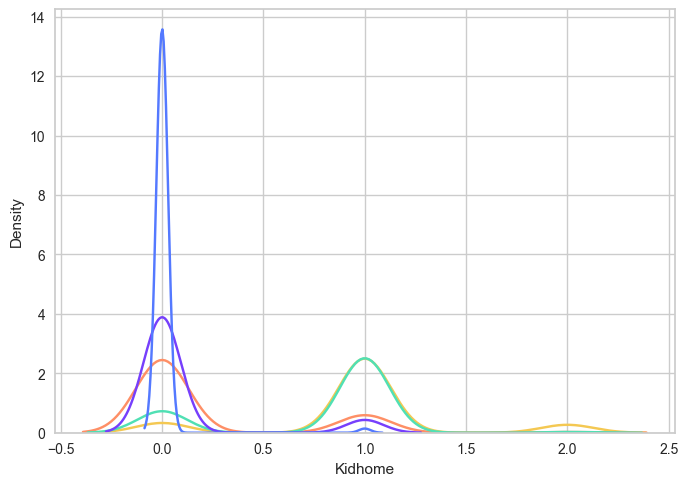

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

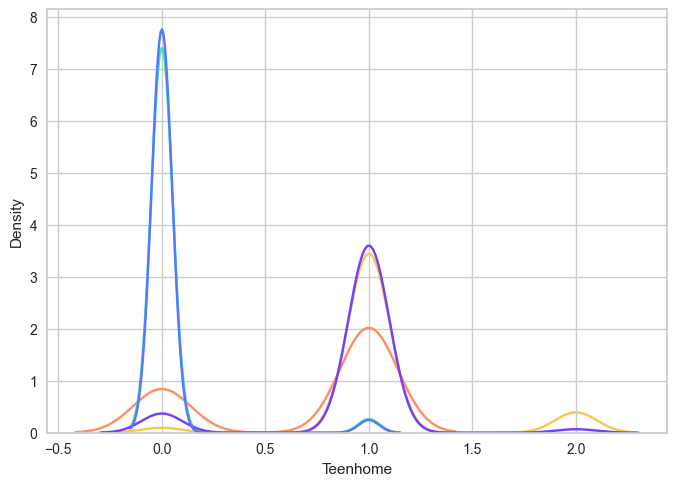

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

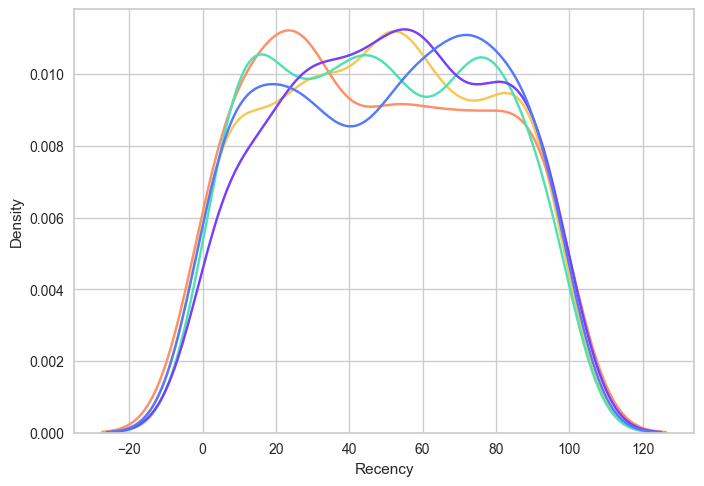

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

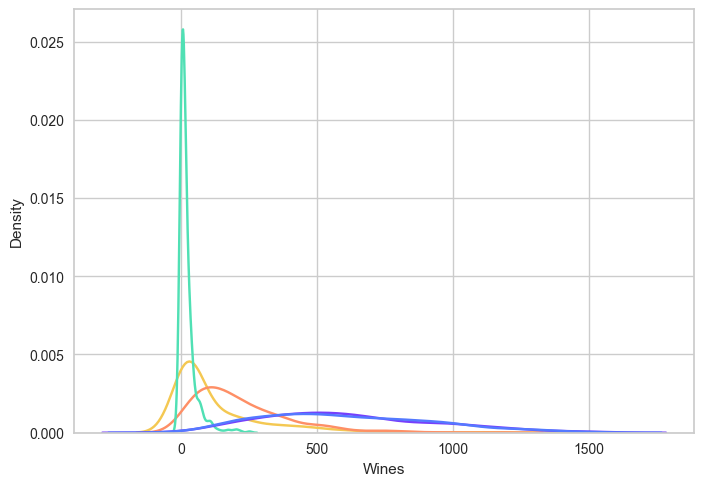

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

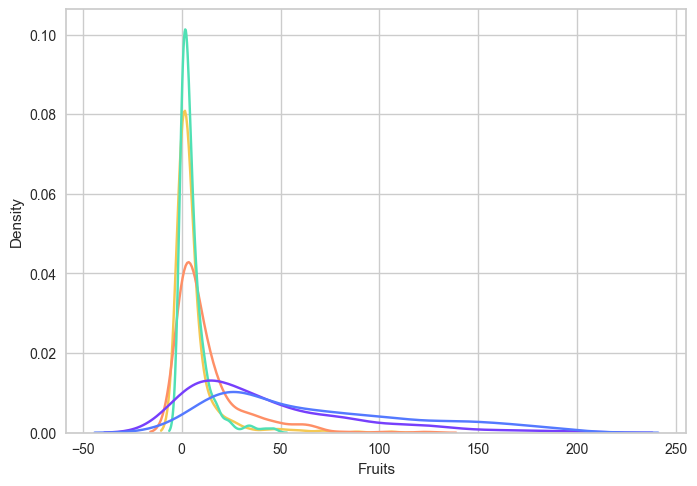

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

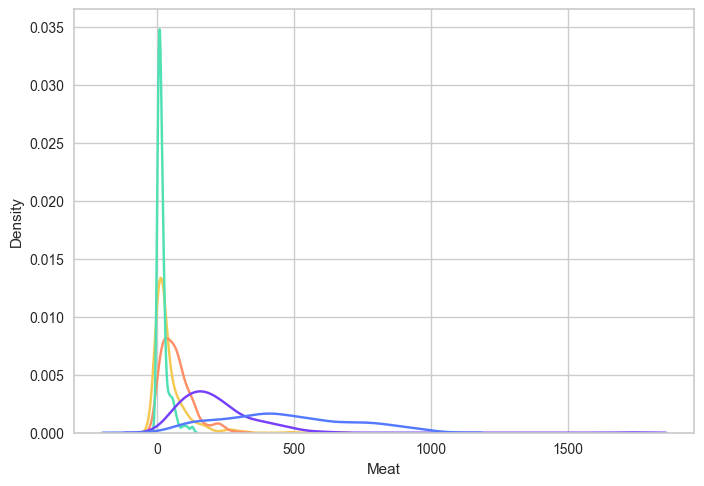

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

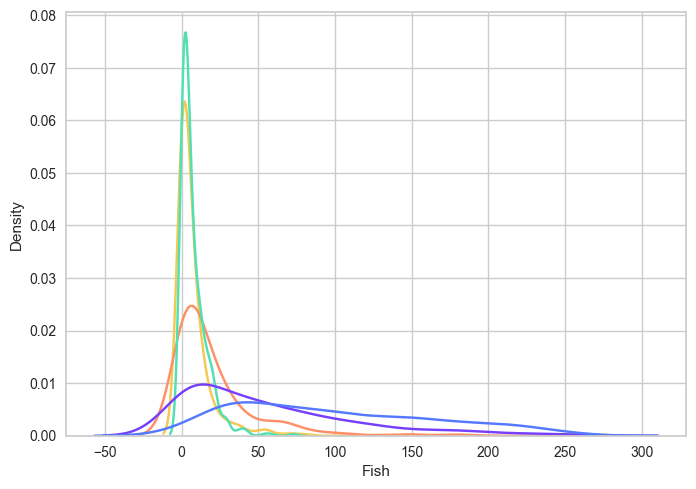

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

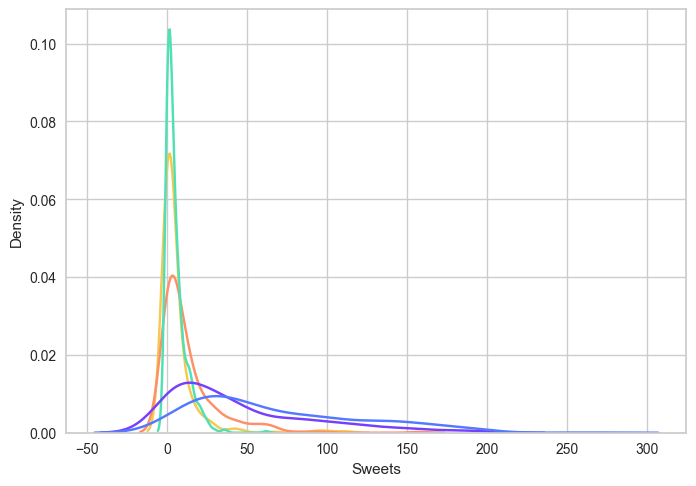

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

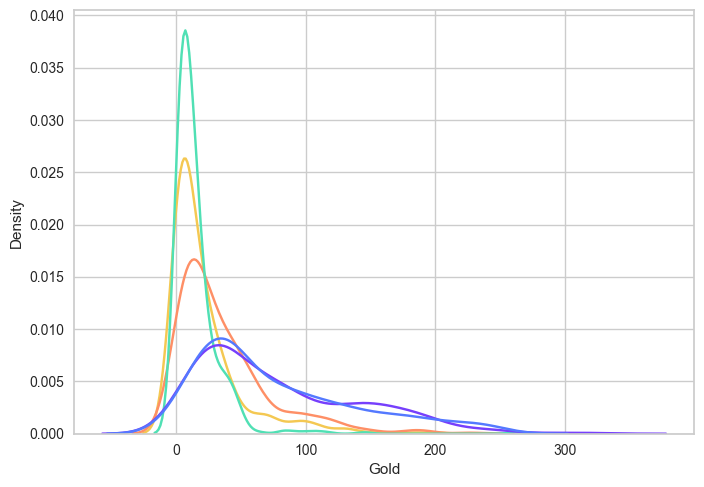

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

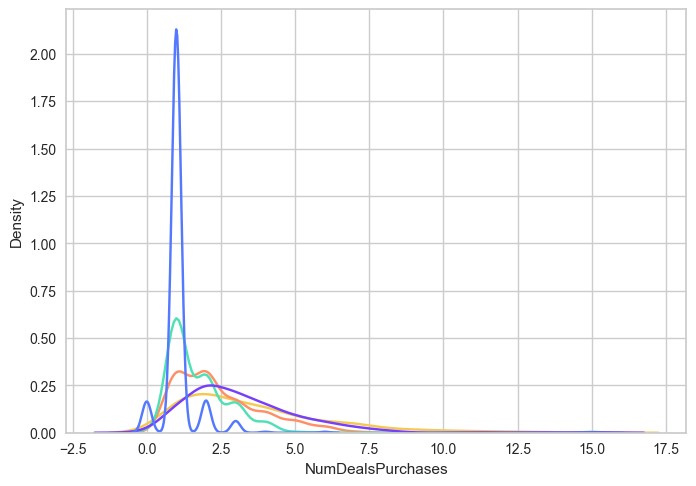

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

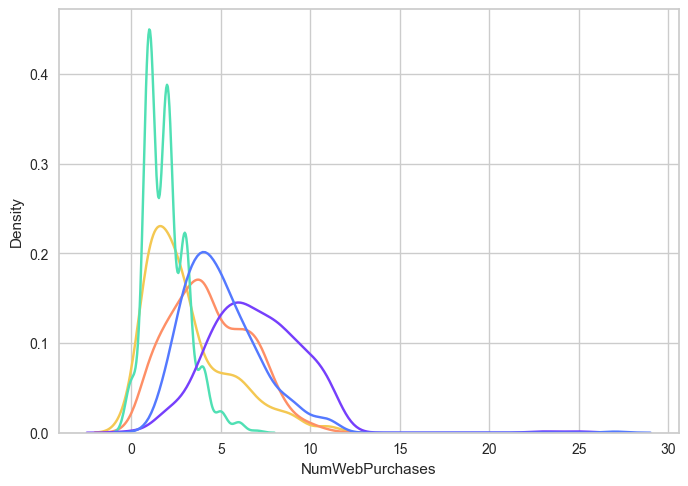

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

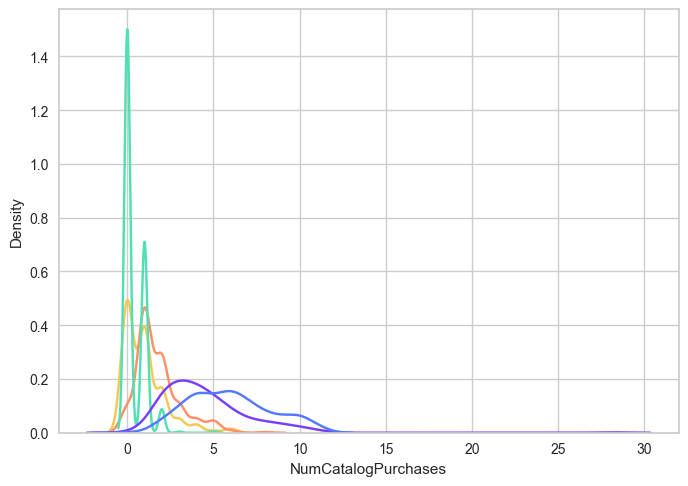

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

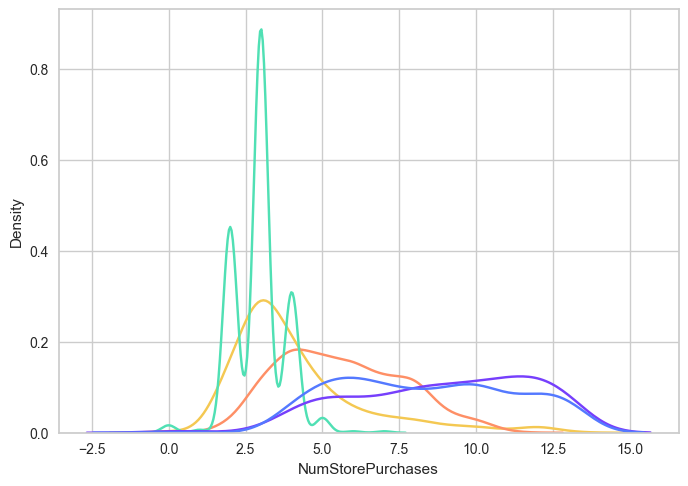

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

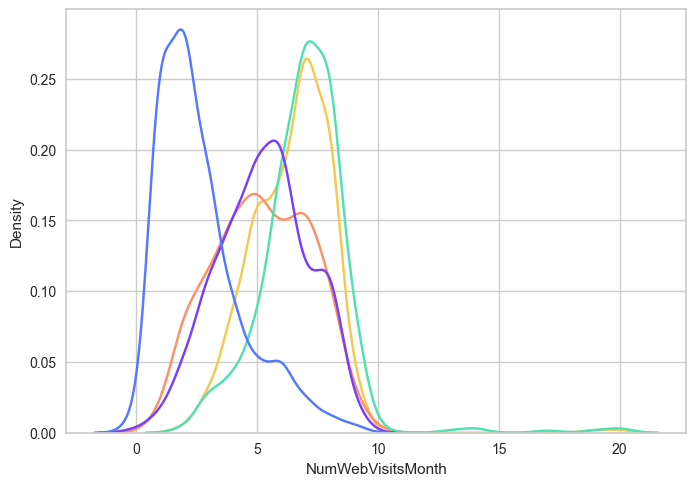

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

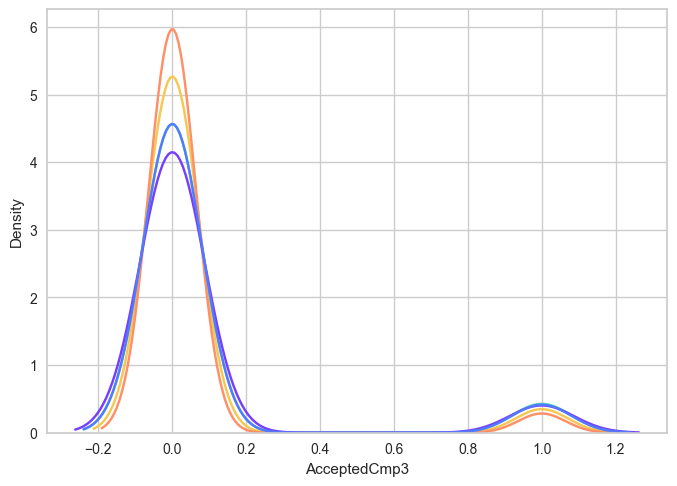

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

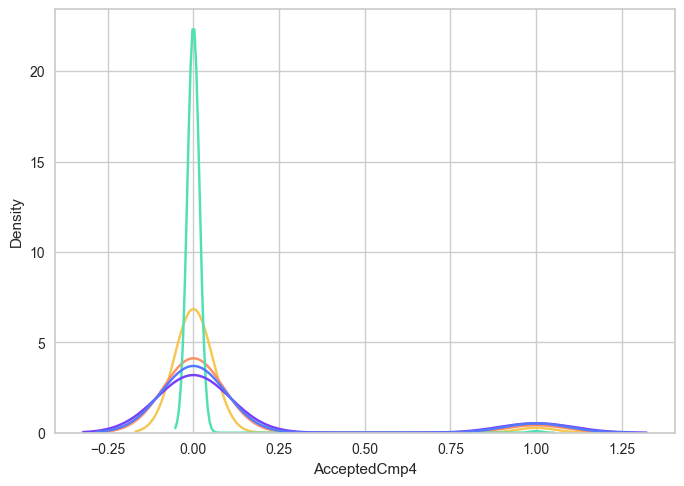

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

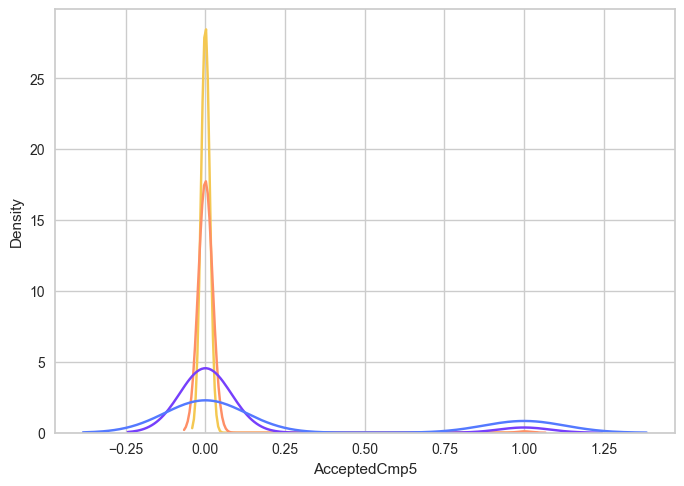

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

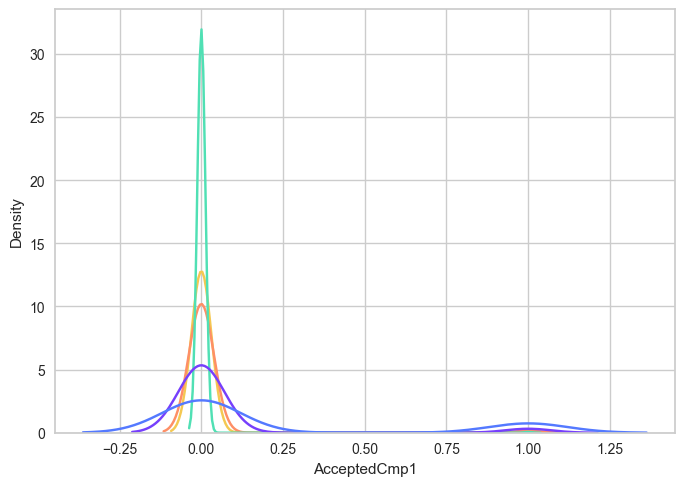

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

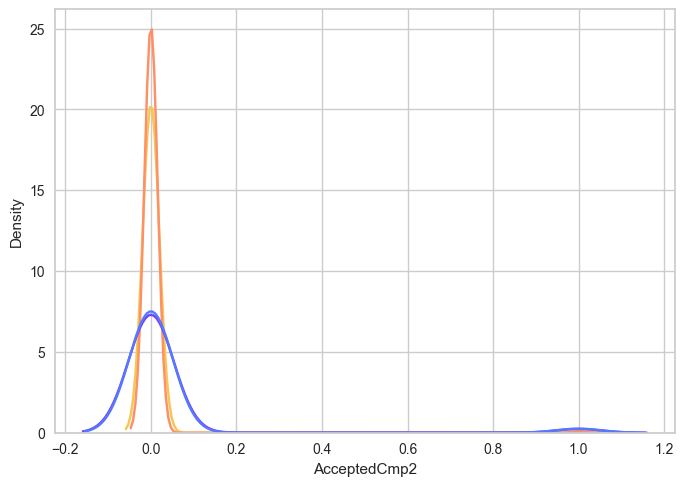

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

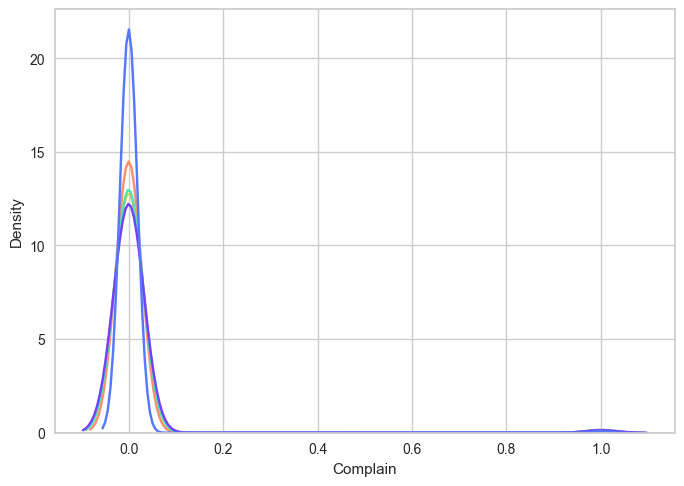

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

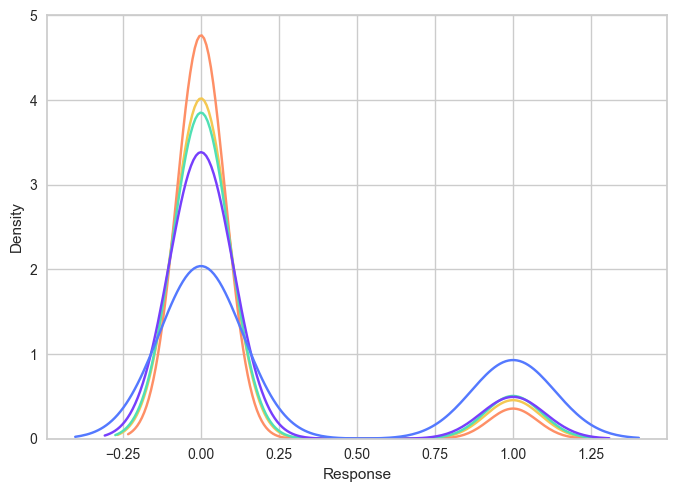

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

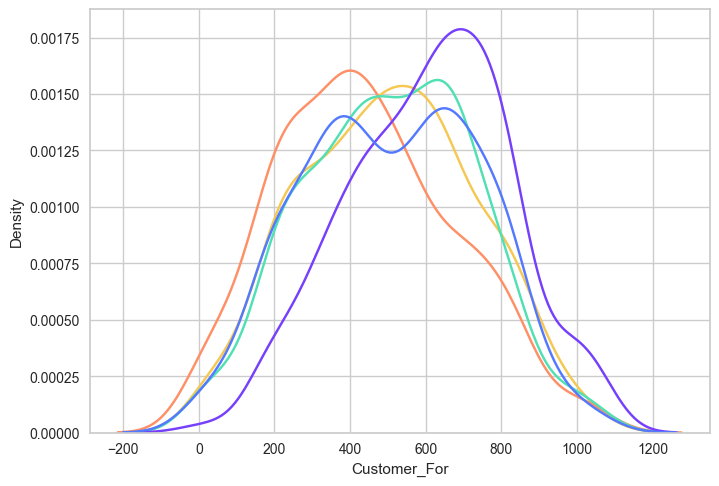

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

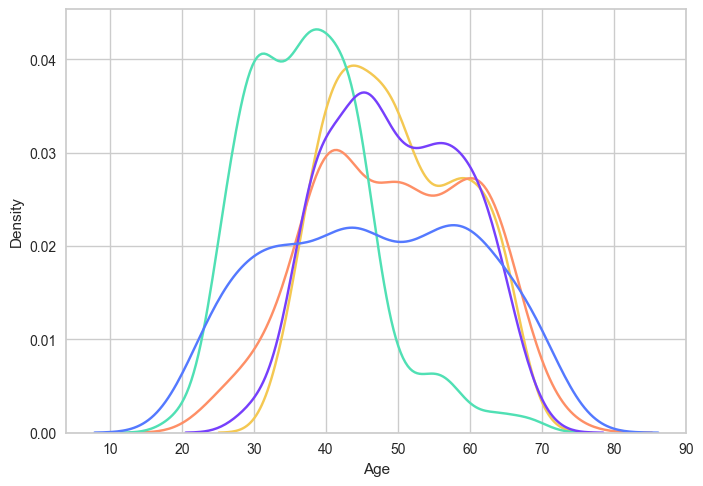

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

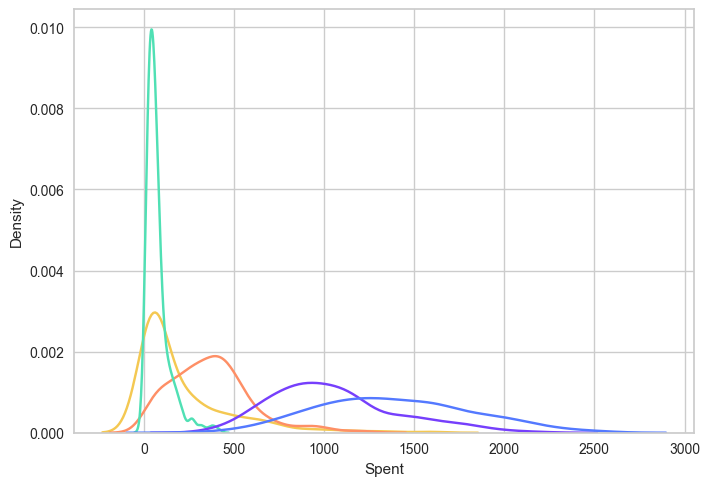

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

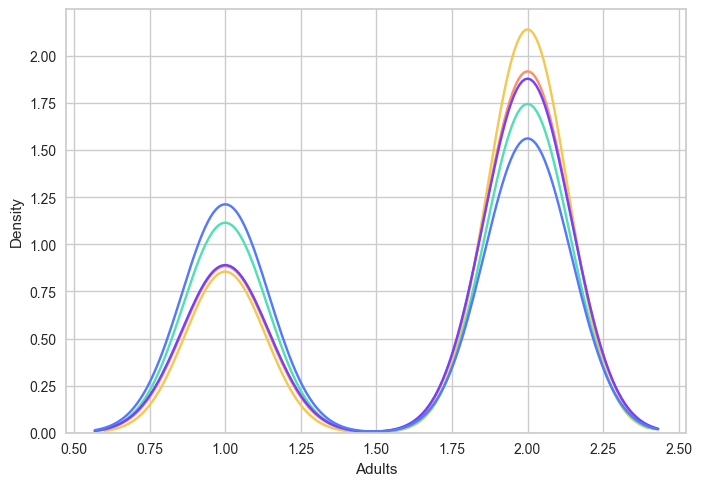

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

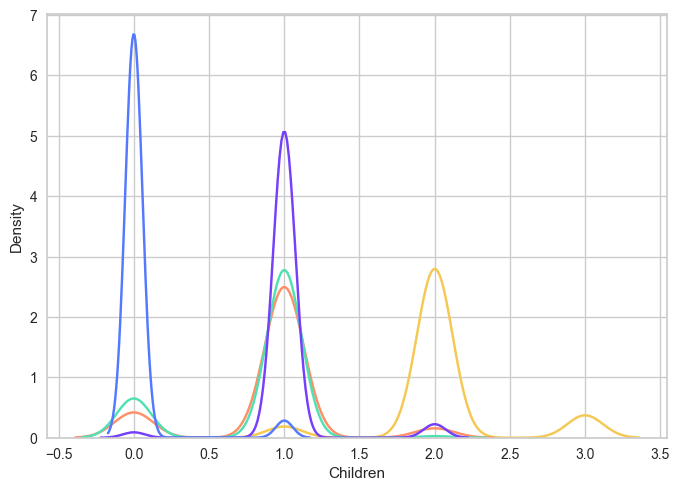

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

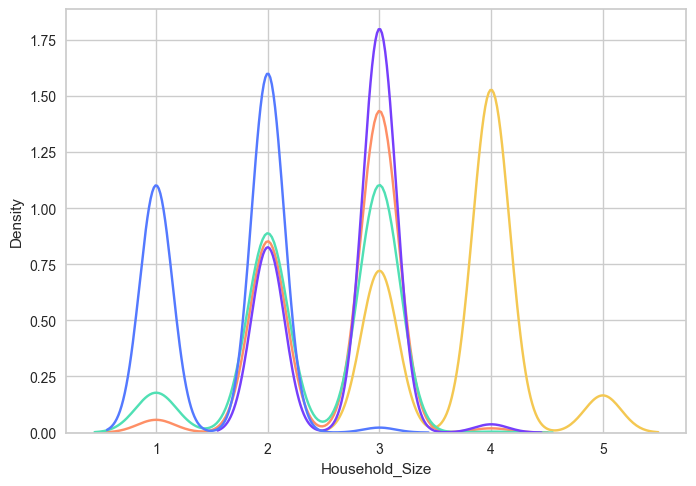

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your

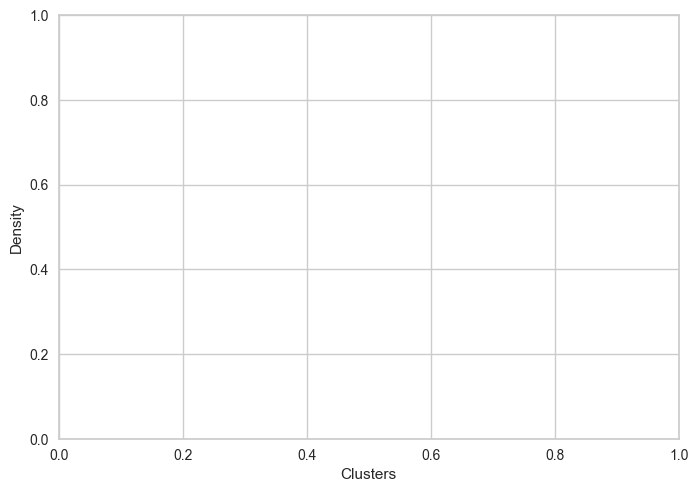

In [119]:
for feature in df2:
    compare2(df2, feature)

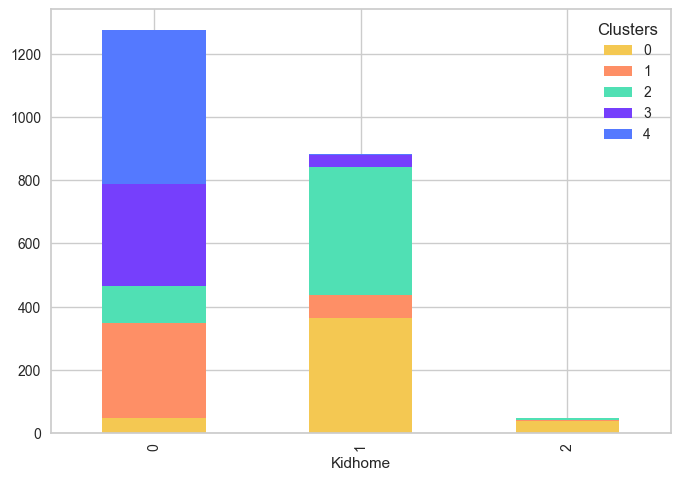

In [187]:
df2.groupby(['Kidhome', 'Clusters']).size().unstack().plot(kind='bar',color = pal, stacked=True)
plt.show()

# -------------K-Modes

In [82]:
df3 = df_cleaned
PC2 = PC.drop(['Clusters'], axis = 1)

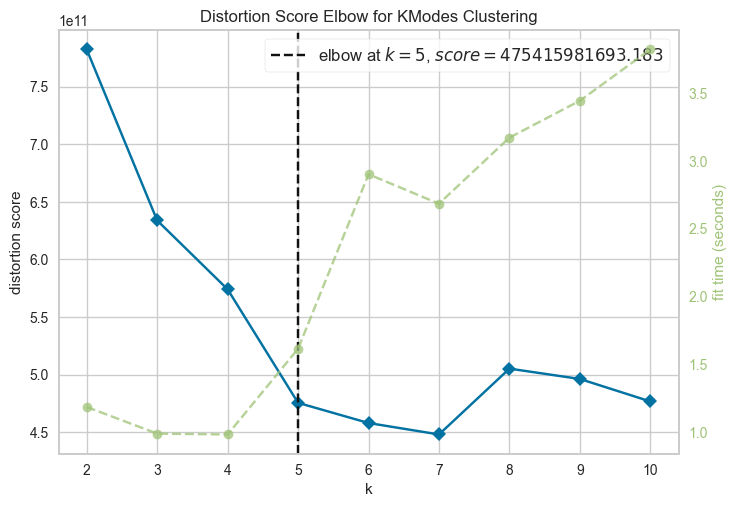

<Axes: title={'center': 'Distortion Score Elbow for KModes Clustering'}, xlabel='k', ylabel='distortion score'>

In [83]:
Elbow_M = KElbowVisualizer(KModes())
Elbow_M.fit(df3)
Elbow_M.show()

In [84]:
kmodes = KModes(n_clusters=5)
y_kmodes = AC.fit_predict(PC2)

In [85]:
PC["Clusters"] = y_kmodes
df2["Clusters"]= y_kmodes

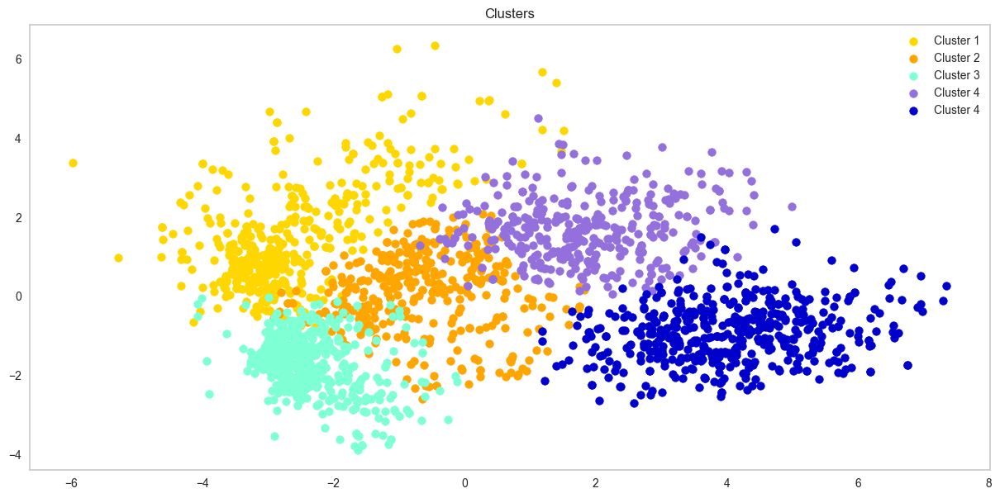

In [120]:
X = np.array(PC)
plt.figure(figsize=(15,7))
plt.scatter(X[y_kmodes == 0, 0], X[y_kmodes == 0, 1], color = 'gold', label = 'Cluster 1',s=50)
plt.scatter(X[y_kmodes == 1, 0], X[y_kmodes == 1, 1], color = 'orange', label = 'Cluster 2',s=50)
plt.scatter(X[y_kmodes == 2, 0], X[y_kmodes == 2, 1], color = 'aquamarine', label = 'Cluster 3',s=50)
plt.scatter(X[y_kmodes == 3, 0], X[y_kmodes == 3, 1], color = 'mediumpurple', label = 'Cluster 4',s=50)
plt.scatter(X[y_kmodes == 4, 0], X[y_kmodes == 4, 1], color = 'mediumblue', label = 'Cluster 4',s=50)

plt.grid(False)
plt.title('Clusters')
plt.legend()
plt.show()

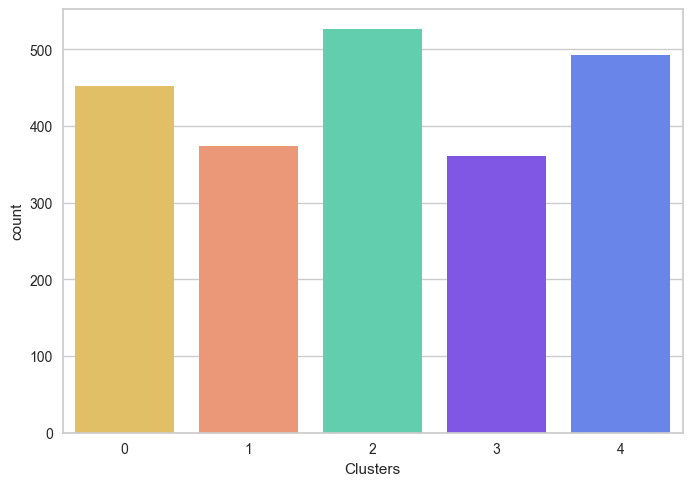

In [87]:
pl = sns.countplot(x=PC["Clusters"], palette= pal)
plt.show()

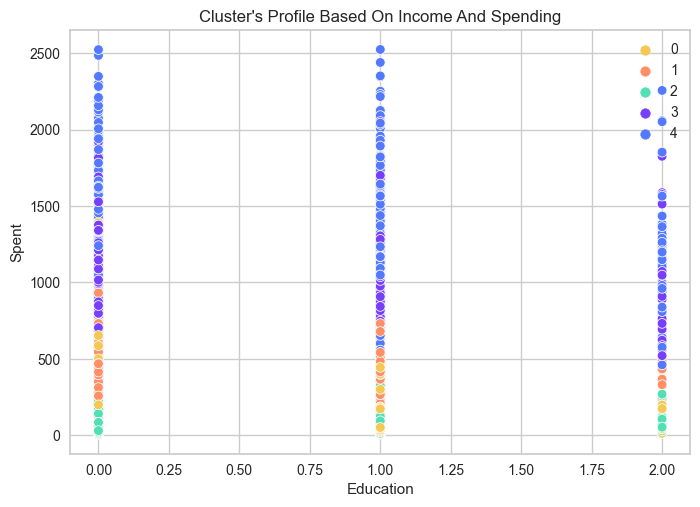

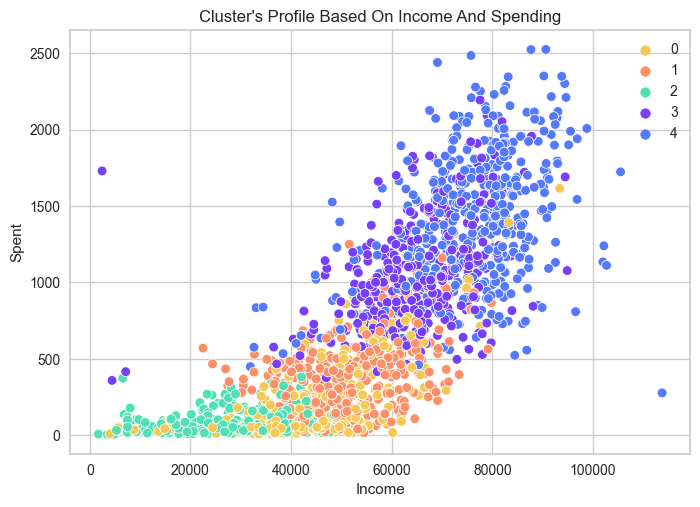

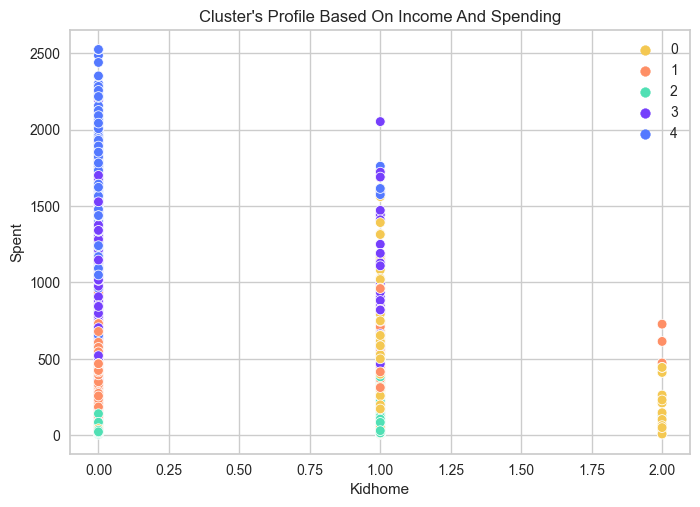

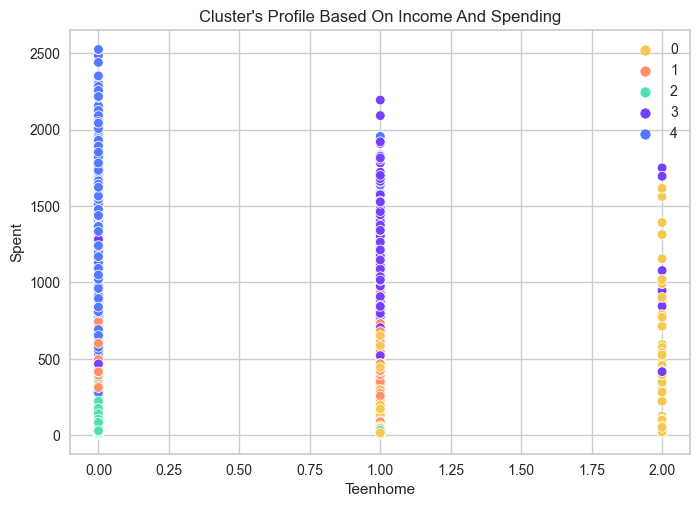

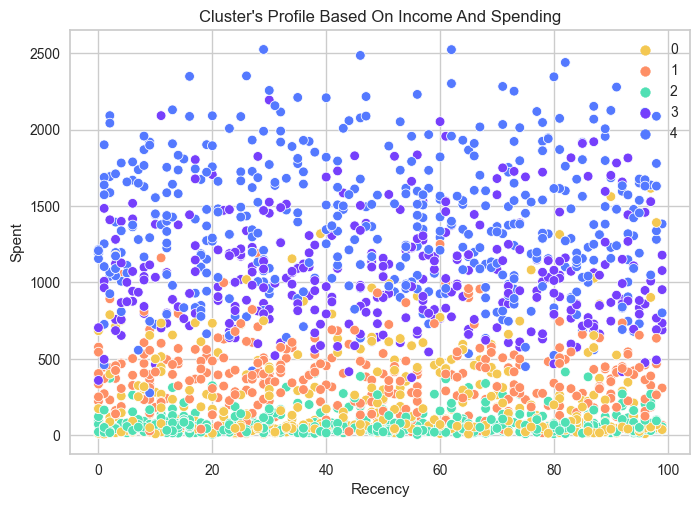

...

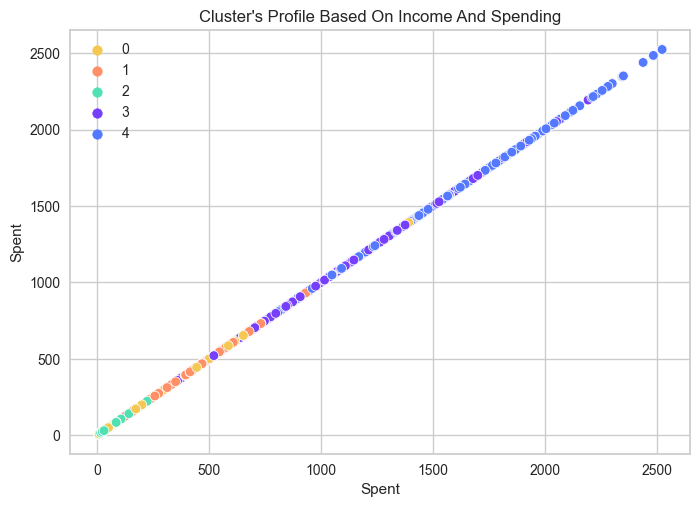

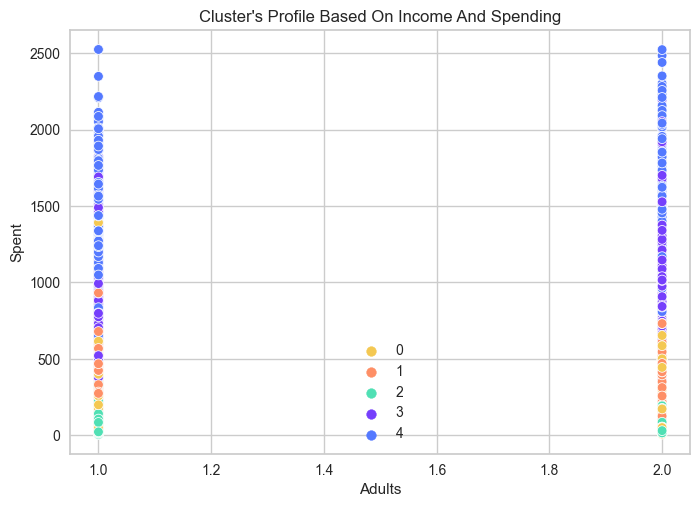

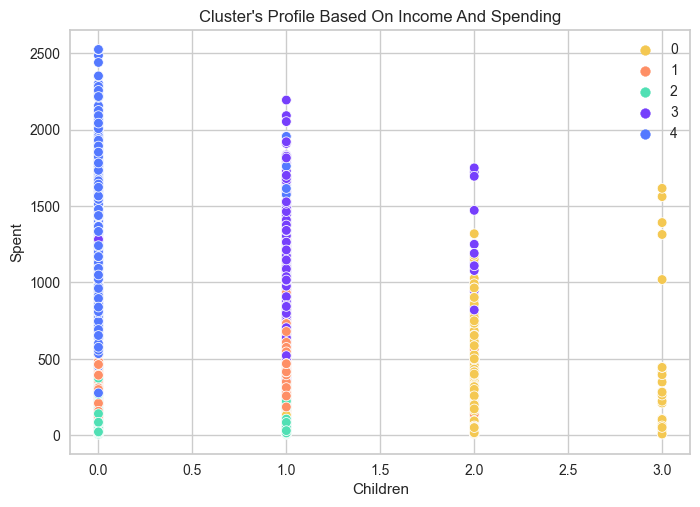

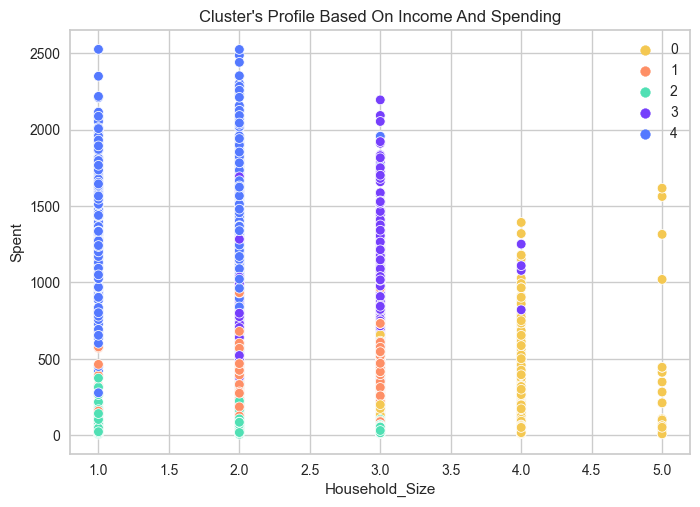

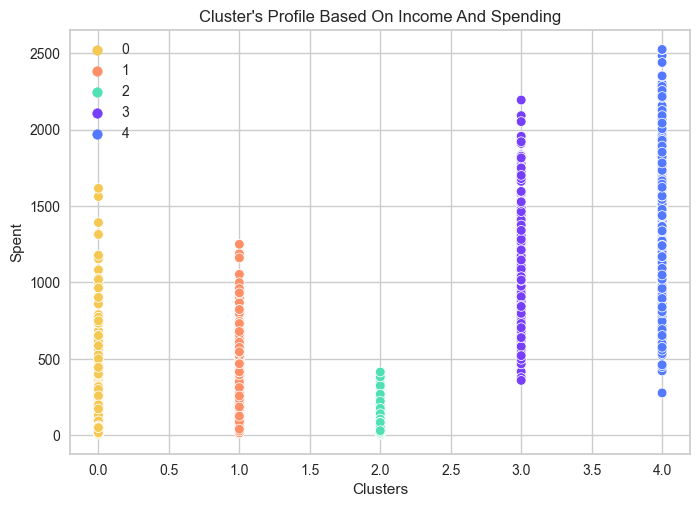

In [88]:
for feature in df3:
    plot(df3, feature)

In [151]:
g = df3.groupby(['Clusters'])
c1 = g.get_group(0)
c2 = g.get_group(1)
c3= g.get_group(2)
c4= g.get_group(3)
c5= g.get_group(4)

In [152]:
print('group 1')
print('average wine purchase:', c1['Wines'].mean())
print('average fruit purchase:', c1['Fruits'].mean())
print('average meat purchase:', c1['Meat'].mean())
print('average fish purchase:', c1['Fish'].mean())
print('average sweets purchase:', c1['Sweets'].mean())
print('average gold purchase:', c1['Gold'].mean())

group 1
average wine purchase: 129.15929203539824
average fruit purchase: 5.710176991150442
average meat purchase: 43.39823008849557
average fish purchase: 7.601769911504425
average sweets purchase: 6.057522123893805
average gold purchase: 21.81858407079646


In [153]:
print('group 2')
print('average wine purchase:', c2['Wines'].mean())
print('average fruit purchase:', c2['Fruits'].mean())
print('average meat purchase:', c2['Meat'].mean())
print('average fish purchase:', c2['Fish'].mean())
print('average sweets purchase:', c2['Sweets'].mean())
print('average gold purchase:', c2['Gold'].mean())

group 2
average wine purchase: 218.79144385026737
average fruit purchase: 12.473262032085561
average meat purchase: 70.75935828877006
average fish purchase: 20.676470588235293
average sweets purchase: 12.946524064171124
average gold purchase: 35.8716577540107


In [154]:
print('group 3')
print('average wine purchase:', c3['Wines'].mean())
print('average fruit purchase:', c3['Fruits'].mean())
print('average meat purchase:', c3['Meat'].mean())
print('average fish purchase:', c3['Fish'].mean())
print('average sweets purchase:', c3['Sweets'].mean())
print('average gold purchase:', c3['Gold'].mean())

group 3
average wine purchase: 22.273764258555133
average fruit purchase: 5.4562737642585555
average meat purchase: 20.0
average fish purchase: 7.56083650190114
average sweets purchase: 5.4505703422053235
average gold purchase: 15.123574144486692


In [155]:
print('group 4')
print('average wine purchase:', c4['Wines'].mean())
print('average fruit purchase:', c4['Fruits'].mean())
print('average meat purchase:', c4['Meat'].mean())
print('average fish purchase:', c4['Fish'].mean())
print('average sweets purchase:', c4['Sweets'].mean())
print('average gold purchase:', c4['Gold'].mean())

group 4
average wine purchase: 615.983379501385
average fruit purchase: 42.7202216066482
average meat purchase: 213.24653739612188
average fish purchase: 54.59556786703601
average sweets purchase: 44.18559556786703
average gold purchase: 78.22991689750693


In [170]:
print('group 5')
print('average wine purchase:', c5['Wines'].mean())
print('average fruit purchase:', c5['Fruits'].mean())
print('average meat purchase:', c5['Meat'].mean())
print('average fish purchase:', c5['Fish'].mean())
print('average sweets purchase:', c5['Sweets'].mean())
print('average gold purchase:', c5['Gold'].mean())

group 5
average wine purchase: 611.380081300813
average fruit purchase: 66.42479674796748
average meat purchase: 469.3719512195122
average fish purchase: 98.369918699187
average sweets purchase: 67.92682926829268
average gold purchase: 76.5691056910569


In [131]:
def compare2(df, ft):
    sns.distplot(c1[ft], color = "#F4C852", hist=False)
    sns.distplot(c2[ft], color = "#FE8F66", hist=False)
    sns.distplot(c3[ft], color = "#50E0B4", hist=False)
    sns.distplot(c4[ft], color = "#763FFC", hist=False)
    sns.distplot(c5[ft], color = "#5479FF", hist=False)
    plt.show()

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

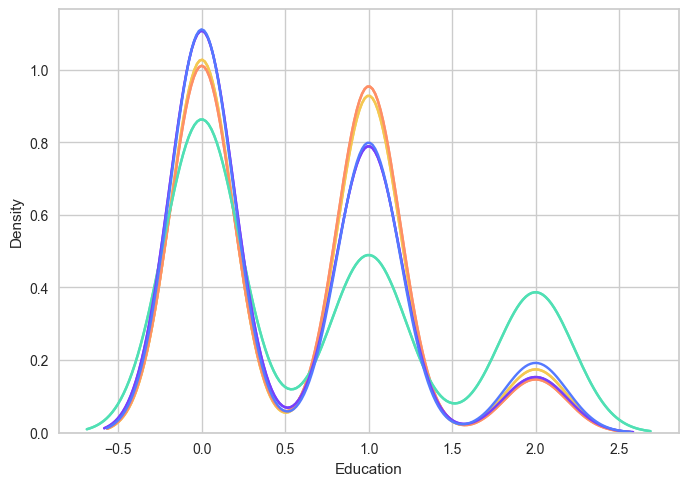

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

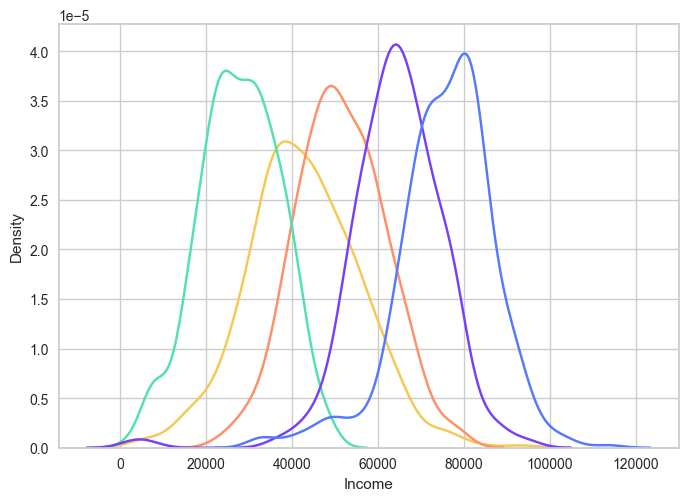

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

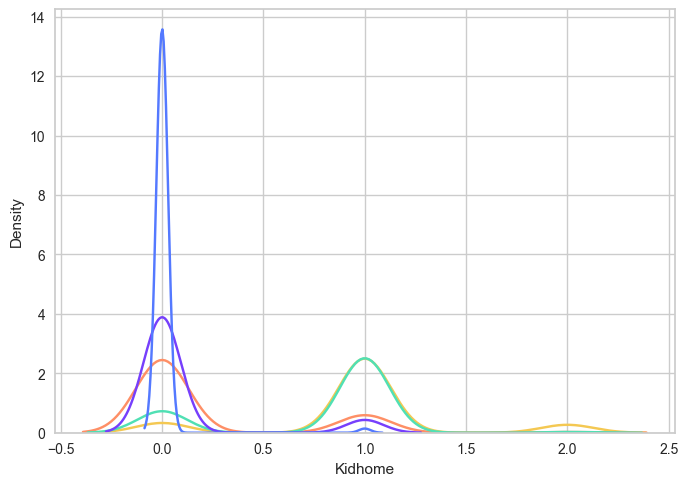

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

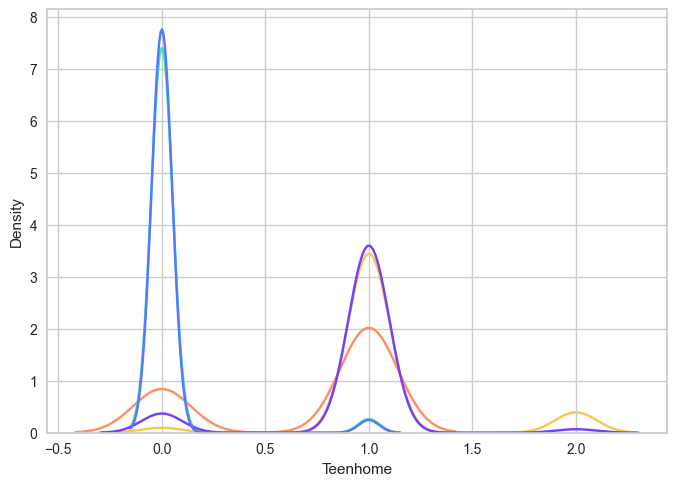

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

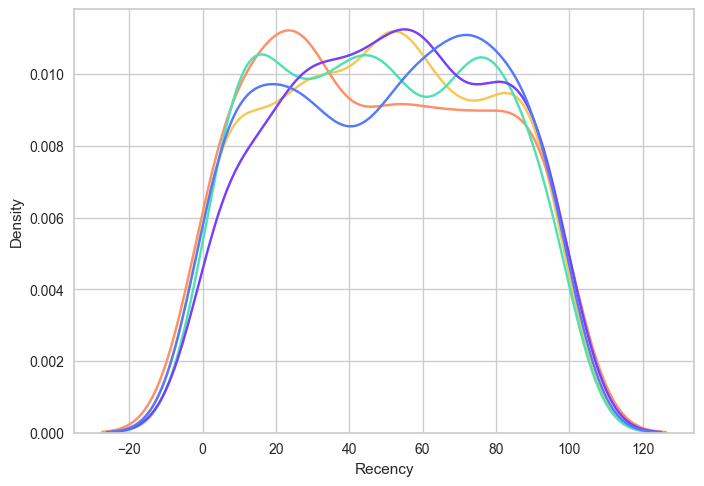

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

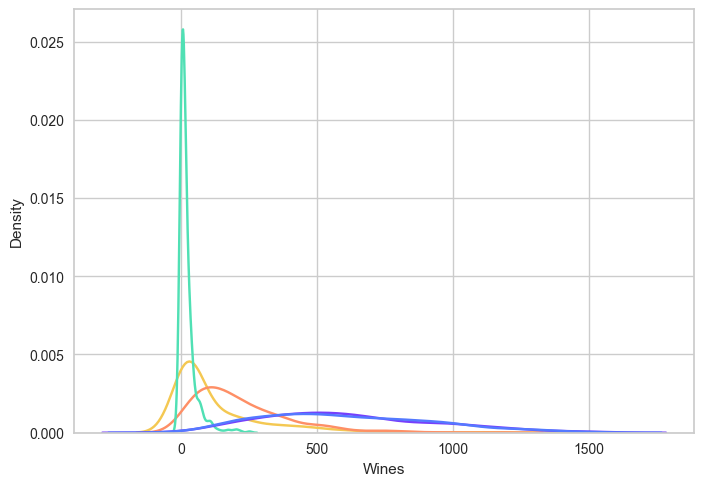

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

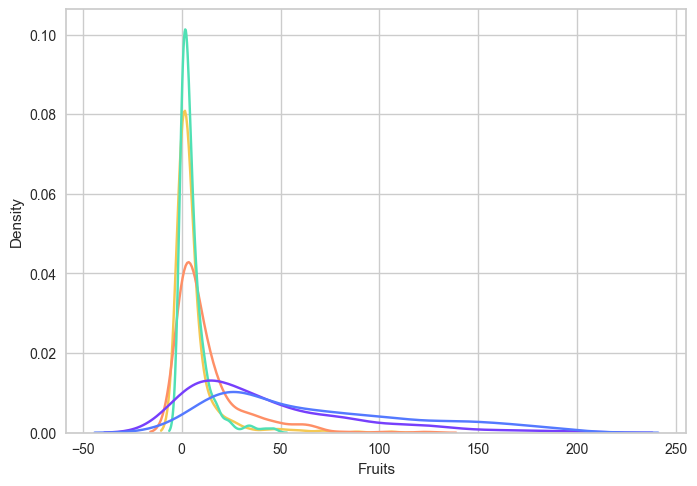

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

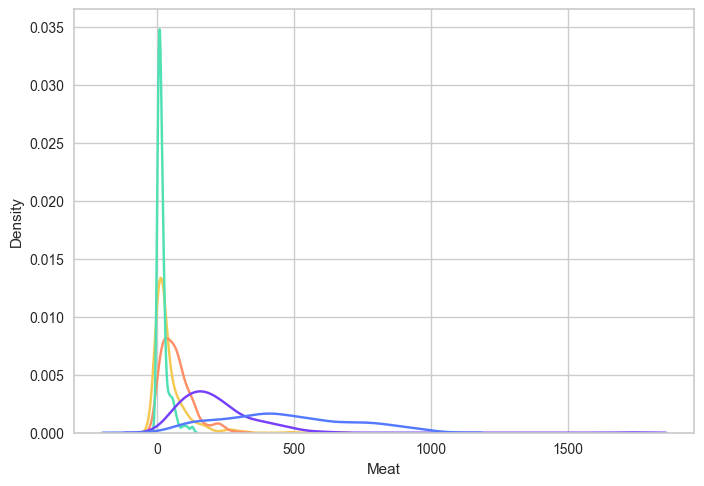

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

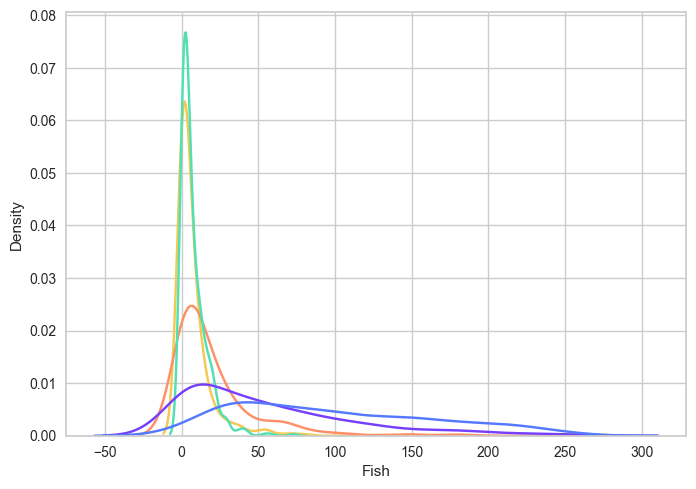

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

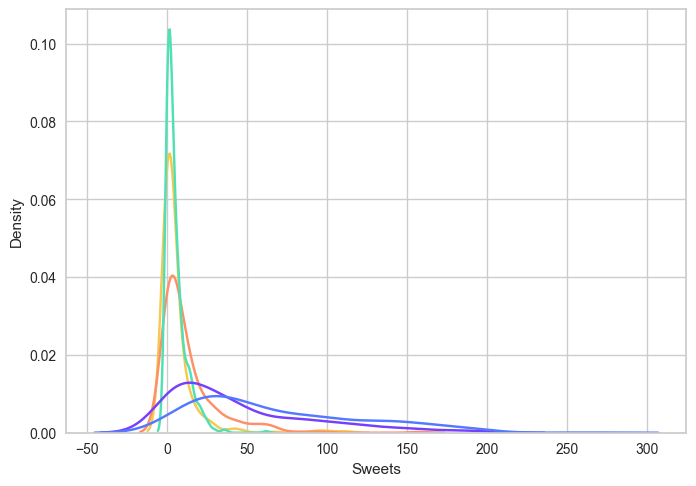

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

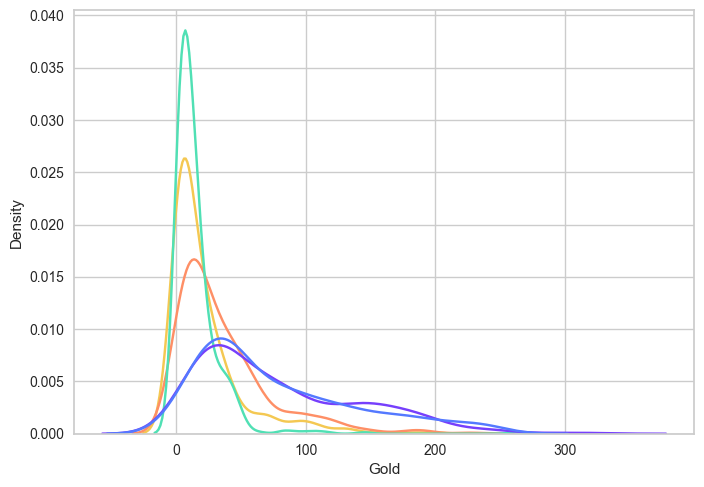

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

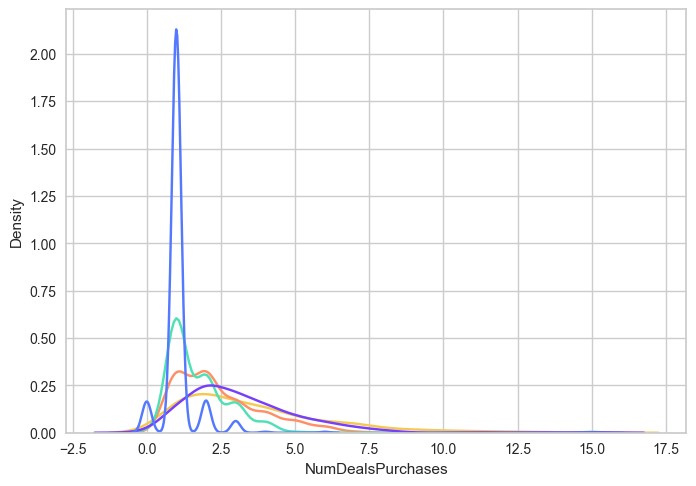

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

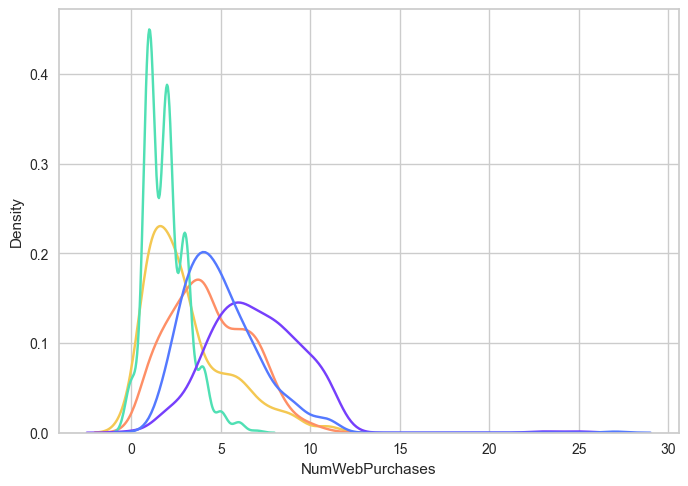

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

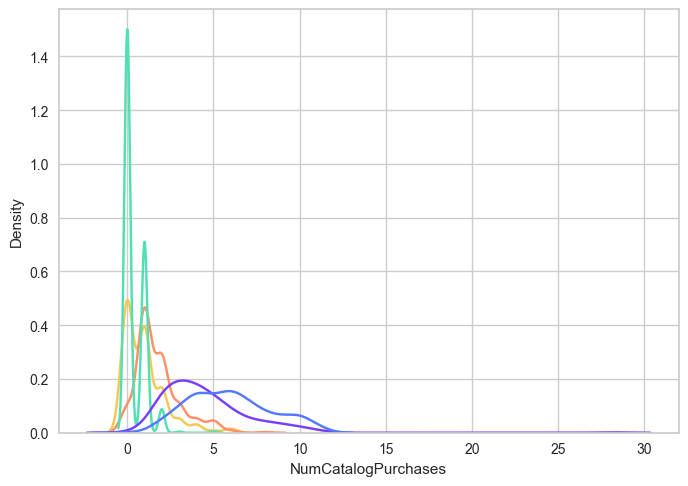

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

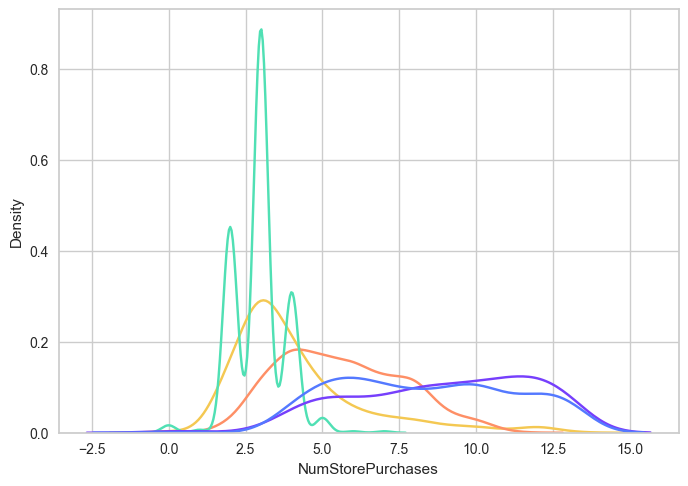

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

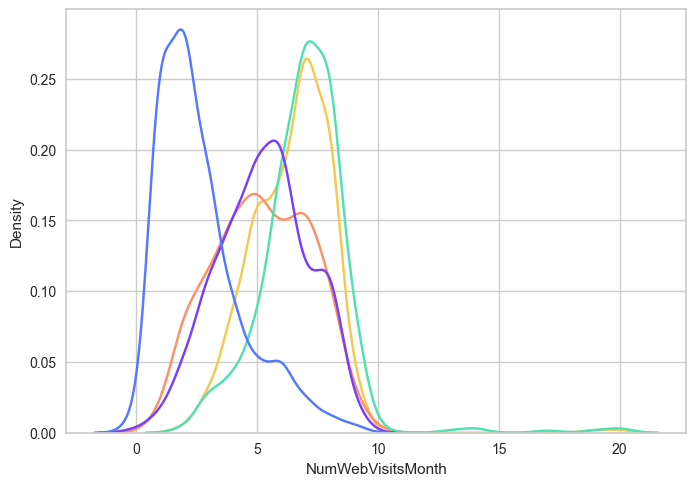

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

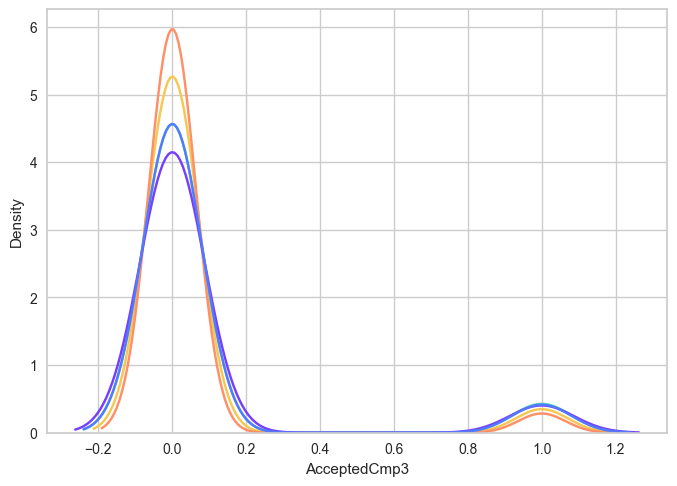

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

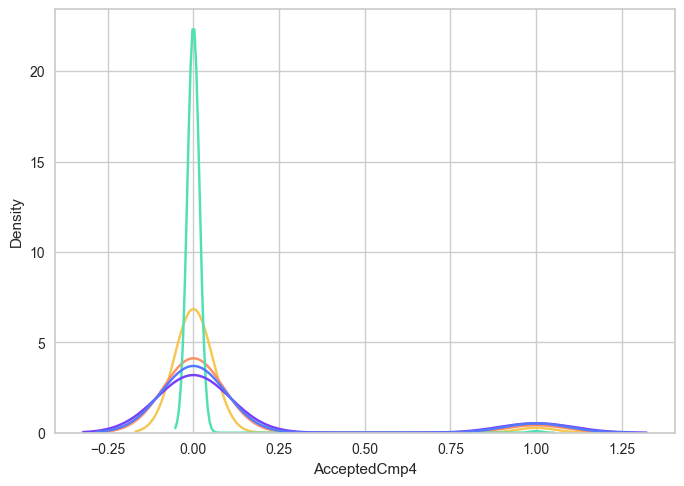

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

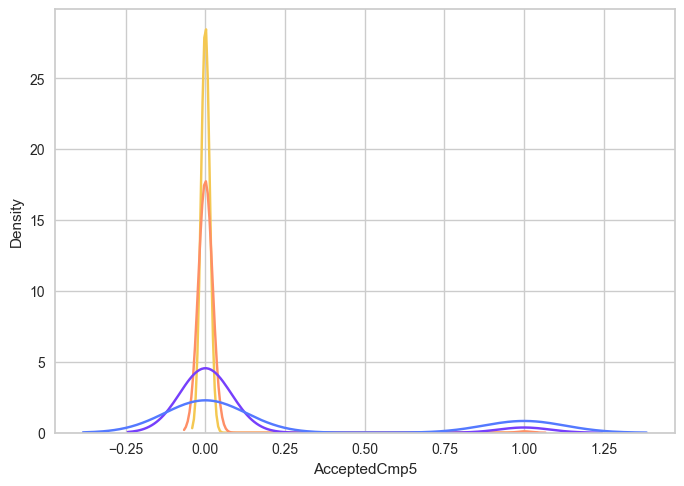

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

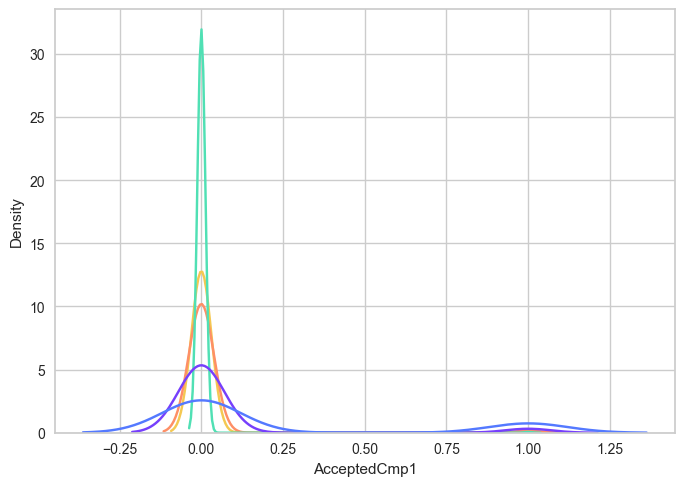

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

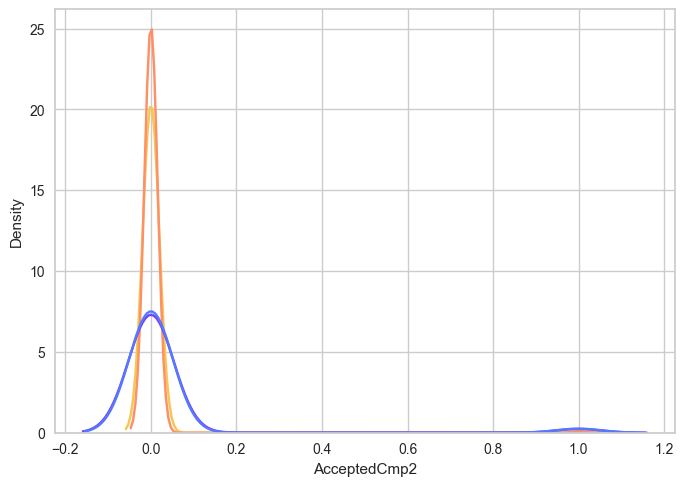

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

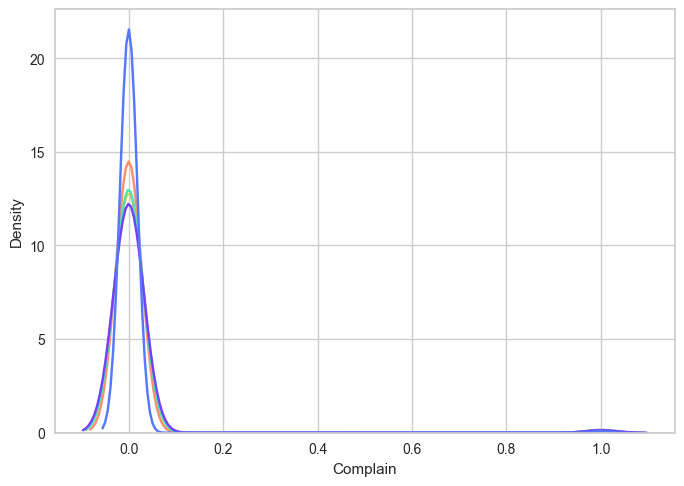

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

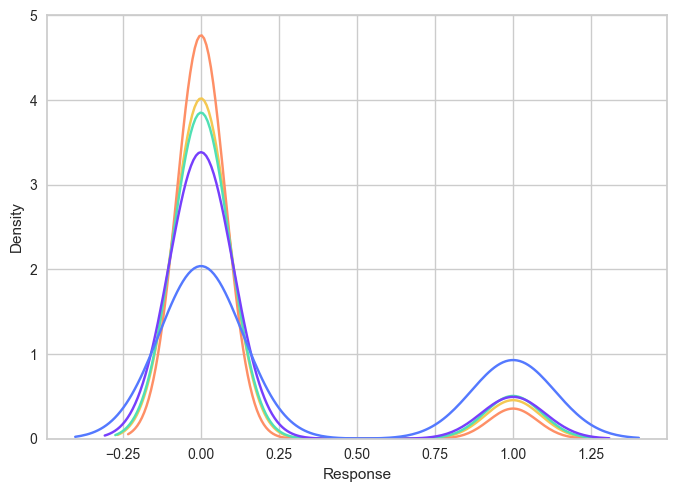

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

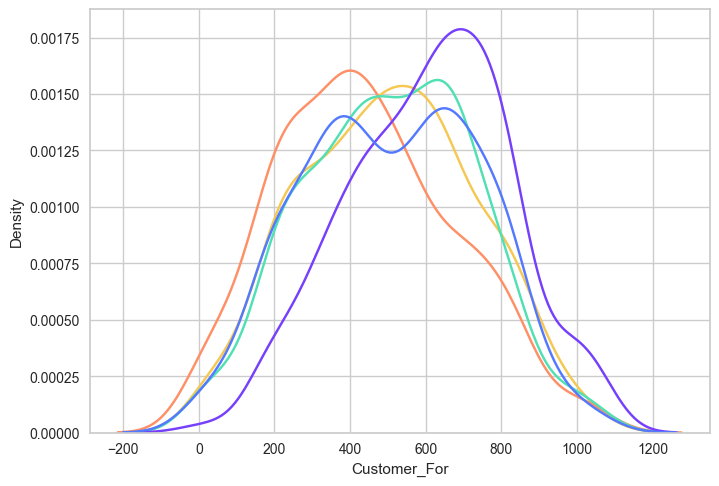

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

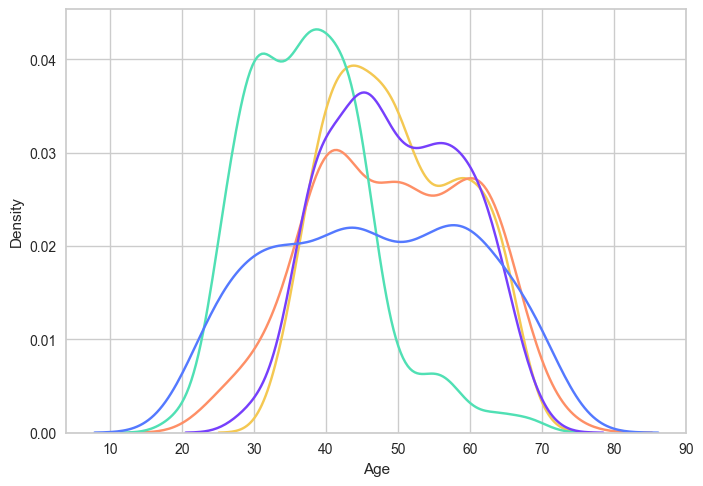

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

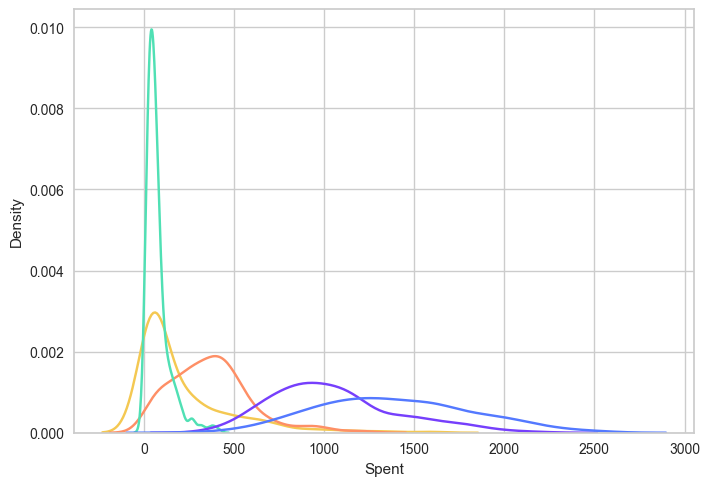

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

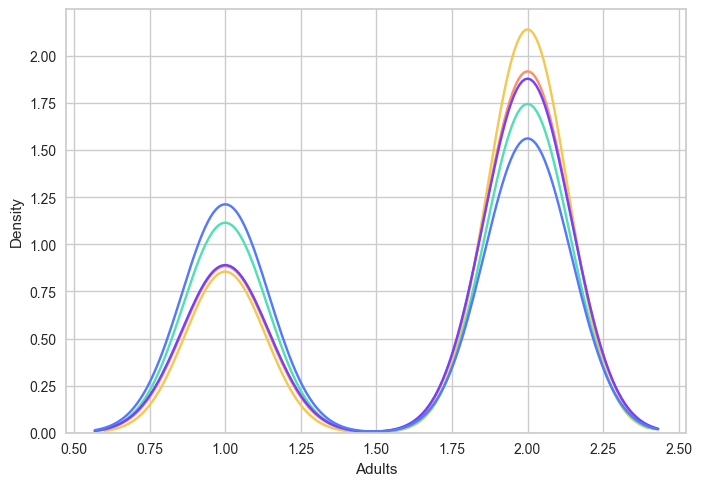

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

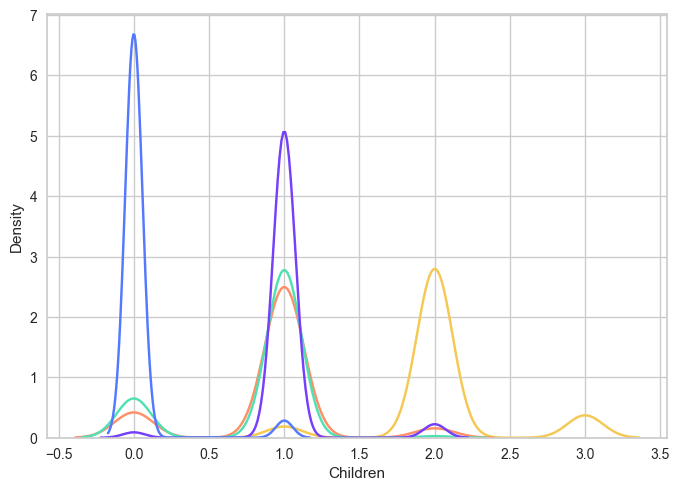

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

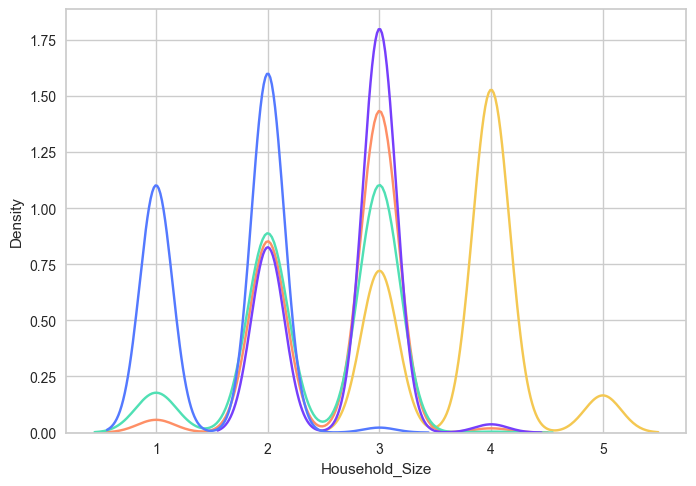

/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(c1[ft], color = "#F4C852", hist=False)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
/var/folders/6n/x3652qj92pv8yrnwqytnq3d40000gn/T/ipykernel_11632/40416616.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your

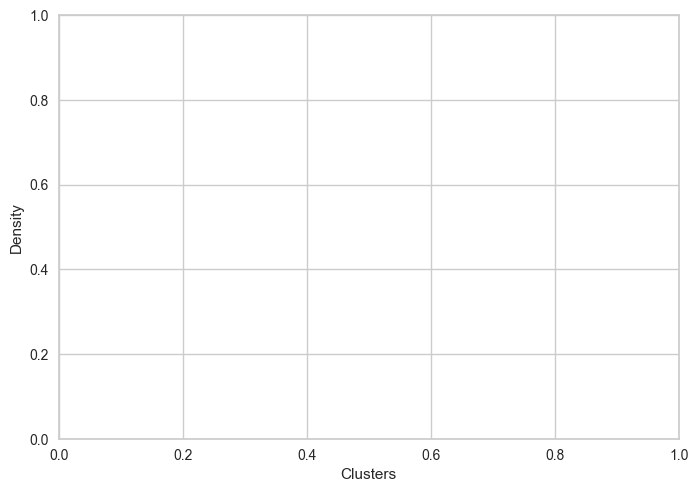

In [132]:
for feature in df3:
    compare2(df3, feature)

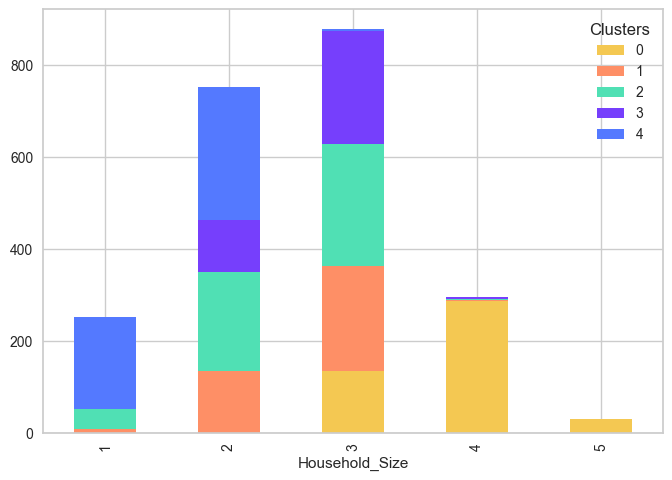

In [127]:
df3.groupby(['Household_Size', 'Clusters']).size().unstack().plot(kind='bar',color = pal, stacked=True)
plt.show()